# Exporatory Data Analysis

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#EDA" data-toc-modified-id="EDA-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>EDA</a></span></li></ul></div>

## Imports

**Basics**

In [1]:
import numpy as np
import pandas as pd

**NLP**

In [2]:
from nltk.corpus import stopwords

In [3]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

**Visualisation**

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('ggplot')
sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import scikitplot as skplt
from matplotlib.colors import ListedColormap

## EDA

* Continous variables summary stats
* Which artists' songs' music have the most/least valence and lyrics have the most/least vader compound and how are they related?
* Who are the most/least popular artists in the dataset? What audio feature seems to encourage popularity in a song (refer back to the Kaggle data)?
* Which artists have complex or basic vocabularies? - word count, unique words, lexical diversity etc.
* Which artists are the most positive/negative in their language? - How do their positive and negative language score in VaderSentiment?
* Word count per artist
* Text frequency inverse document frequency (Tfidf) per artist

In [5]:
data = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/personal-github/Resources/Model_data.csv')

In [6]:
kaggle = pd.read_csv('/Users/constancemaurer/GA DSI 12/DSI12-lessons/projects/project-capstone/personal-github/Resources/Spotify_Kaggle_noduplicates.csv')

**Correlation in dataset:**

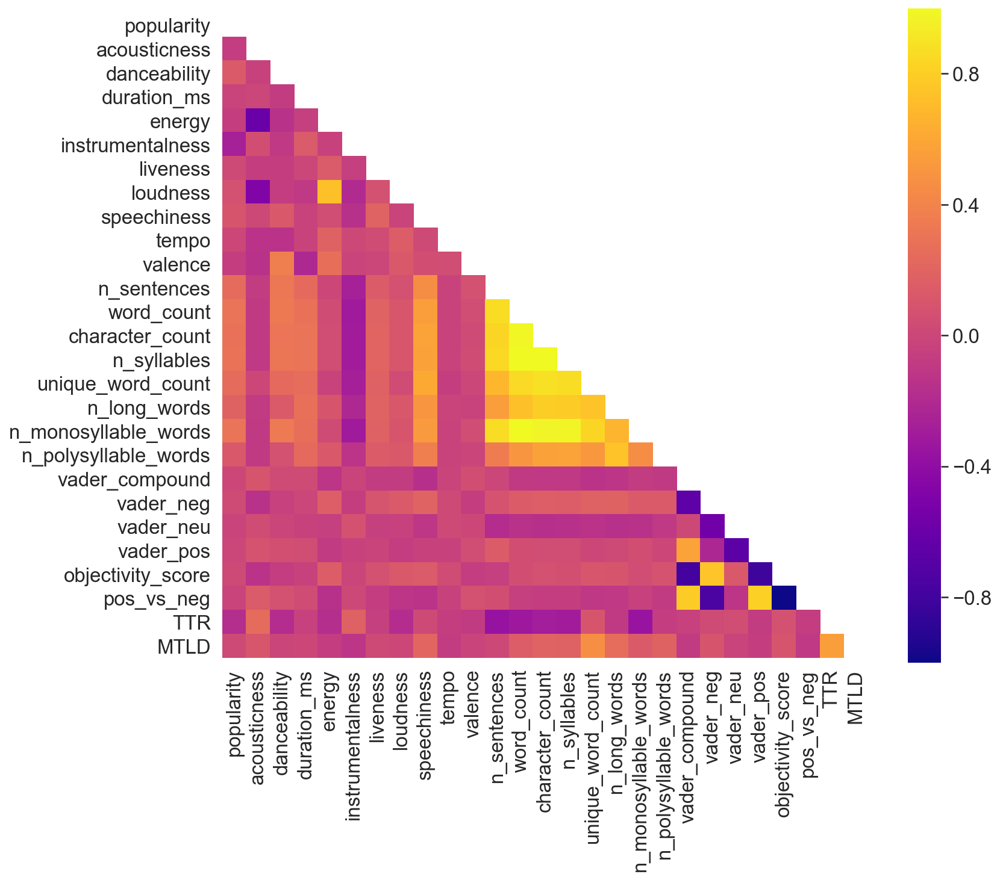

In [7]:
corr = data.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(12, 10))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, square=True, cmap='plasma')

**Continuous variables:**

In [8]:
data.columns

Index(['track_name', 'artist_name', 'release_year', 'spotify_uri', 'lyrics',
       'genre', 'track_id', 'popularity', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence',
       'n_sentences', 'word_count', 'character_count', 'n_syllables',
       'unique_word_count', 'n_long_words', 'n_monosyllable_words',
       'n_polysyllable_words', 'lyrics_processed', 'vader_compound',
       'vader_neg', 'vader_neu', 'vader_pos', 'objectivity_score',
       'pos_vs_neg', 'TTR', 'MTLD'],
      dtype='object')

In [9]:
continous = data[['popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence', 'n_sentences',
       'word_count', 'character_count', 'n_syllables', 'unique_word_count',
       'n_long_words', 'n_monosyllable_words', 'n_polysyllable_words',
        'vader_compound', 'vader_neg', 'vader_neu',
       'vader_pos', 'objectivity_score', 'pos_vs_neg', 'TTR', 'MTLD']]

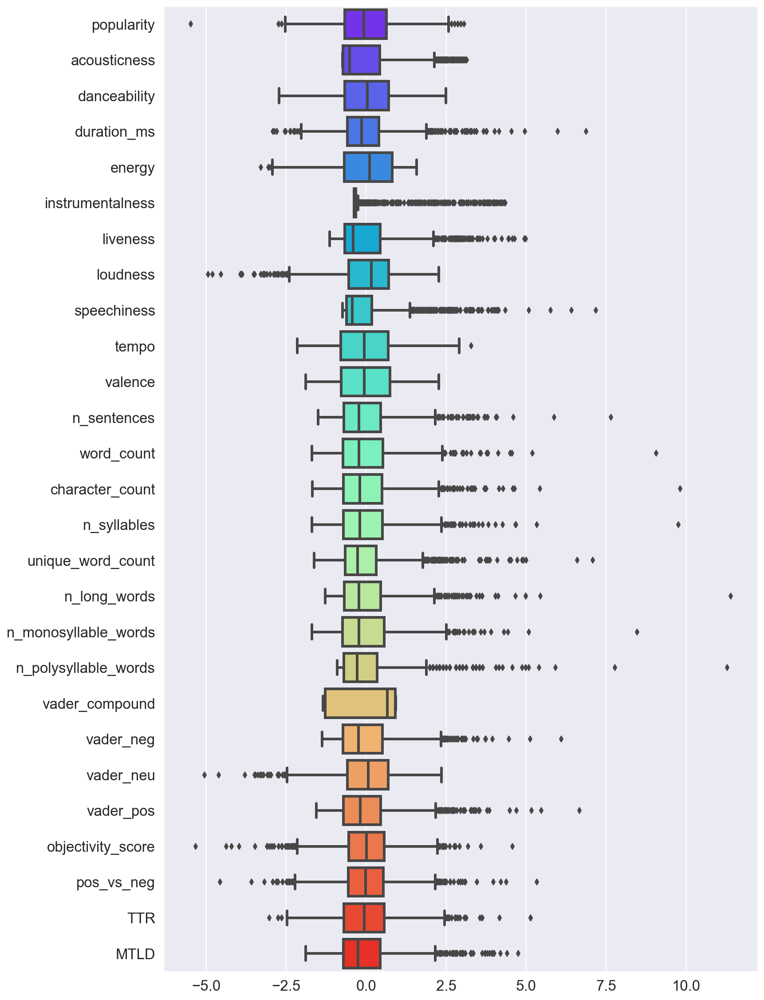

In [10]:
continous_stand = (continous - continous.mean()) / continous.std()


fig, ax = plt.subplots(figsize=(12, 20))

sns.boxplot(data=continous_stand
            , orient='h'
            , fliersize=5
            , linewidth=3
            , saturation=0.8
            , ax=ax
            , palette='rainbow');

* **Which artists' songs' music have the most/least valence and lyrics have the most/least vader compound and how are they related?**

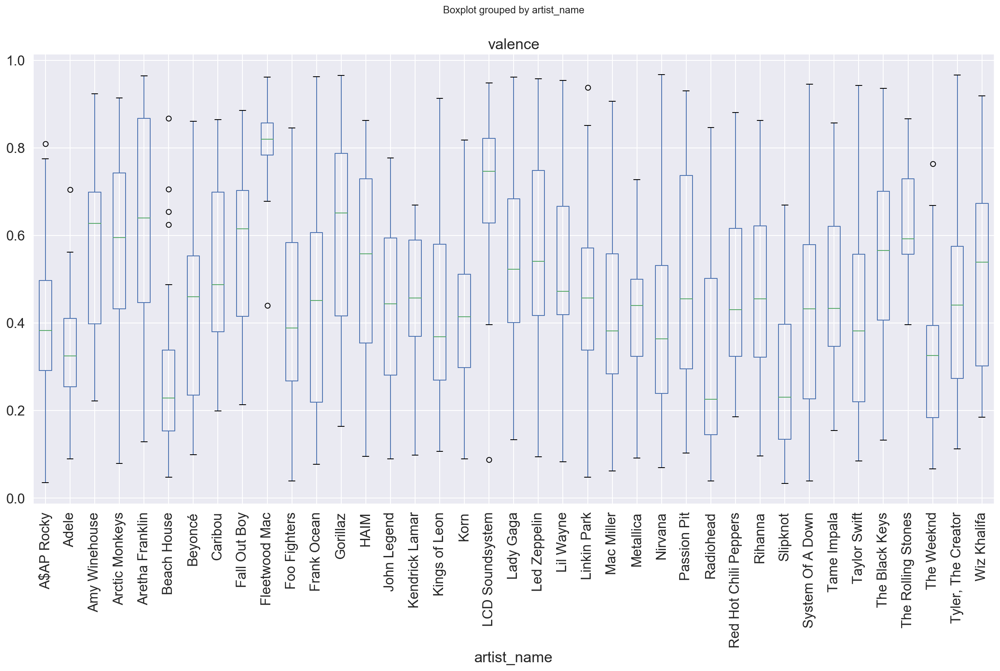

In [11]:
data.boxplot(by='artist_name', column='valence',figsize=(20,10));
plt.xticks(rotation='vertical');

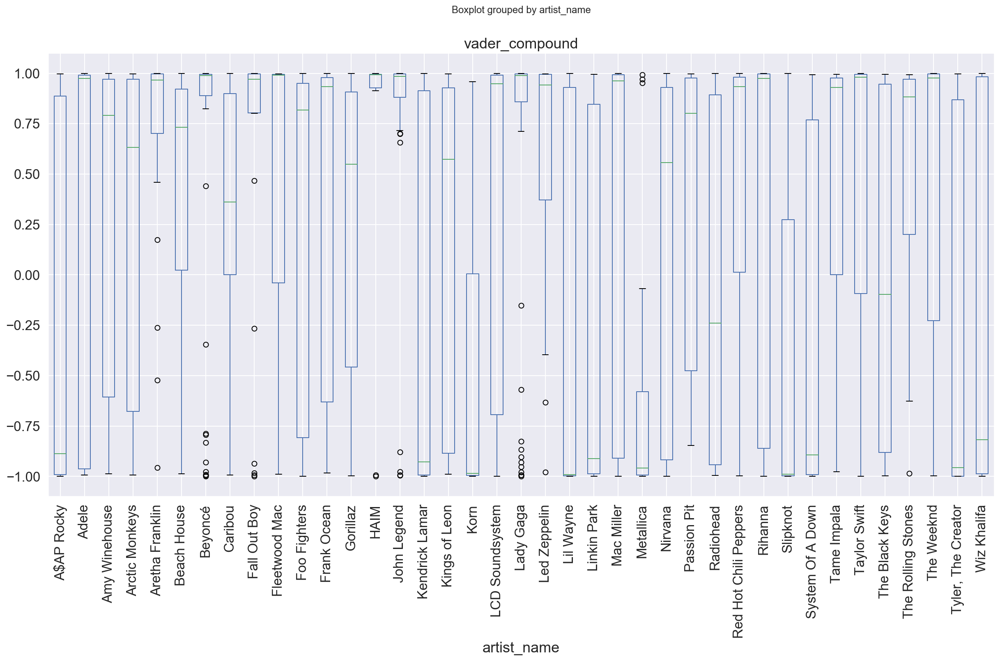

In [12]:
data.boxplot(by='artist_name', column='vader_compound',figsize=(20,10));
plt.xticks(rotation='vertical');

In [13]:
data.groupby('artist_name')[['artist_name','valence']].mean().sort_values('valence', ascending=False)[:3]

,valence
artist_name,
Fleetwood Mac,0.794583
LCD Soundsystem,0.705250
Aretha Franklin,0.635261


In [14]:
data.groupby('artist_name')[['artist_name','valence']].mean().sort_values('valence', ascending=True)[:3]

,valence
artist_name,
Slipknot,0.269300
Beach House,0.274305
Radiohead,0.316324


In [15]:
valence_df = data.groupby('artist_name')[['artist_name','valence']].mean().sort_values('valence', ascending=False)

In [16]:
valence_df=valence_df.reset_index()

In [17]:
data.groupby('artist_name')[['artist_name','vader_compound']].mean().sort_values('vader_compound', ascending=False)[:3]

,vader_compound
artist_name,
John Legend,0.749245
Aretha Franklin,0.696117
Beyoncé,0.620456


In [18]:
data.groupby('artist_name')[['artist_name','vader_compound']].mean().sort_values('vader_compound', ascending=True)[:3]

,vader_compound
artist_name,
Metallica,-0.534731
Korn,-0.498708
Slipknot,-0.453589


In [19]:
vader_comp_df = data.groupby('artist_name')[['artist_name','vader_compound']].mean().sort_values('vader_compound', ascending=False)

In [20]:
vader_comp_df = vader_comp_df.reset_index()

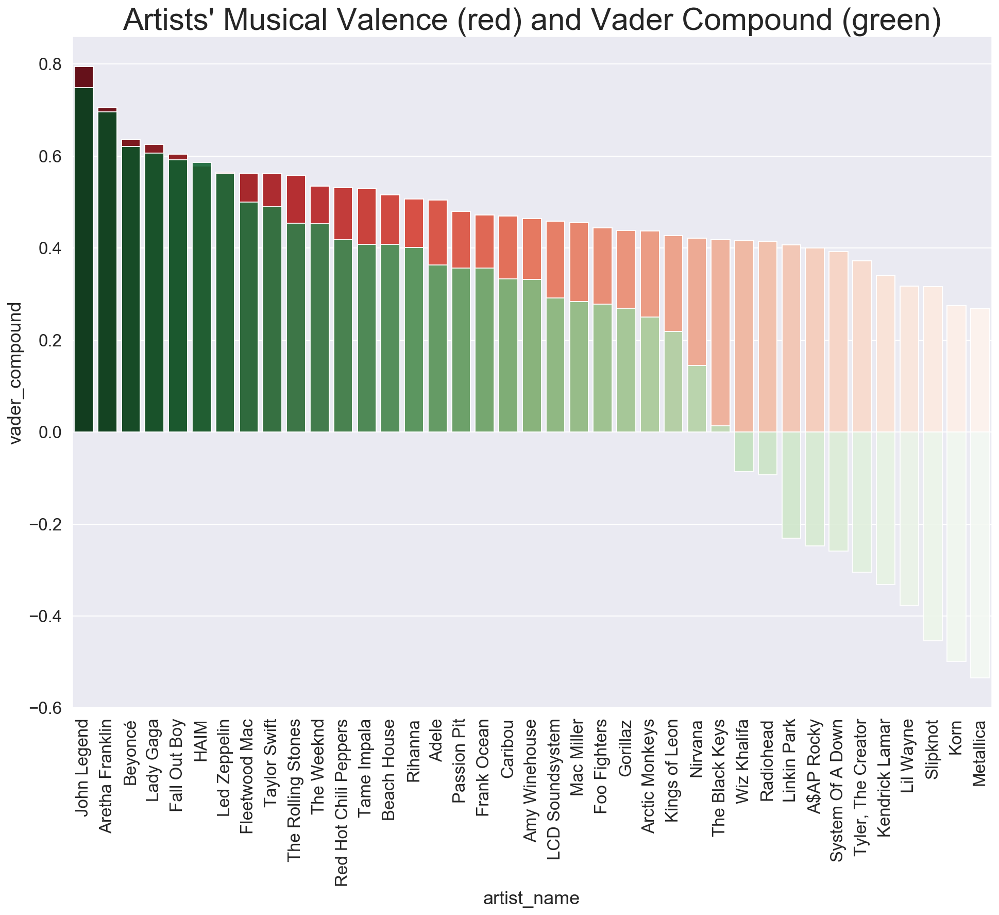

In [21]:
fig, ax = plt.subplots(figsize=(16,12))
ax = sns.barplot(data=valence_df, x='artist_name',y='valence', palette='Reds_r', alpha=1.0);
ax = sns.barplot(data=vader_comp_df, x='artist_name',y='vader_compound', palette='Greens_r',alpha=0.9);
ax.set_xticklabels(labels=vader_comp_df.artist_name ,rotation=90); #labels=df.artist_name
plt.title("Artists' Musical Valence (red) and Vader Compound (green)", size=30)
plt.show()

In [22]:
data.groupby('artist_name')[['artist_name','vader_compound','valence']].mean().sort_values(['valence','vader_compound'], ascending=False)[:3]

,vader_compound,valence
artist_name,,
Fleetwood Mac,0.500342,0.794583
LCD Soundsystem,0.290973,0.705250
Aretha Franklin,0.696117,0.635261


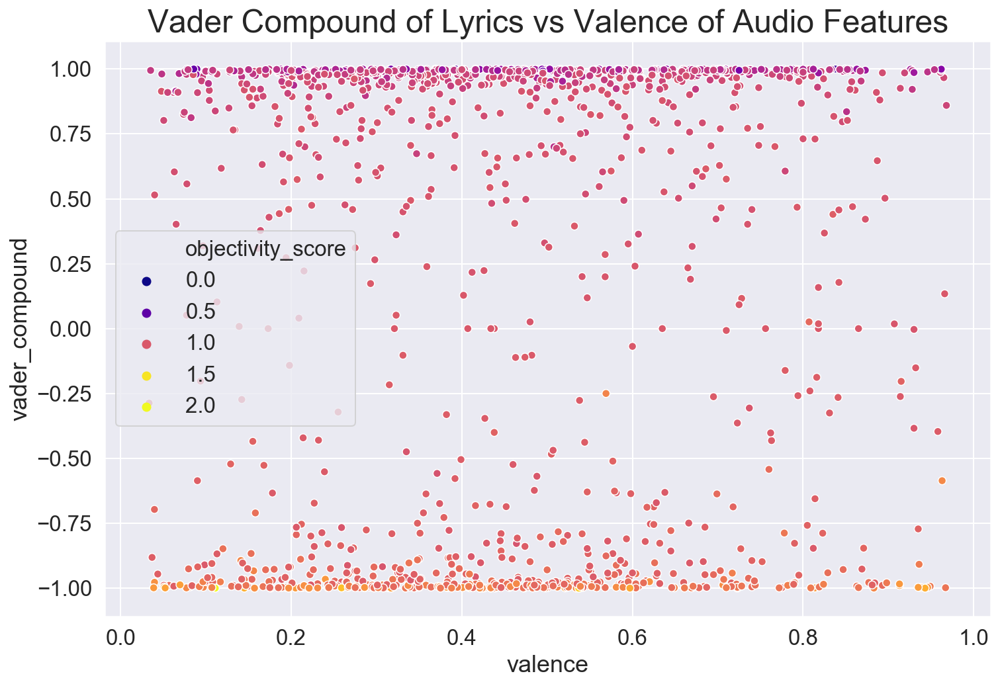

In [23]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=data, x='valence', y='vader_compound', hue='objectivity_score', palette='plasma');
plt.title("Vader Compound of Lyrics vs Valence of Audio Features", size=24)
plt.show()

* **Who are the most/least popular artists in the dataset? What audio feature seems to encourage popularity in a song (refer back to the Kaggle data)?**

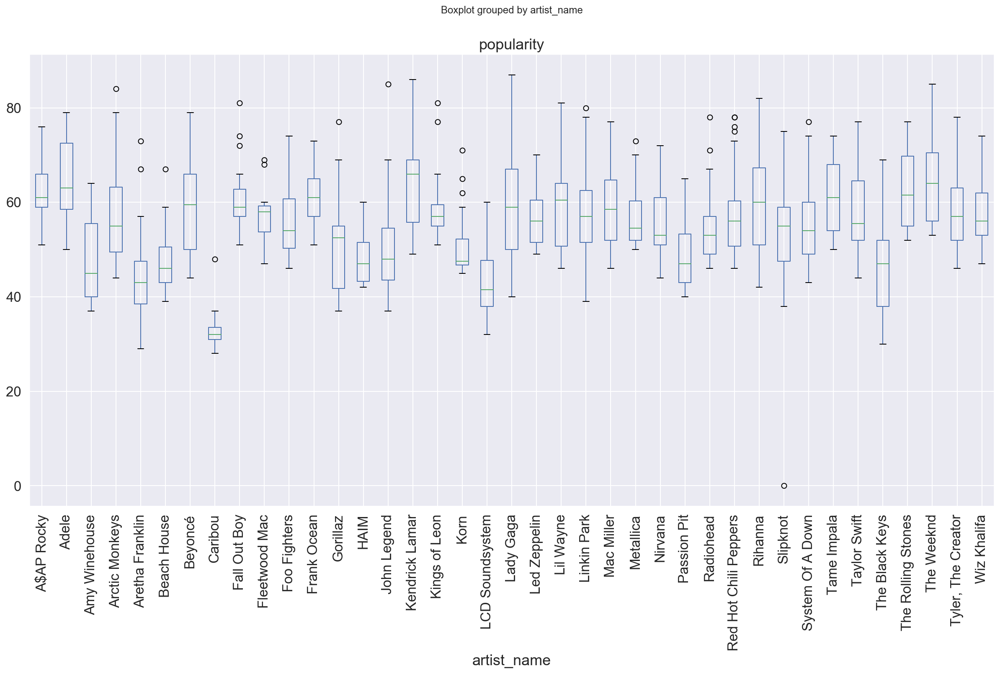

In [24]:
data.boxplot(by='artist_name', column='popularity',figsize=(20,10));
plt.xticks(rotation='vertical');

In [25]:
data.groupby('artist_name')[['popularity']].mean().sort_values('popularity', ascending=False)[:3]

,popularity
artist_name,
Adele,64.260870
The Weeknd,64.148936
Kendrick Lamar,63.933333


Least popular music artists within dataset:

In [26]:
data.groupby('artist_name')[['popularity']].mean().sort_values('popularity', ascending=True)[:3]

,popularity
artist_name,
Caribou,33.454545
LCD Soundsystem,43.363636
Aretha Franklin,45.000000


In [27]:
popularity_df = data.groupby('artist_name')[['popularity']].mean().sort_values('popularity', ascending=False)
popularity_df = popularity_df.reset_index()

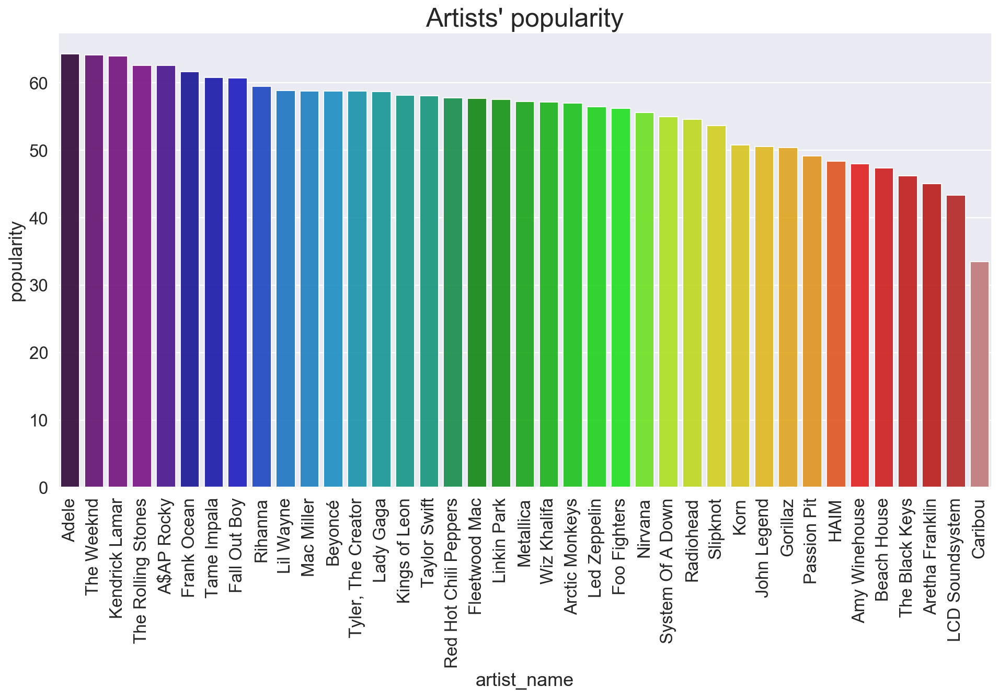

In [28]:
fig, ax = plt.subplots(figsize=(16,8))
ax = sns.barplot(data=popularity_df, x='artist_name',y='popularity', palette='nipy_spectral', alpha=0.9);
ax.set_xticklabels(labels=popularity_df.artist_name ,rotation=90); #labels=df.artist_name
plt.title("Artists' popularity", size=25)
plt.show()

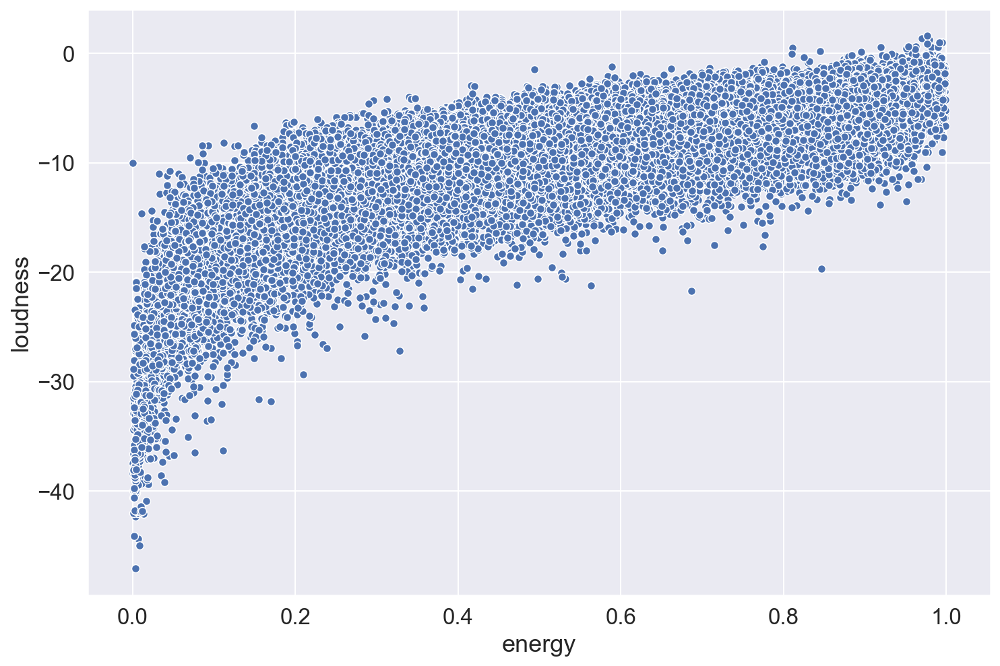

In [29]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(x='energy', y='loudness', data=kaggle[kaggle.popularity>40]);

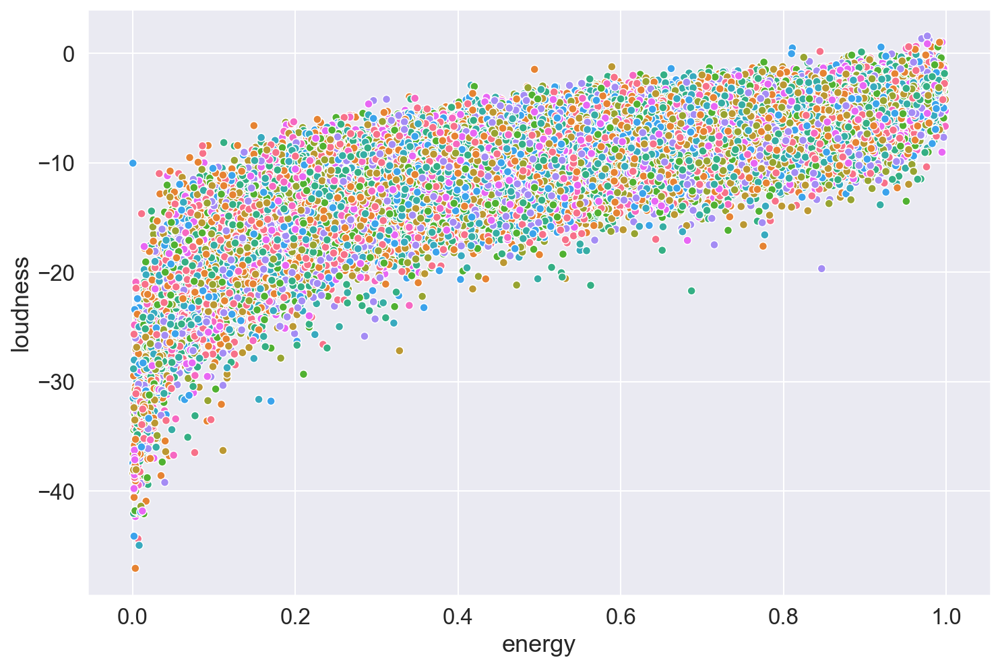

In [30]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(x='energy', y='loudness', data=kaggle[kaggle.popularity>40],hue='key', legend=False);

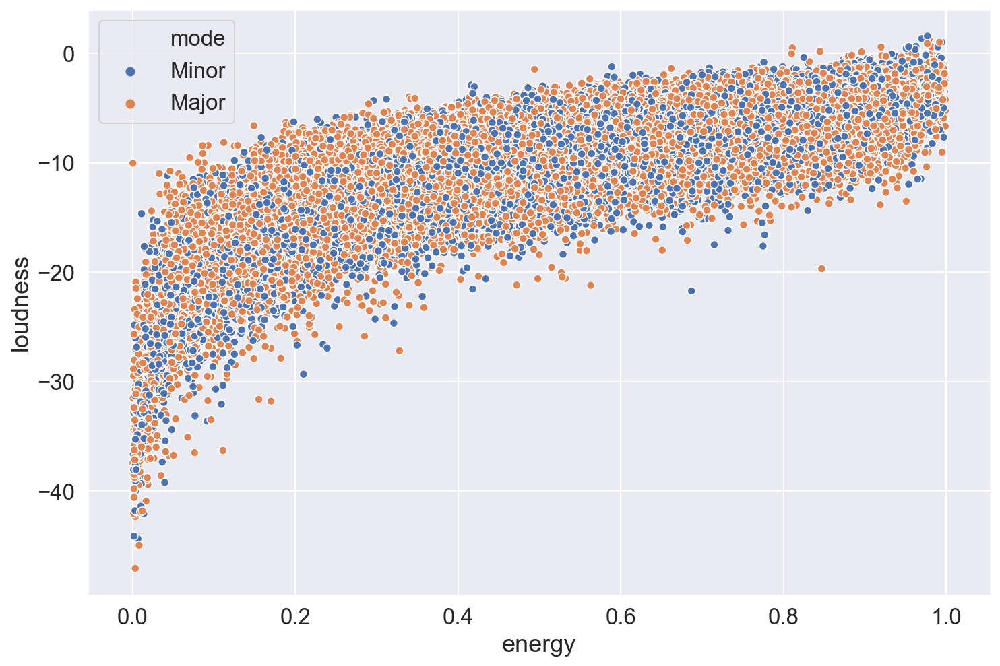

In [31]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(x='energy', y='loudness', data=kaggle[kaggle.popularity>40], hue='mode', legend='brief');

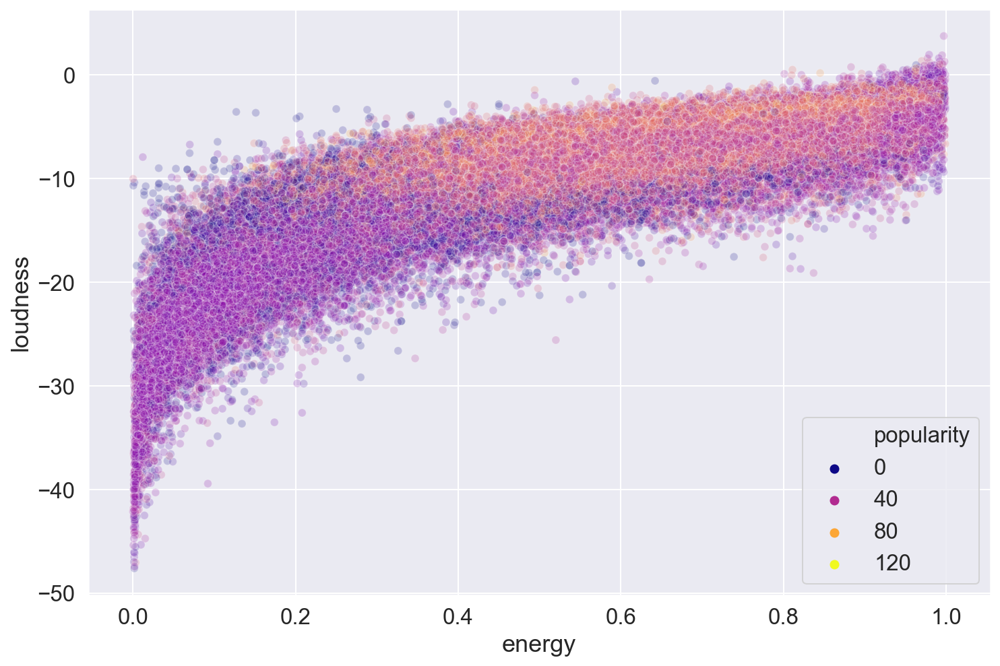

In [32]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(x='energy', y='loudness', data=kaggle[:100000], hue=kaggle.popularity, palette='plasma', alpha=0.2, ax=ax);

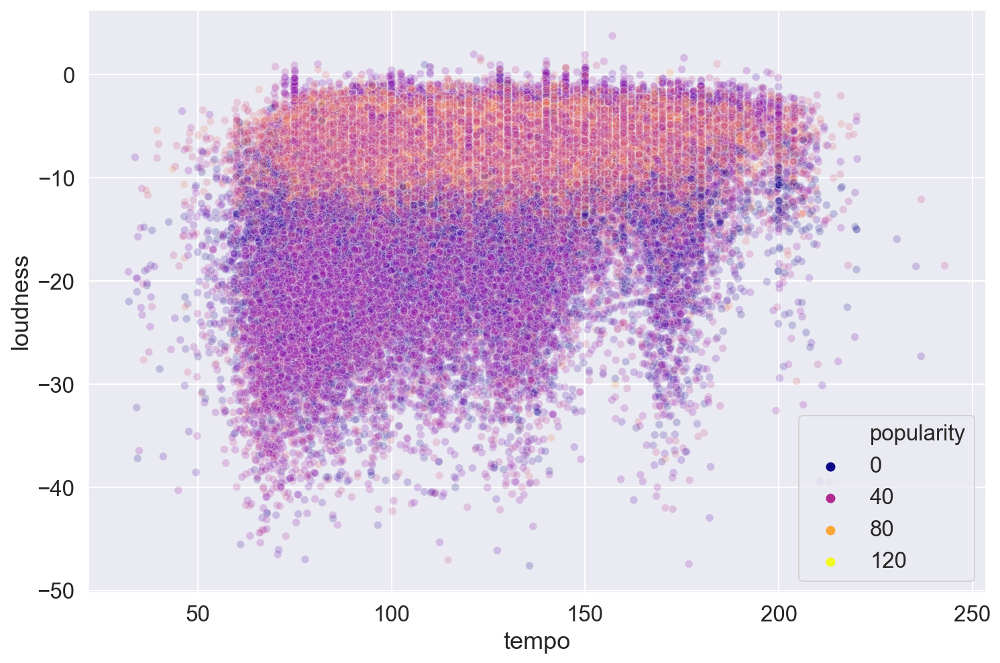

In [33]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(x='tempo', y='loudness', data=kaggle[:100000], hue=kaggle.popularity, palette='plasma', alpha=0.2, ax=ax);

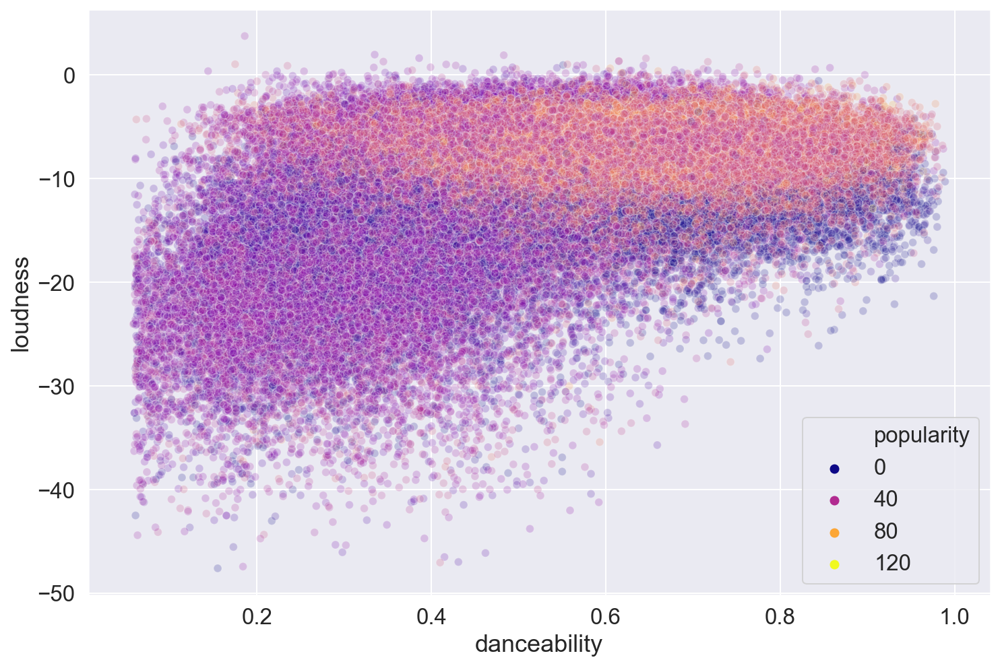

In [34]:
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(x='danceability', y='loudness', data=kaggle[:100000], hue=kaggle.popularity, palette='plasma', alpha=0.2, ax=ax);

* **Which artists have complex or basic vocabularies?** - word count, unique words, lexical diversity etc.

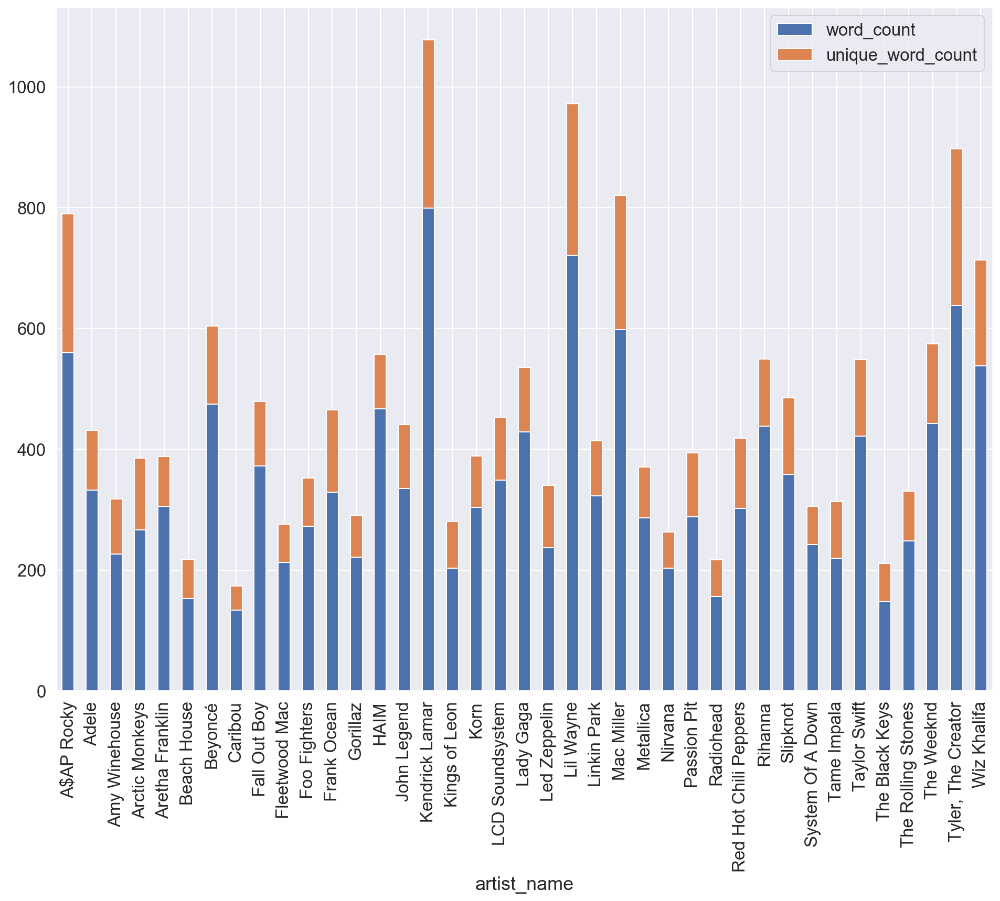

In [35]:
fig, ax = plt.subplots(figsize=(16,12))
ax = data.groupby('artist_name')[['word_count','unique_word_count']].mean().plot.bar(ax=ax,stacked='stacked')

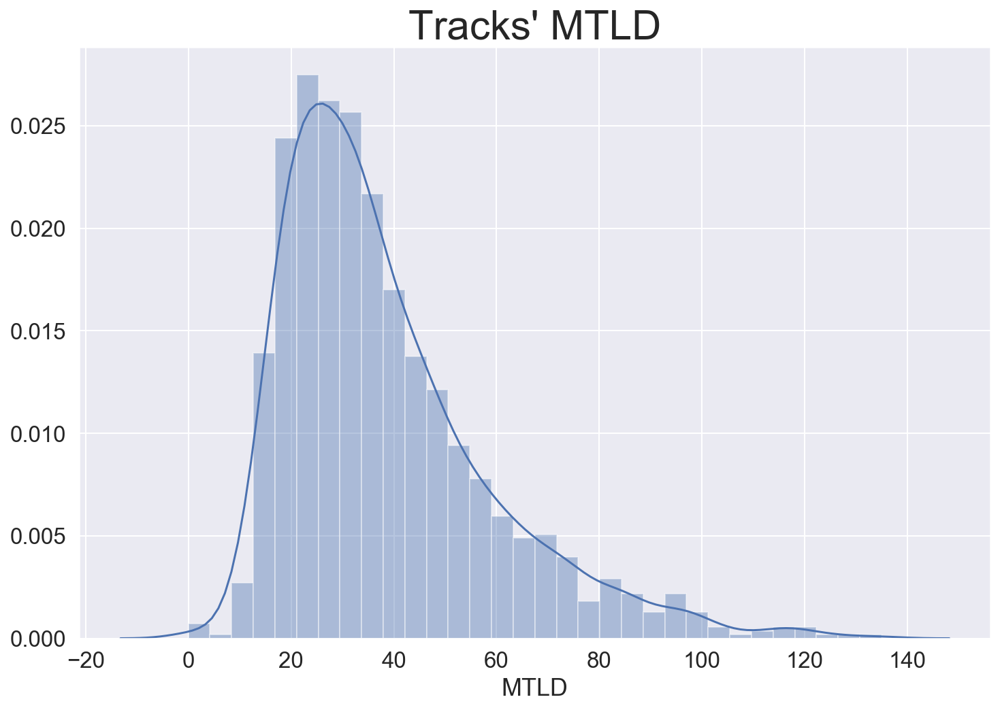

In [36]:
fig, ax = plt.subplots(figsize=(12, 8))
MTLD_hist = sns.distplot(data.MTLD);
plt.title("Tracks' MTLD", size=30)
plt.show()

In [37]:
mtld = data.groupby('artist_name')[['artist_name','MTLD']].mean()
mtld=mtld.reset_index()

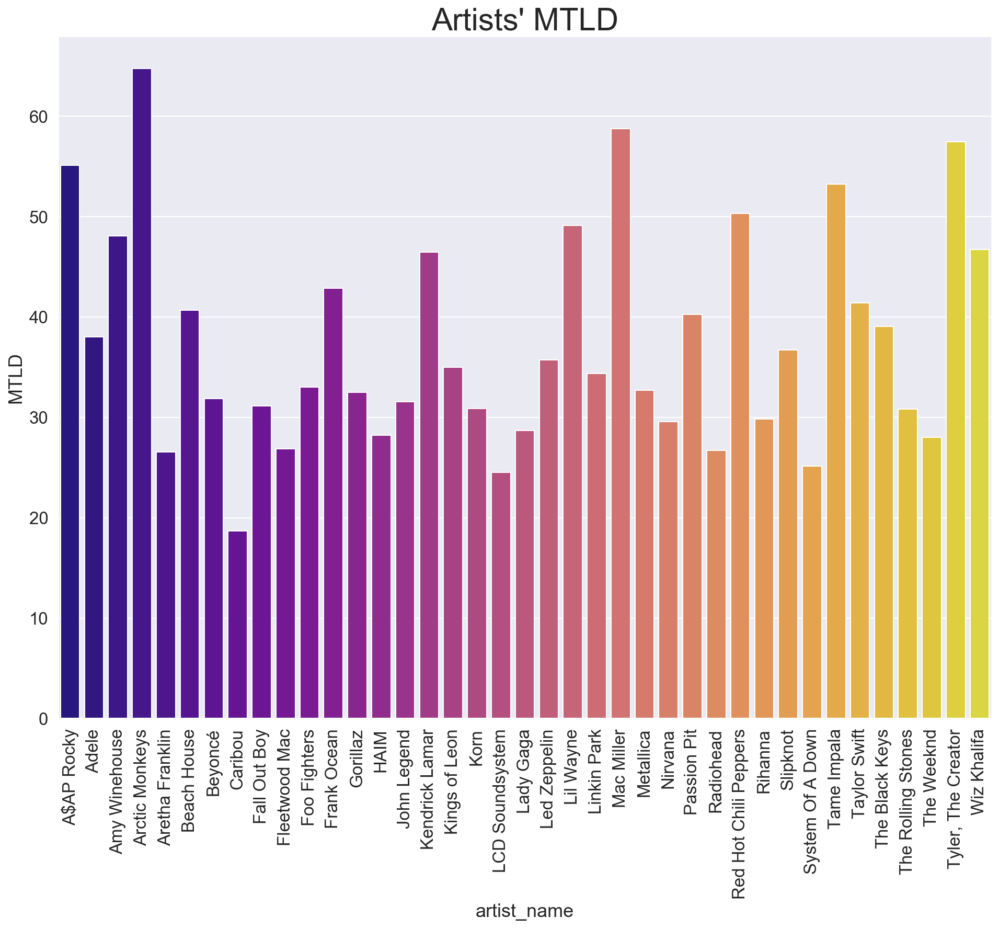

In [38]:
fig, ax = plt.subplots(figsize=(16,12))
mtld_bar = sns.barplot(data=mtld, x='artist_name',y='MTLD', palette='plasma');
mtld_bar.set_xticklabels(labels=mtld.artist_name ,rotation=90); #labels=data.artist_name
plt.title("Artists' MTLD", size=30)
plt.show()

* **Which artists are the most positive/negative in their language?** - How do their positive and negative language score in VaderSentiment?

In [39]:
data.groupby('artist_name')[['vader_pos', 'vader_neu', 'vader_neg', 'vader_compound']].mean().sort_values('vader_compound', ascending=False).head(3)

,vader_pos,vader_neu,vader_neg,vader_compound
artist_name,,,,
John Legend,0.200875,0.727450,0.071650,0.749245
Aretha Franklin,0.177304,0.776522,0.046391,0.696117
Beyoncé,0.154062,0.753896,0.091937,0.620456


In [40]:
data.groupby('artist_name')[['vader_pos', 'vader_neu', 'vader_neg', 'vader_compound']].mean().sort_values('vader_compound', ascending=True).head(3)

,vader_pos,vader_neu,vader_neg,vader_compound
artist_name,,,,
Metallica,0.111500,0.713562,0.175000,-0.534731
Korn,0.089833,0.741208,0.168958,-0.498708
Slipknot,0.104723,0.700277,0.194979,-0.453589


In [41]:
high_vad_comp = data.groupby('artist_name')[['vader_pos', 'vader_neu', 'vader_neg', 'vader_compound']].mean().sort_values('vader_compound', ascending=False).head(3)
high_vad_comp.reset_index(inplace=True)

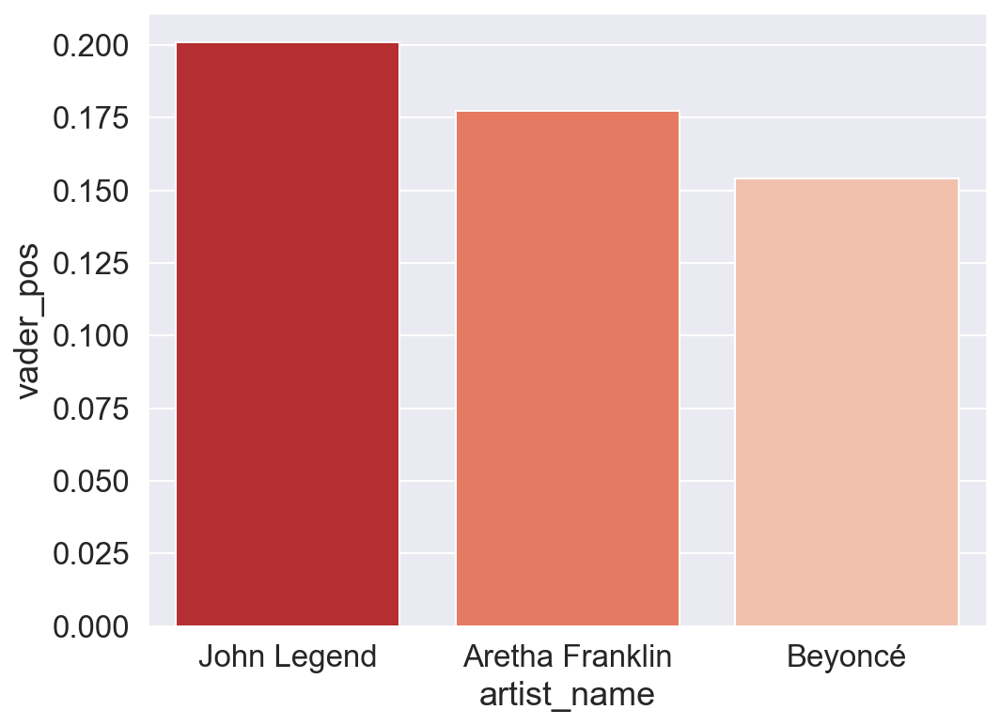

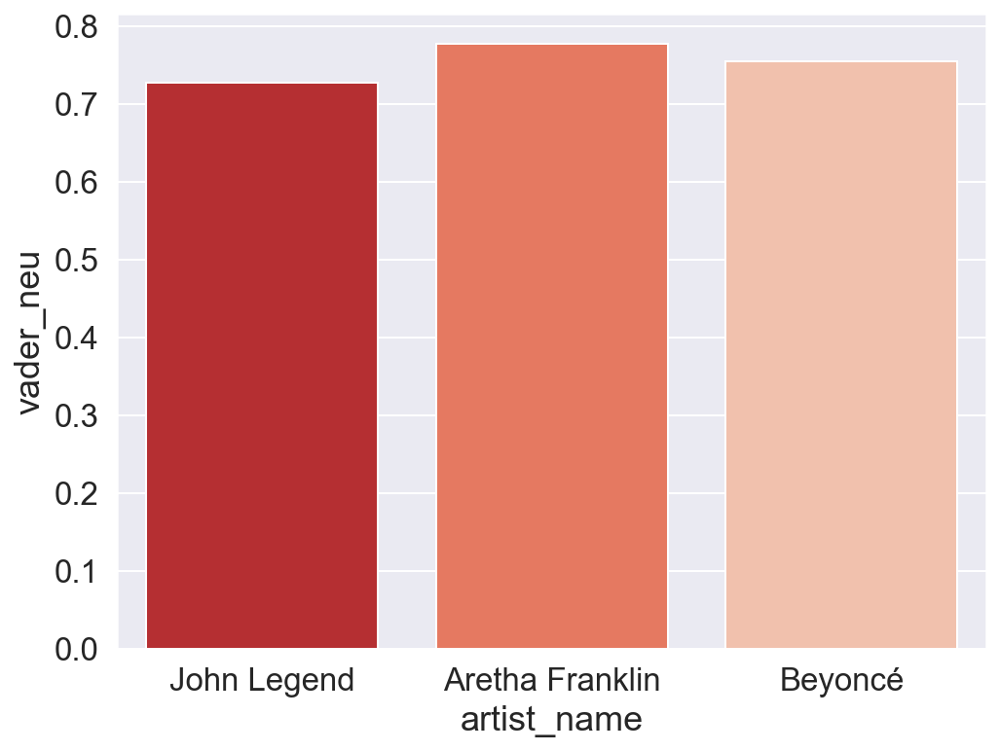

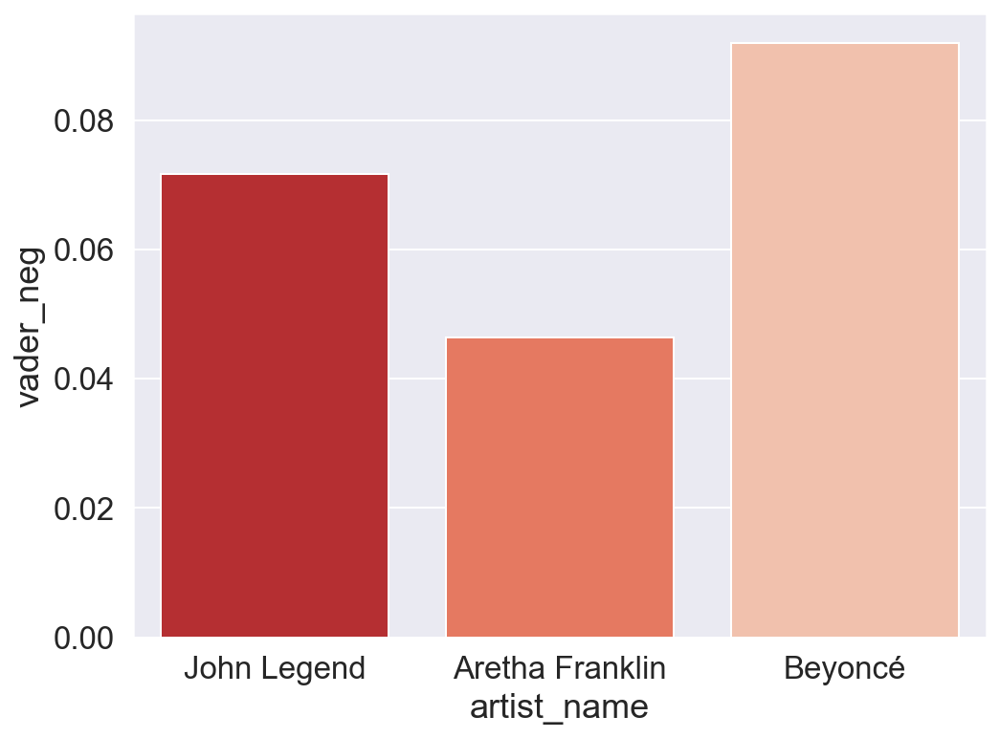

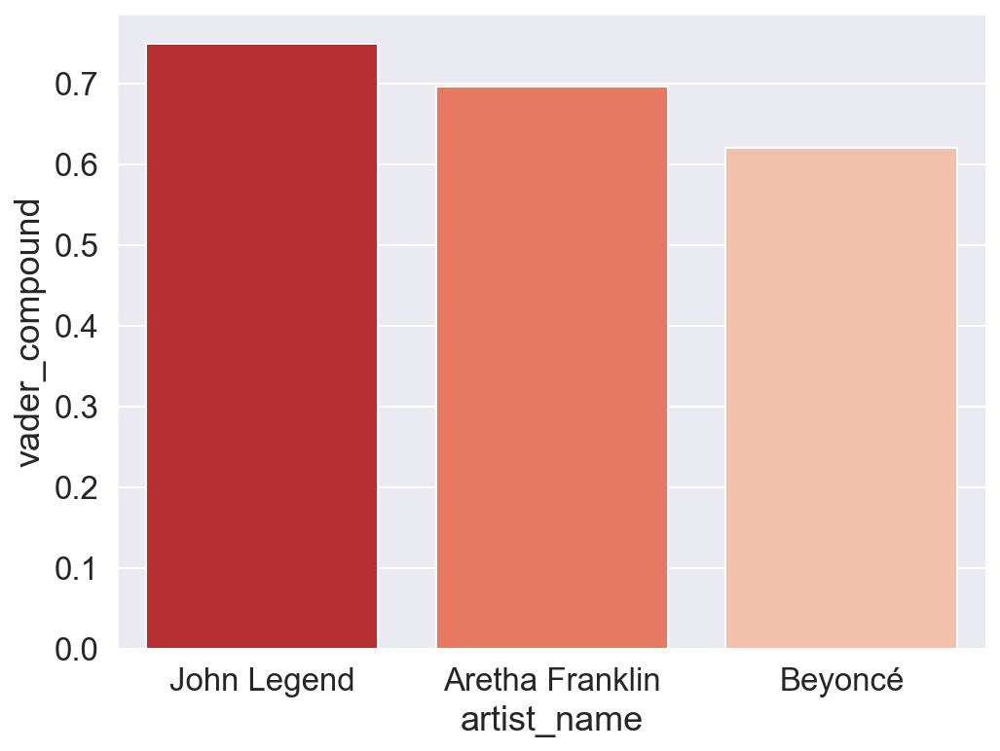

In [42]:
fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=high_vad_comp, x='artist_name',y='vader_pos', orient='v', palette='Reds_r');

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=high_vad_comp, x='artist_name',y='vader_neu', orient='v', palette='Reds_r');

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=high_vad_comp, x='artist_name',y='vader_neg', orient='v', palette='Reds_r');

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=high_vad_comp, x='artist_name',y='vader_compound', orient='v', palette='Reds_r');

plt.show()

In [43]:
low_vad_comp = data.groupby('artist_name')[['vader_pos', 'vader_neu', 'vader_neg', 'vader_compound']].mean().sort_values('vader_compound', ascending=True).head(3)
low_vad_comp.reset_index(inplace=True)

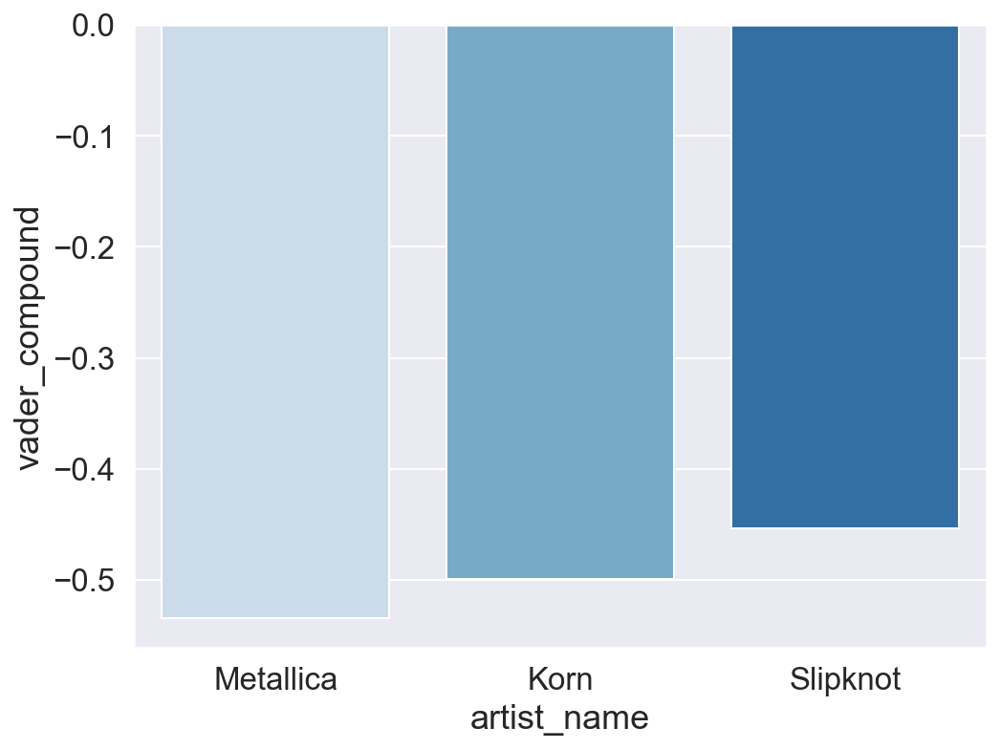

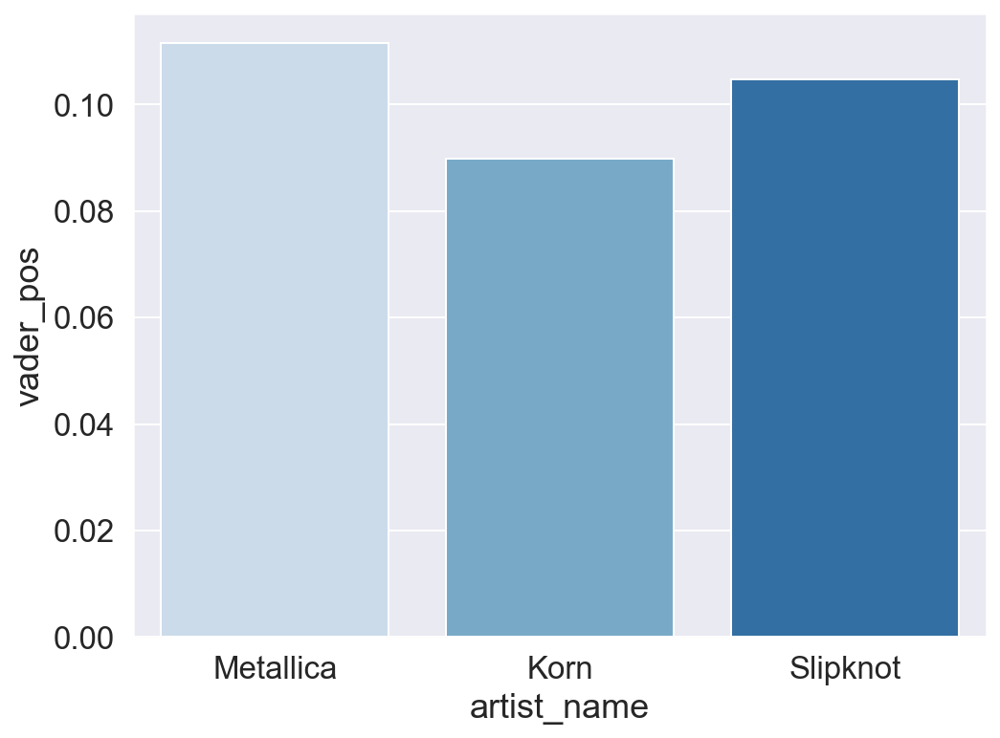

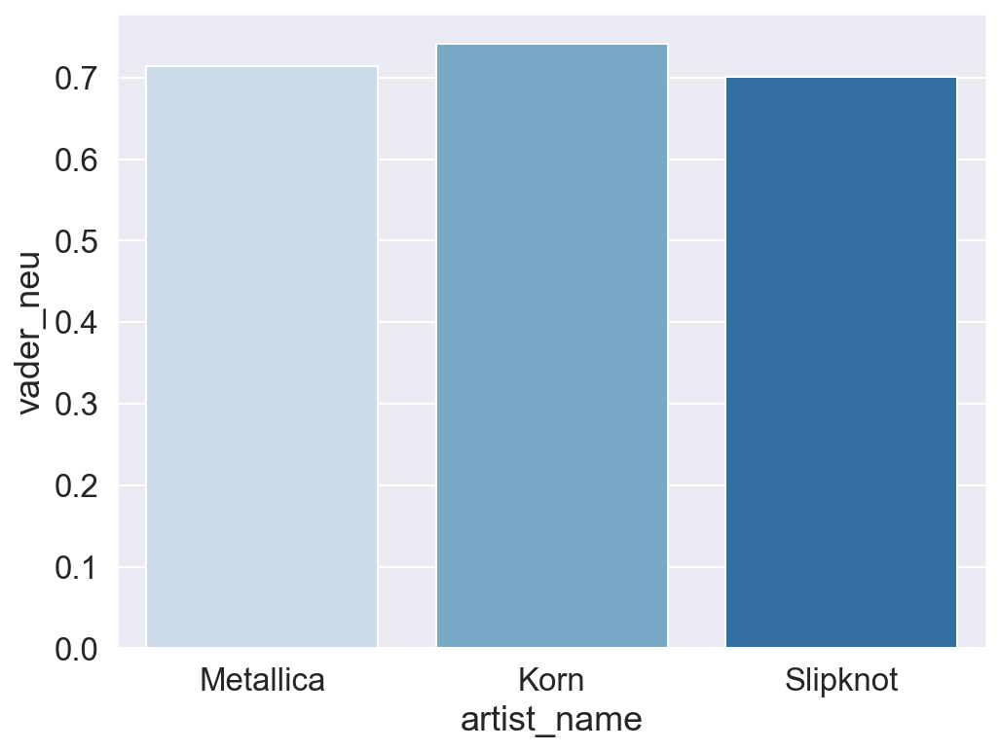

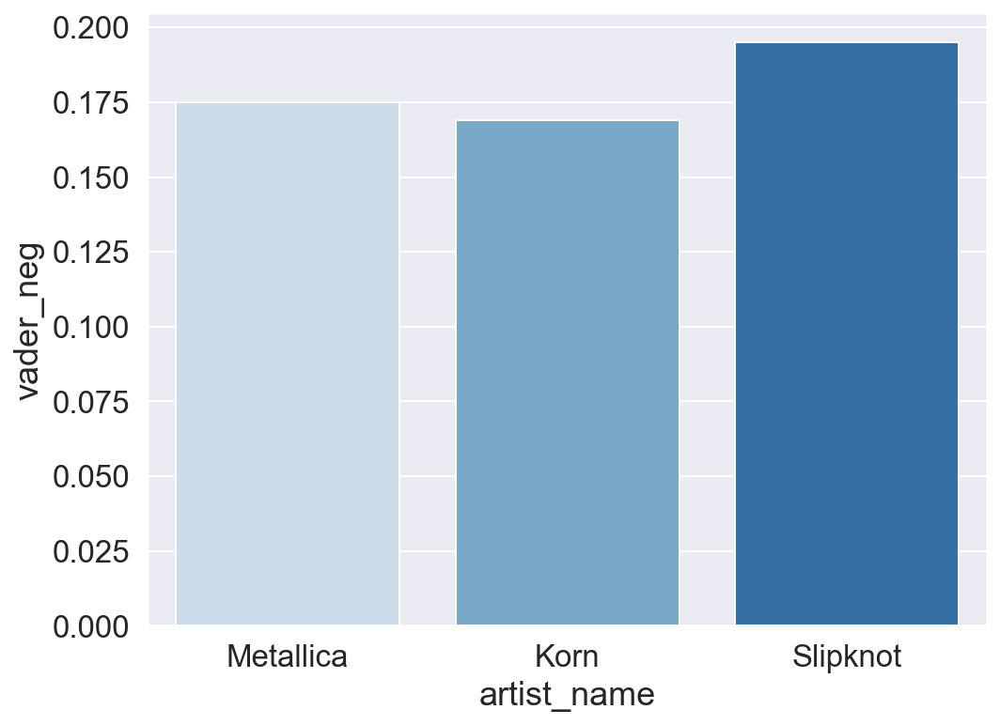

In [44]:
fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=low_vad_comp, x='artist_name',y='vader_compound', orient='v', palette='Blues');

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=low_vad_comp, x='artist_name',y='vader_pos', orient='v', palette='Blues');

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=low_vad_comp, x='artist_name',y='vader_neu', orient='v', palette='Blues');

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=low_vad_comp, x='artist_name',y='vader_neg', orient='v', palette='Blues');

plt.show()

In [45]:
data.groupby('artist_name')[['vader_pos', 'vader_neu', 'vader_neg', 'vader_compound']].mean().sort_values('vader_pos', ascending=False).head(3)

,vader_pos,vader_neu,vader_neg,vader_compound
artist_name,,,,
John Legend,0.200875,0.727450,0.071650,0.749245
Fleetwood Mac,0.194833,0.723083,0.082083,0.500342
Rihanna,0.179854,0.724146,0.096042,0.401425


In [46]:
data.groupby('artist_name')[['vader_pos', 'vader_neu', 'vader_neg', 'vader_compound']].mean().sort_values('vader_neg', ascending=False).head(3)

,vader_pos,vader_neu,vader_neg,vader_compound
artist_name,,,,
Slipknot,0.104723,0.700277,0.194979,-0.453589
Metallica,0.111500,0.713562,0.175000,-0.534731
Korn,0.089833,0.741208,0.168958,-0.498708


* **Word count per artist**

In [47]:
stop = stopwords.words('english')
stop += ['oh', 'ah', 've','ll','ooh','oooh','uh','aah','aaah','yeah','bum','na','la','doo','nah', 'eh','pow','di',
        'oo','whoa','naa','em','ga','da','hi','sha','ba','wee','ahh']

Artist: A$AP Rocky
        word_count
like           190
nigga          145
niggas         137
fuck           113
got            108
back            83
doot            72
pop             65
get             63
go              61
love            59
shit            58
tell            58
bang            55
bitch           54
cause           51
come            51
make            49
boom            49
know            48
never           47
still           45
feel            44
gettin          44
man             43
flacko          40
said            37
ball            36
young           36
say             35


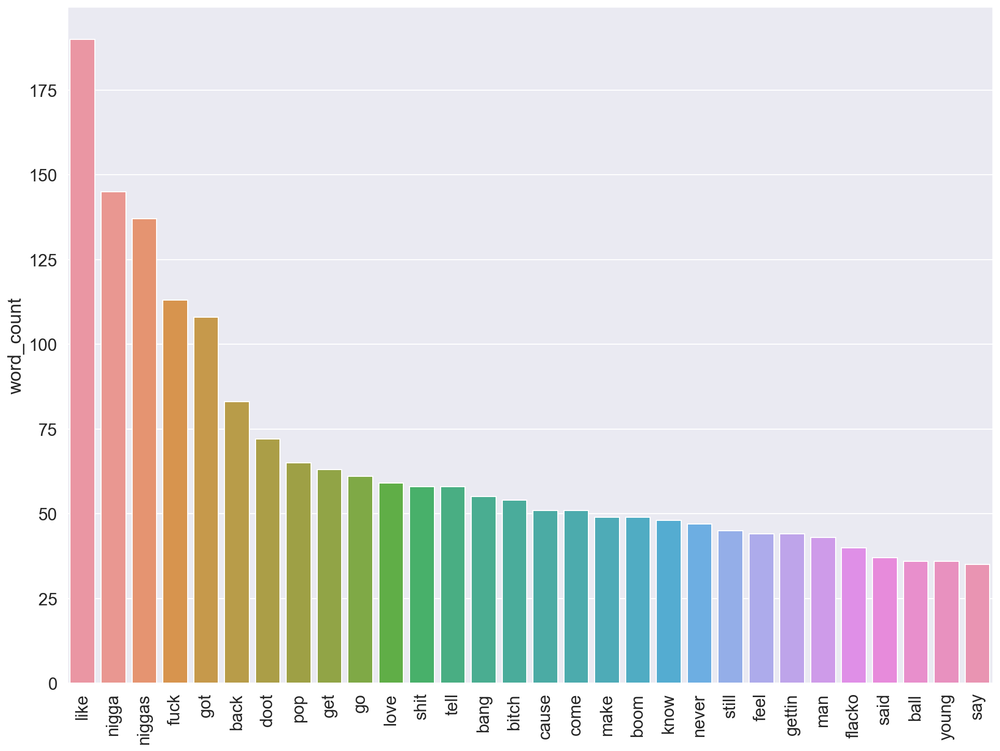

 
Artist: Adele
         word_count
love             70
like             64
go               53
never            47
let              46
say              41
gonna            35
heart            31
wish             30
know             29
river            28
look             27
back             26
nothing          26
lea              25
feel             24
aye              24
miss             22
make             22
give             21
time             21
lights           21
deep             21
baby             21
always           21
one              20
see              20
could            20
ready            19
take             19


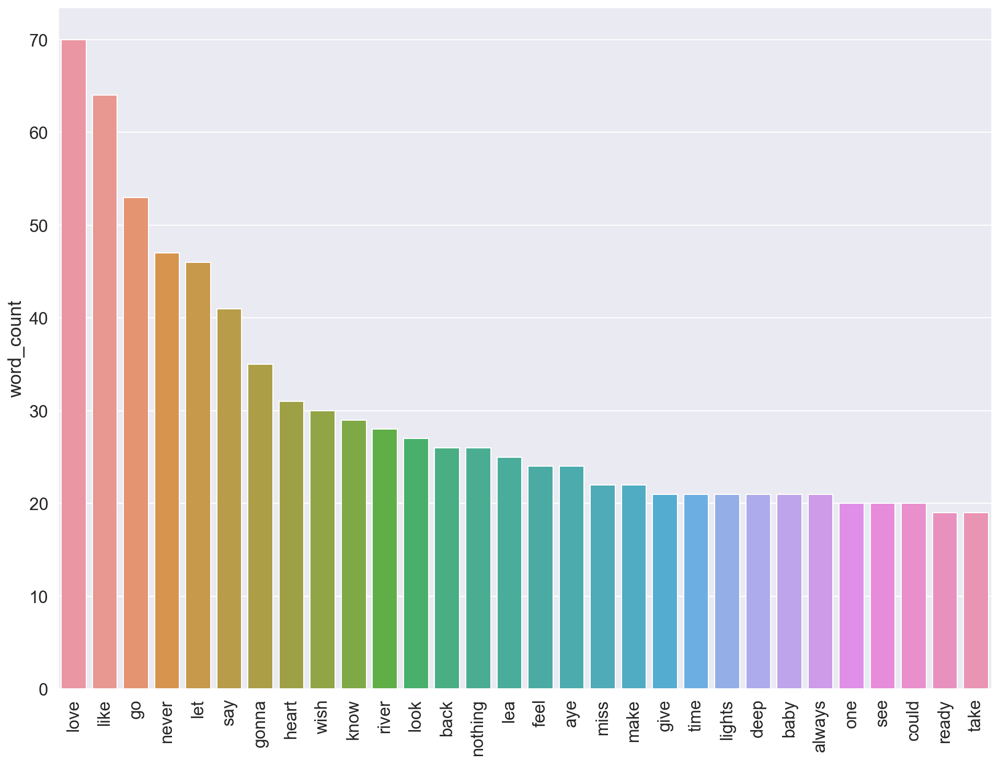

 
Artist: Amy Winehouse
          word_count
amy               45
man               41
never             26
know              26
day               25
get               24
ay                24
come              22
think             21
love              21
hugging           20
monkey            20
big               20
like              19
time              17
way               16
always            14
stronger          13
alone             12
lady              12
friends           11
girl              11
bed               11
got               11
cause             10
mine              10
although          10
rich              10
bout               9
feel               9


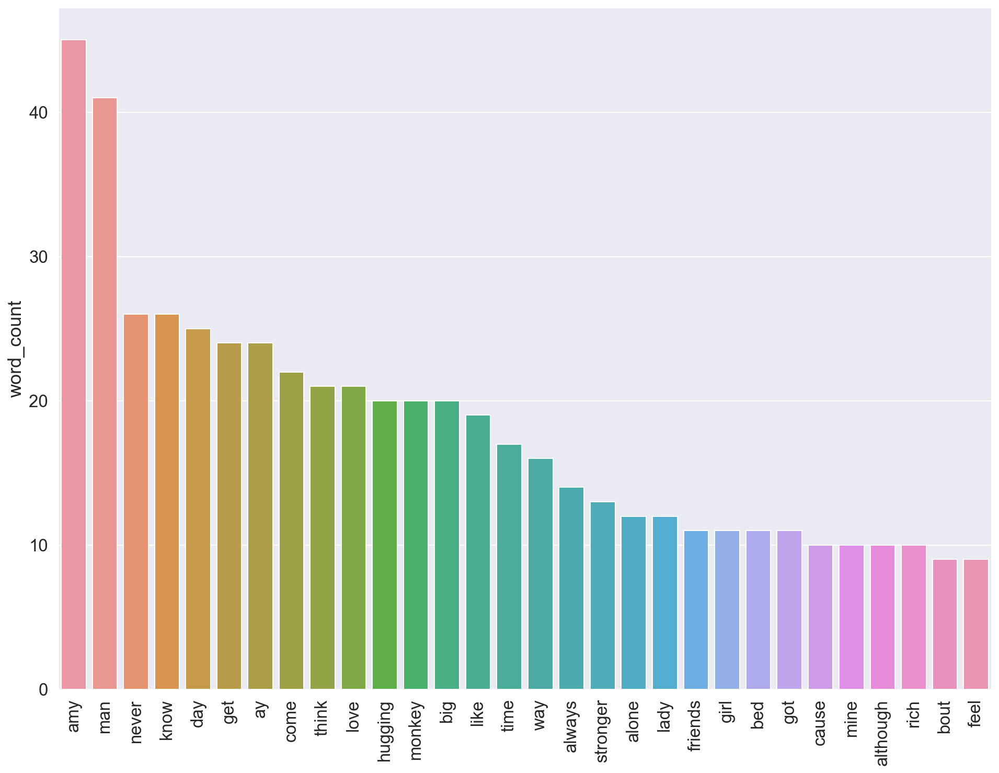

 
Artist: Arctic Monkeys
         word_count
like             57
know             55
wanna            51
get              49
come             34
go               31
got              29
never            28
could            27
make             27
time             26
cause            24
back             24
well             23
thought          23
mine             23
want             22
said             21
baby             19
wop              18
shoo             18
us               17
one              17
looks            17
take             16
see              16
let              16
fun              16
still            16
say              16


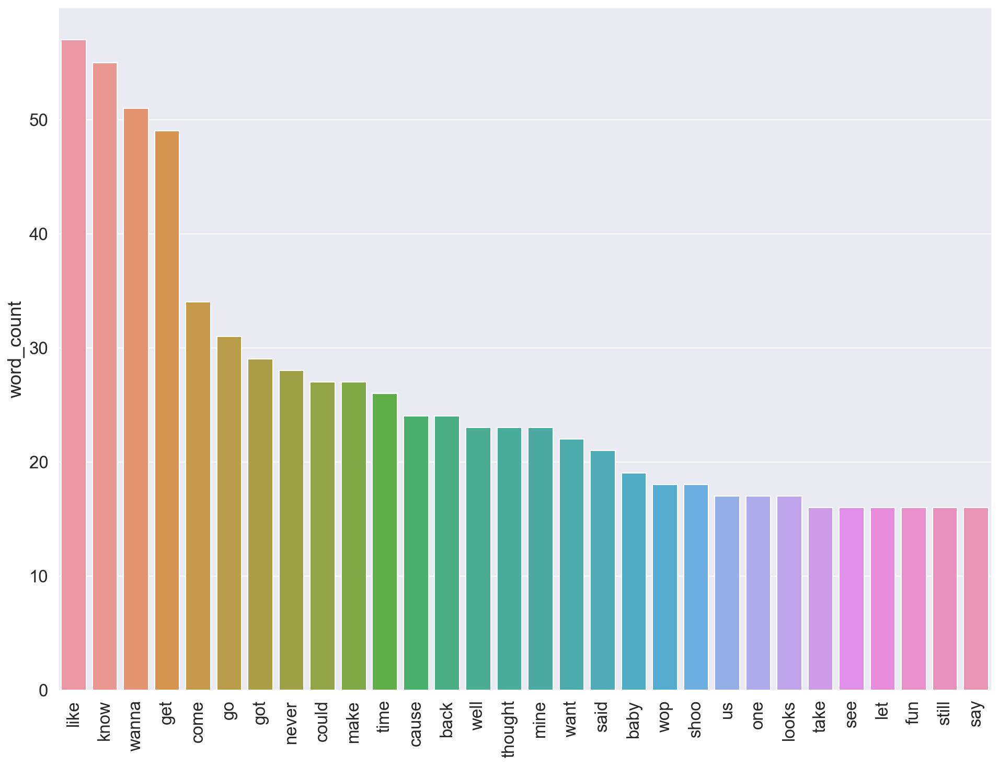

 
Artist: Aretha Franklin
          word_count
get              129
let               92
baby              92
love              89
right             80
til               44
know              42
take              38
think             36
feel              36
go                36
back              32
little            32
jack              30
come              29
see               27
got               25
bit               24
man               24
like              24
real              23
midnight          22
send              21
freeway           21
rock              20
steady            20
free              20
one               20
home              19
hey               19


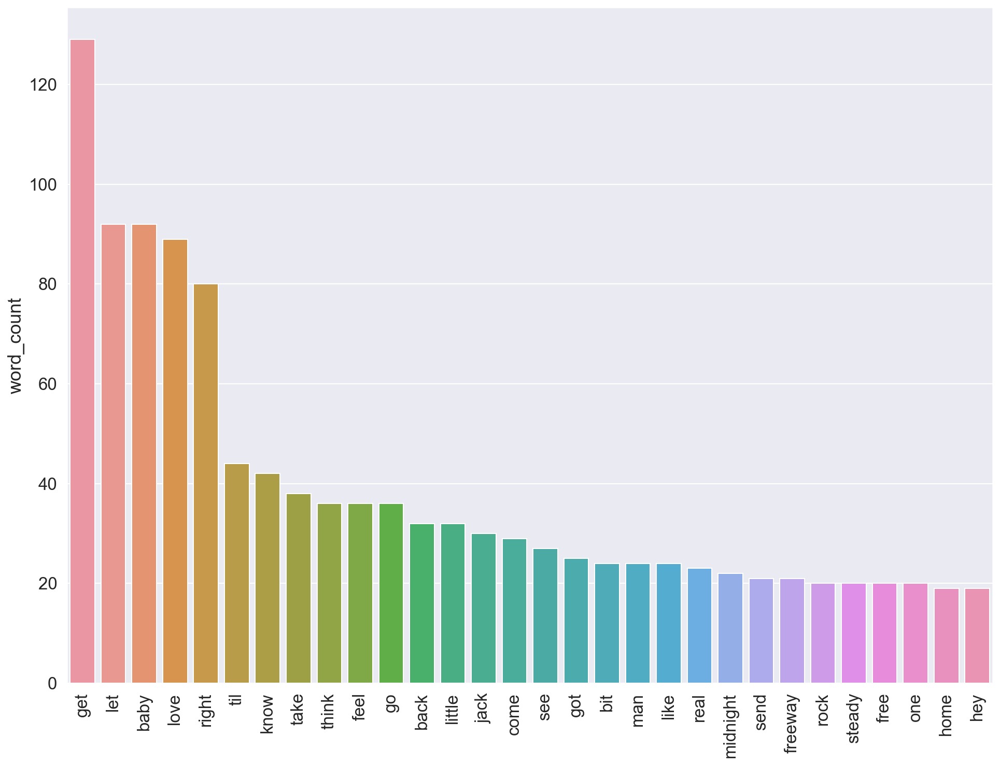

 
Artist: Beach House
           word_count
like               64
know               61
want               44
take               38
time               37
go                 35
us                 28
back               27
care               27
love               27
come               26
say                25
place              24
night              23
mind               22
nothing            21
would              21
run                20
eyes               20
comes              18
fall               18
tell               18
right              17
day                17
one                16
true               16
keep               16
something          16
happening          15
ever               15


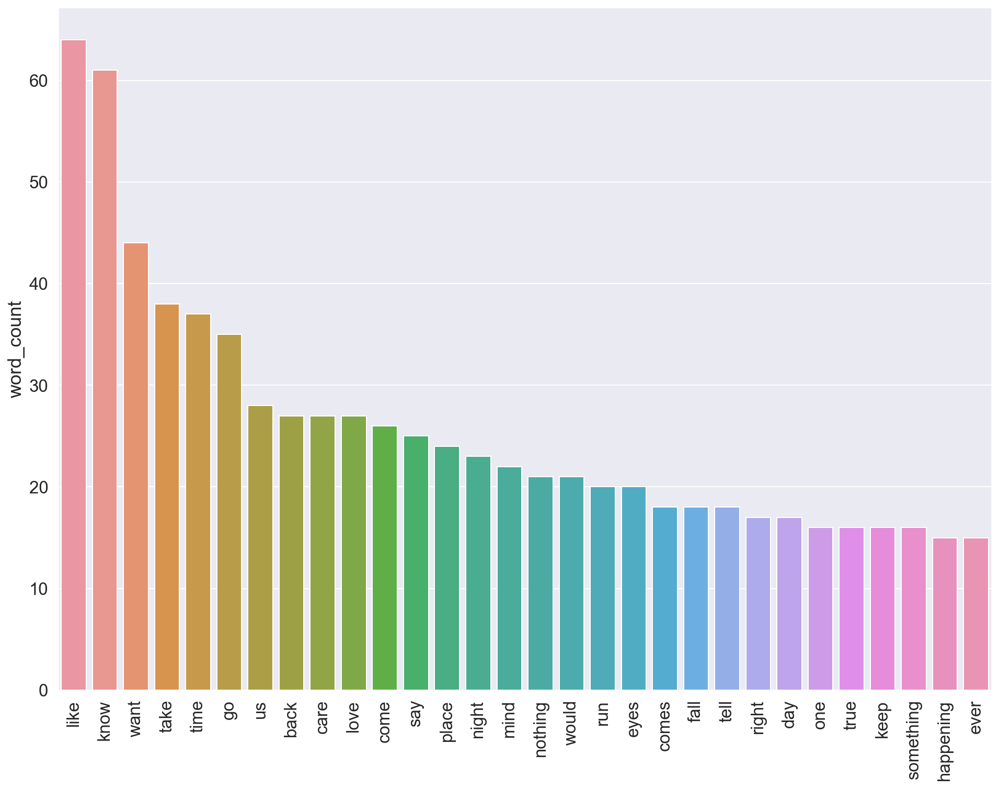

 
Artist: Beyoncé
       word_count
like          207
love          183
baby          166
know          156
got           132
go            132
cause         109
girl           99
let            96
see            92
time           82
wanna          81
yes            69
halo           67
put            66
good           66
never          65
said           63
hello          63
want           62
right          60
feel           58
back           58
think          53
say            53
need           52
get            51
body           51
hey            50
boy            47


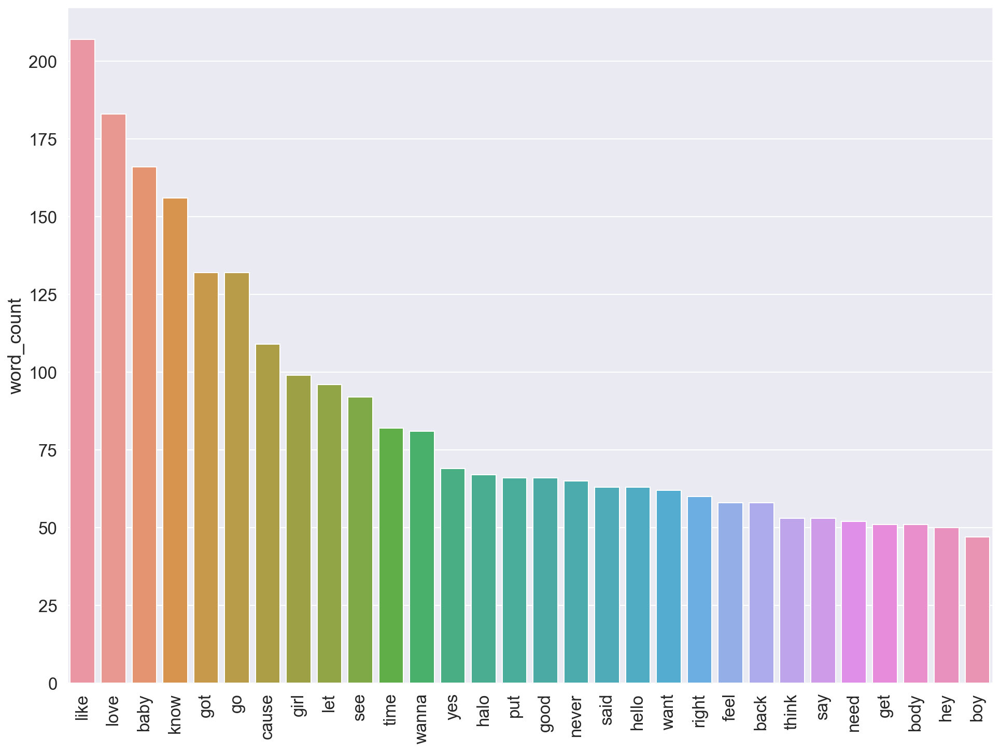

 
Artist: Caribou
           word_count
say                80
love               35
house              17
away               16
leave              16
ever               12
tell               12
knows              12
gonna              11
best                9
goes                8
day                 7
go                  7
see                 7
gone                6
make                6
know                6
ohh                 5
take                5
life                5
thing               5
need                4
years               4
sure                4
sometimes           4
wrong               4
way                 4
come                4
left                4
got                 4


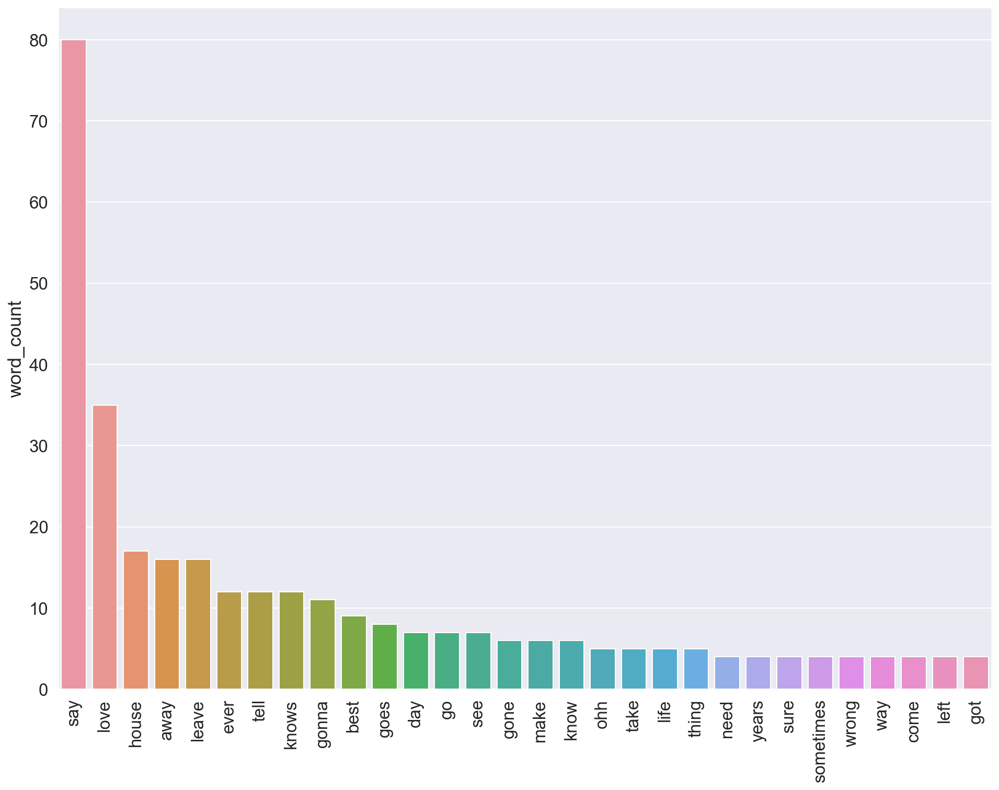

 
Artist: Fall Out Boy
          word_count
beat              84
like              74
love              60
one               51
live              50
last              46
know              45
remember          44
baby              43
get               41
come              41
way               36
back              34
american          34
let               32
young             32
us                31
never             28
take              28
fall              27
home              26
hey               25
say               25
ever              24
long              24
little            24
sun               23
wanna             22
anything          21
mighty            21


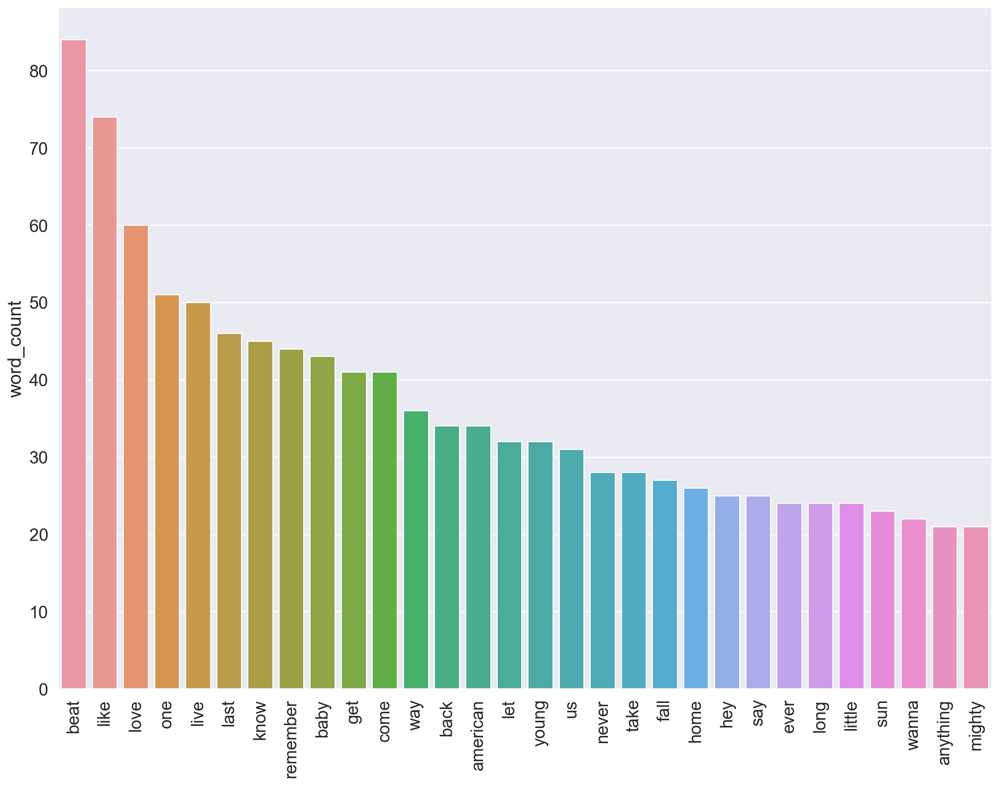

 
Artist: Fleetwood Mac
          word_count
tell              40
love              33
go                29
lies              26
got               24
way               20
want              18
baby              17
hold              14
like              14
say               13
mind              13
comes             13
know              12
back              12
disguise          12
get               11
maybe             11
loving            10
head              10
ever              10
time               9
taken              9
around             9
little             9
falling            9
see                9
eyes               9
turning            9
rhiannon           9


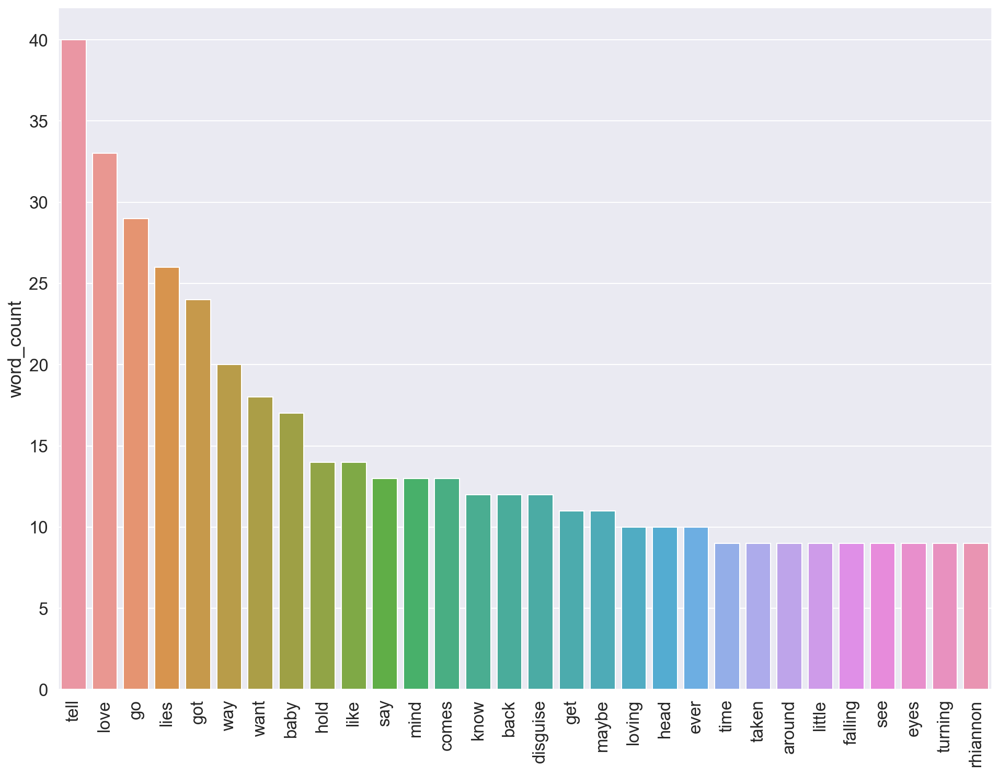

 
Artist: Foo Fighters
           word_count
go                 89
come               82
one                82
say                76
back               70
away               57
never              54
time               49
like               49
know               46
let                42
life               42
best               42
die                39
another            38
way                36
days               36
make               35
done               34
something          32
run                32
want               32
word               29
give               28
feel               28
wheels             27
got                26
nothing            26
take               24
clear              23


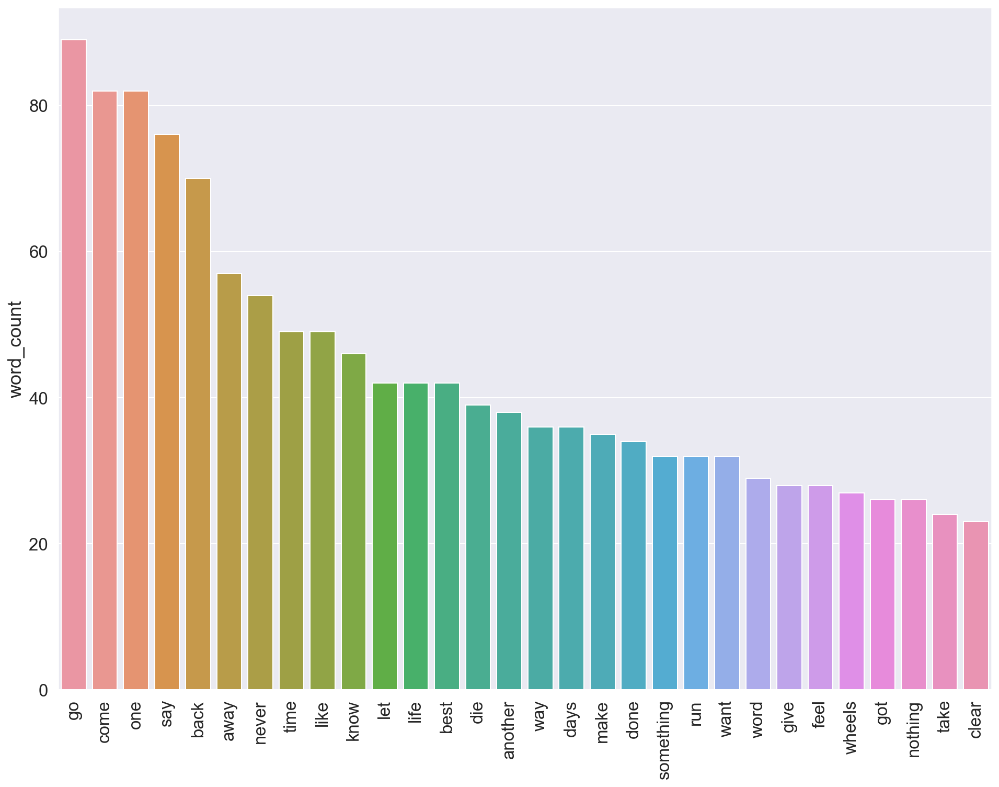

 
Artist: Frank Ocean
         word_count
know             72
like             71
love             58
got              51
good             44
life             44
see              34
could            33
lost             29
working          29
feel             29
run              28
time             28
pyramid          27
sweet            26
nothing          23
think            22
tonight          22
one              22
get              21
back             20
make             19
real             19
fuck             19
go               19
us               18
girl             18
keep             18
mind             18
world            17


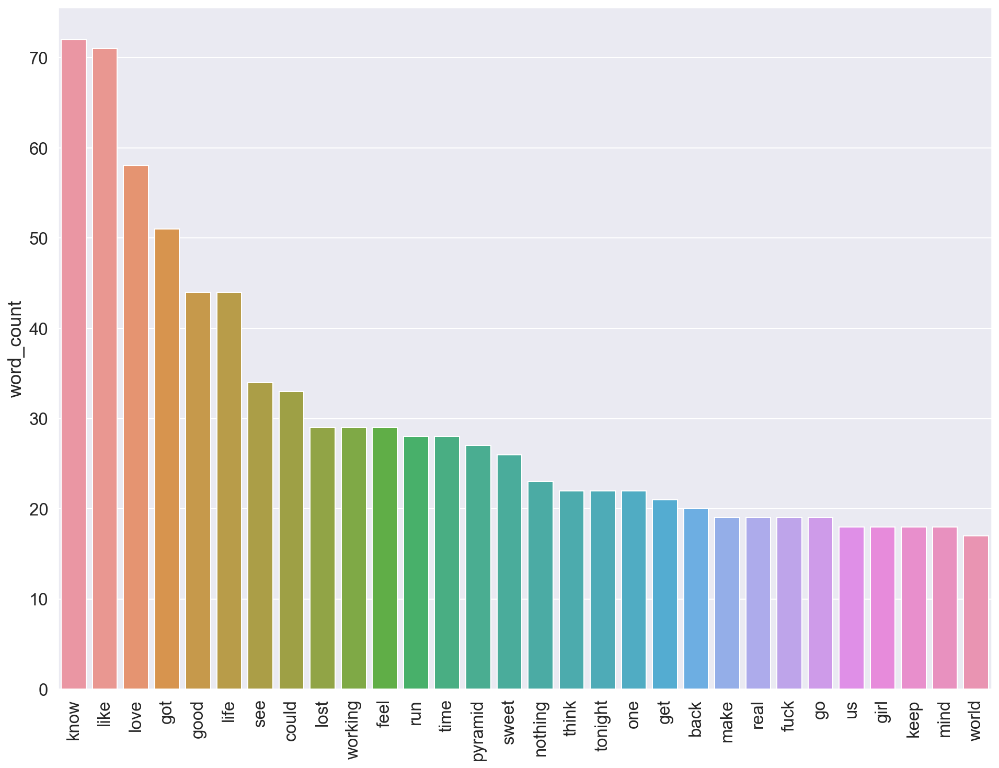

 
Artist: Gorillaz
           word_count
alone              57
coming             54
get                51
gone               48
love               47
ay                 45
stop               43
got                40
money              38
like               35
day                33
know               31
time               31
everybody          30
light              28
feel               27
good               26
white              26
never              26
see                23
push               21
go                 21
vision             20
find               20
inner              20
gonna              20
cool               19
bump               18
back               18
think              18


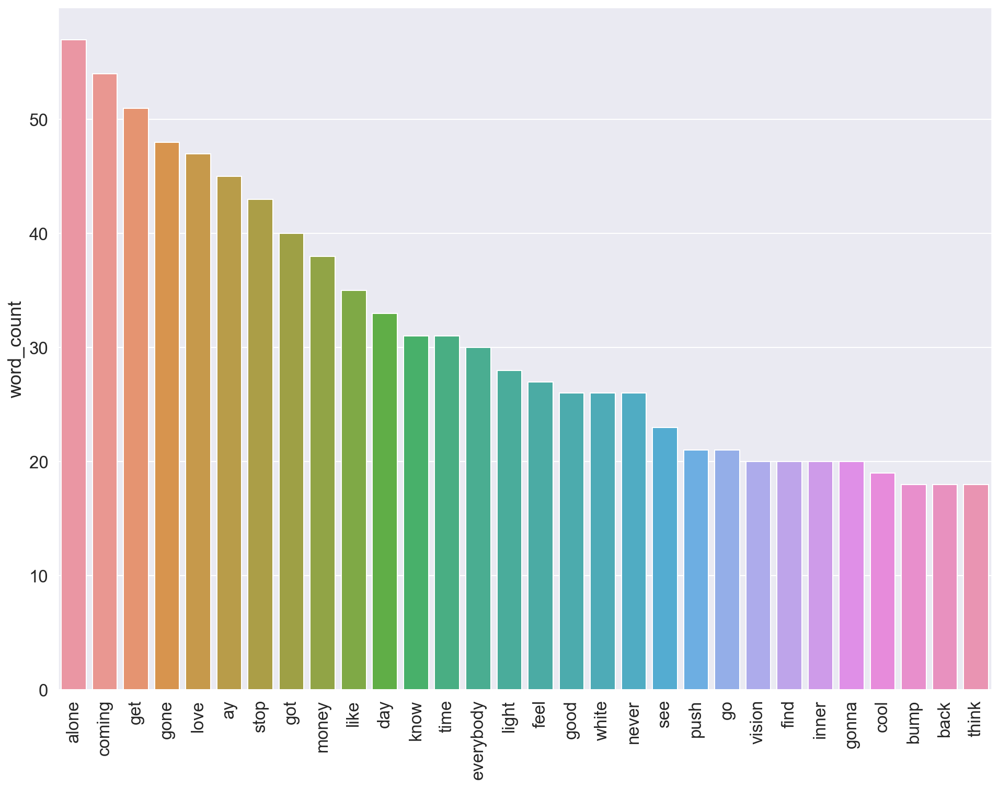

 
Artist: HAIM
         word_count
never           114
know             85
falling          79
right            54
give             49
back             48
love             48
say              44
want             39
take             33
saying           32
need             30
tried            27
mind             25
good             24
go               23
look             22
forever          21
knew             20
guess            20
felt             20
could            18
keep             17
gave             17
get              17
time             16
make             16
hear             16
came             16
baby             15


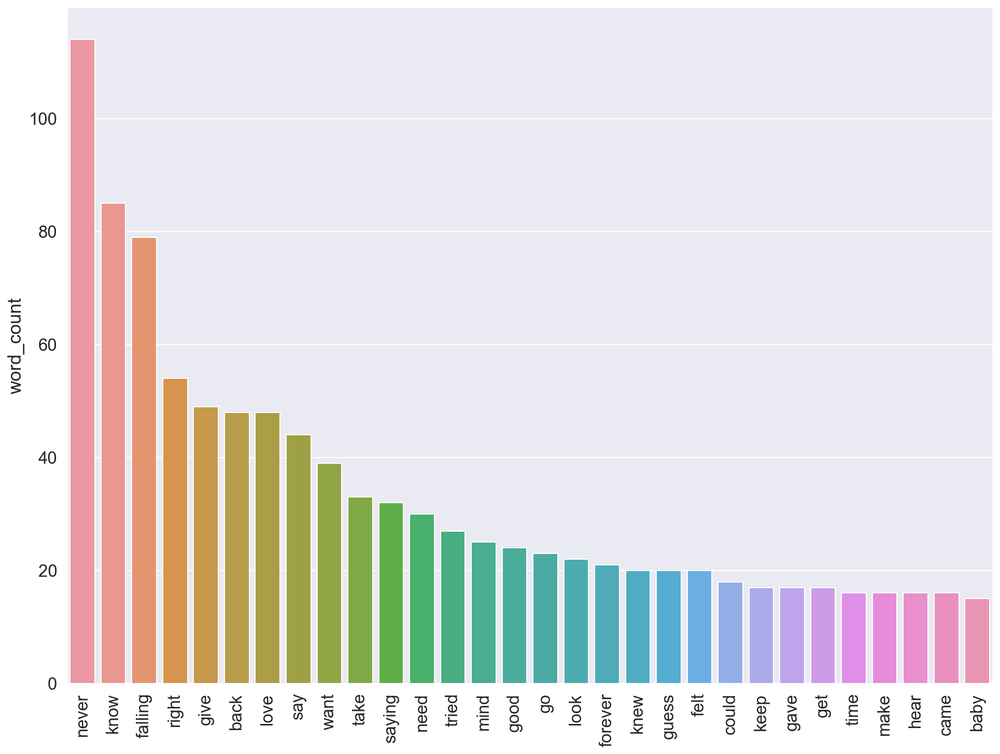

 
Artist: John Legend
         word_count
love            182
know            163
go              122
let              95
time             75
like             73
wanna            70
one              62
baby             56
heaven           53
alright          48
come             45
make             44
take             43
need             43
think            40
want             38
dream            37
night            36
cause            36
tonight          35
little           34
live             33
see              31
save             31
say              31
give             31
never            30
try              30
stay             29


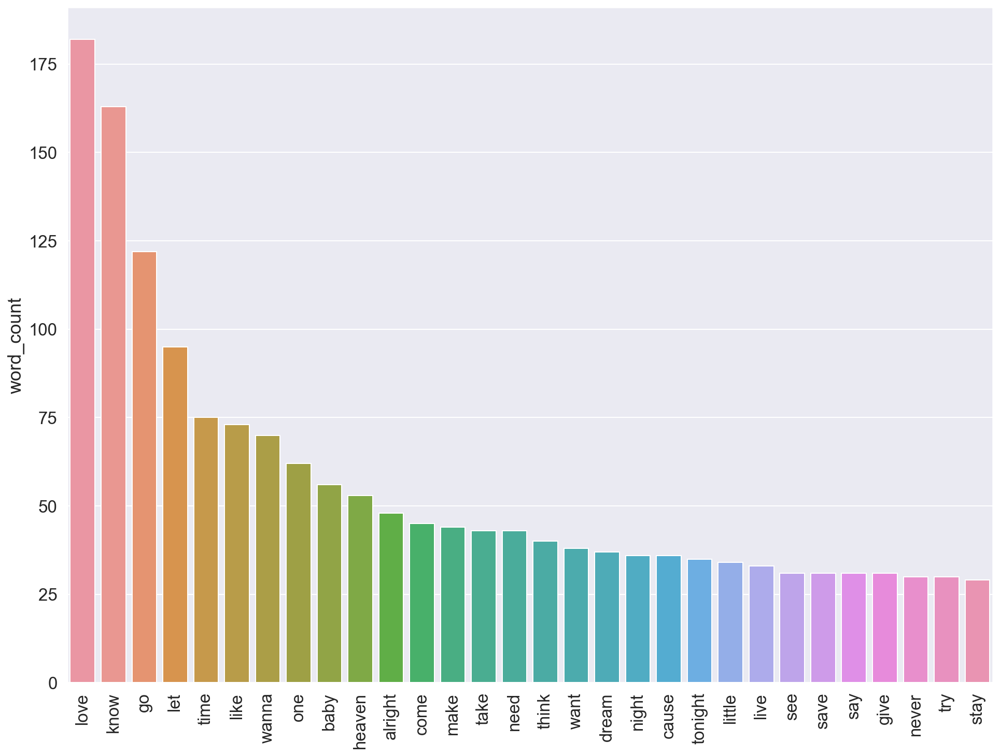

 
Artist: Kendrick Lamar
         word_count
like            192
know            135
feel            126
love            117
got             116
nigga           111
get             103
bitch            99
shit             84
one              79
life             75
make             74
gon              65
hol              65
real             64
see              62
say              61
back             59
tell             59
go               58
wanna            56
king             55
alright          53
want             53
fuck             47
take             46
yah              45
world            45
way              45
niggas           45


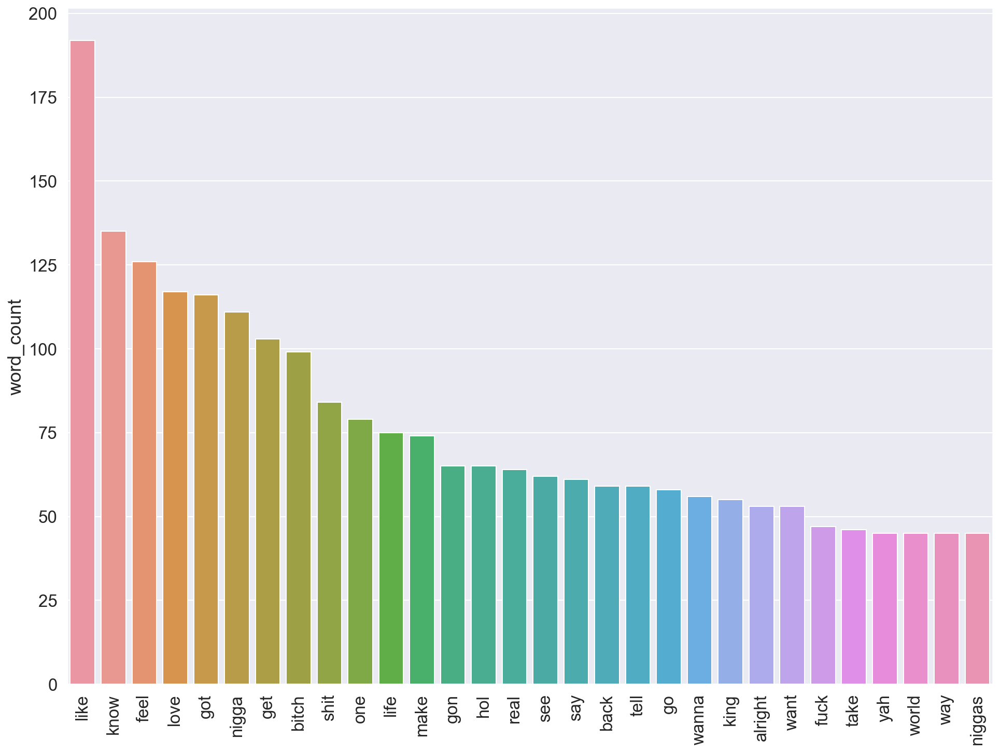

 
Artist: Kings of Leon
           word_count
like               60
know               55
say                51
go                 51
way                50
away               47
take               44
one                44
got                44
see                41
going              40
get                37
back               37
gonna              34
come               33
never              31
want               29
heart              28
something          28
could              26
hey                25
night              22
walk               22
right              21
wait               21
knock              20
find               20
feel               20
make               20
better             20


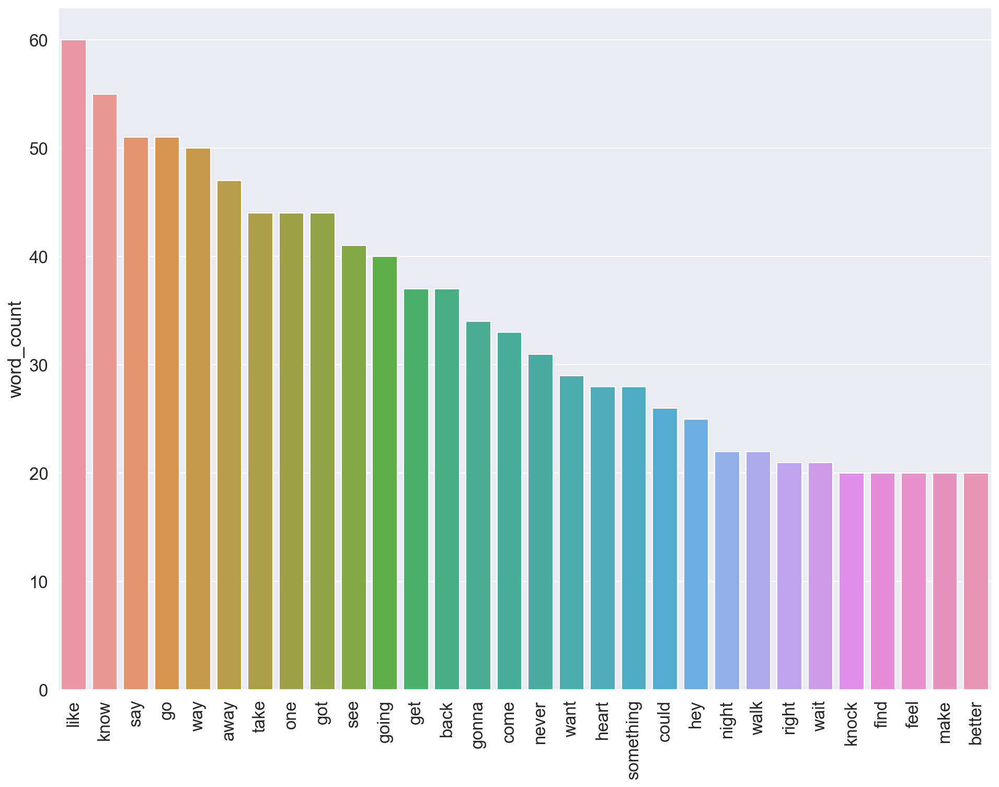

 
Artist: Korn
         word_count
life             65
never            57
got              47
inside           44
fucking          33
away             32
give             32
hate             31
right            31
pain             31
get              30
body             30
tongue           29
take             29
gonna            29
fuck             28
see              28
feel             28
ball             28
music            26
say              25
way              24
ever             23
shut             22
think            22
come             22
beg              21
bring            19
sick             19
back             19


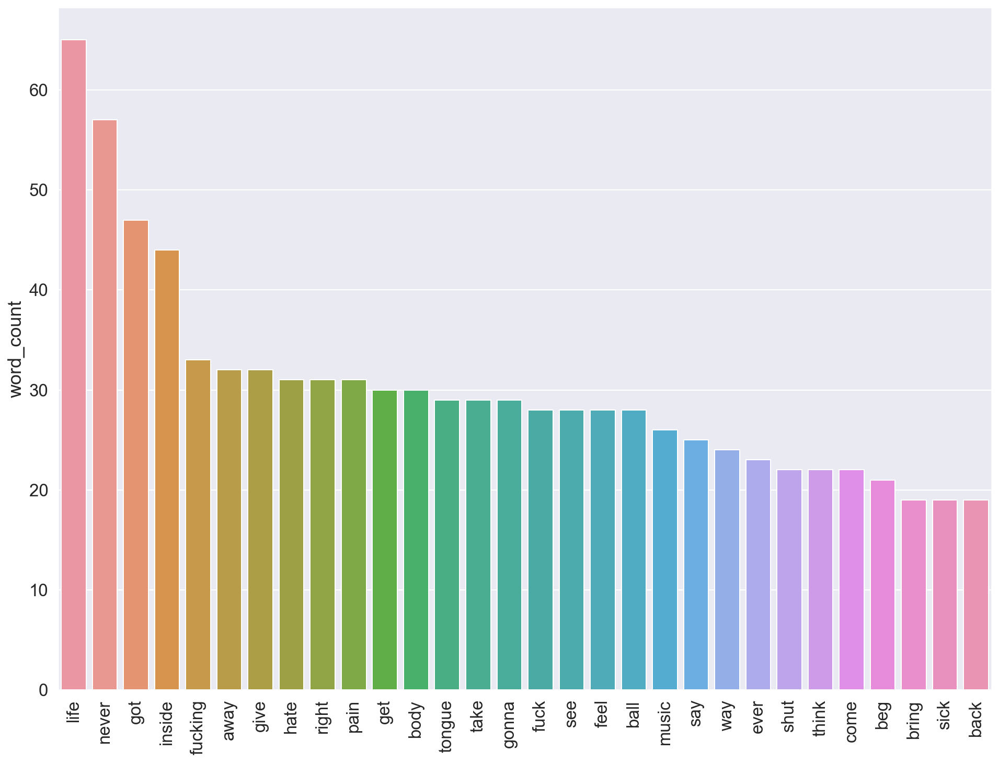

 
Artist: LCD Soundsystem
          word_count
drunk             65
time              64
want              52
change            49
girls             48
come              48
know              44
love              42
never             41
people            34
like              33
live              33
make              32
things            28
wanna             28
without           28
north             28
take              27
one               27
beat              26
night             26
coming            25
us                25
home              24
terrible          22
feel              21
past              21
really            20
parts             20
give              20


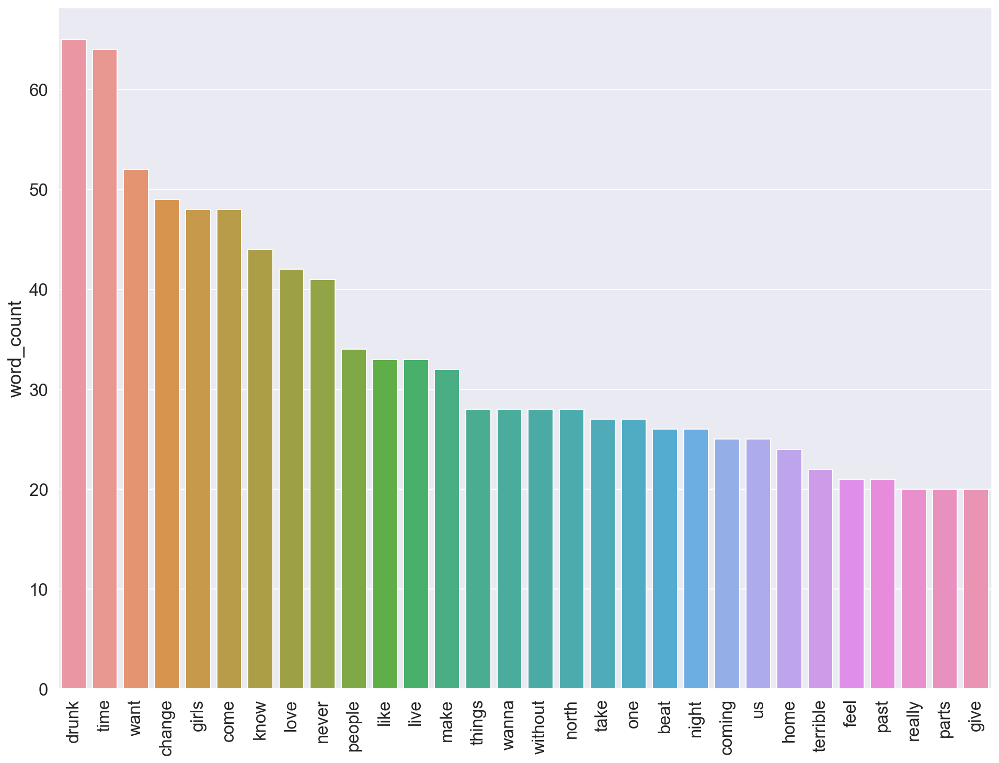

 
Artist: Lady Gaga
           word_count
love              226
baby              169
want              164
hair              140
cause             119
got               118
could             117
know              115
wanna             115
like              114
heart              87
way                83
girl               72
dance              70
hey                69
bad                69
fame               69
face               67
body               66
good               65
touch              64
let                54
gonna              52
make               52
po                 50
dirty              47
mum                45
alejandro          44
rough              44
say                44


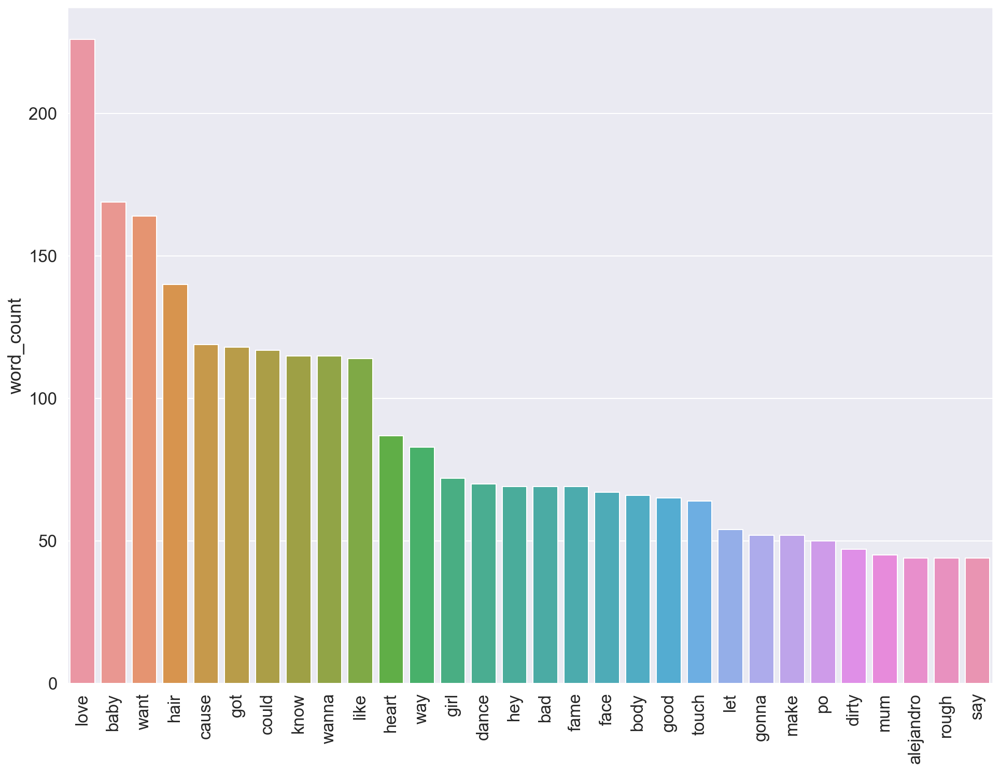

 
Artist: Led Zeppelin
         word_count
baby             37
know             28
let              24
time             24
jesus            21
see              20
long             20
lonely           20
light            19
got              17
could            16
never            16
well             16
way              15
come             15
make             15
people           14
hey              14
love             13
away             13
go               13
hear             12
going            12
take             12
gonna            11
mama             10
bye              10
darling          10
many             10
right             9


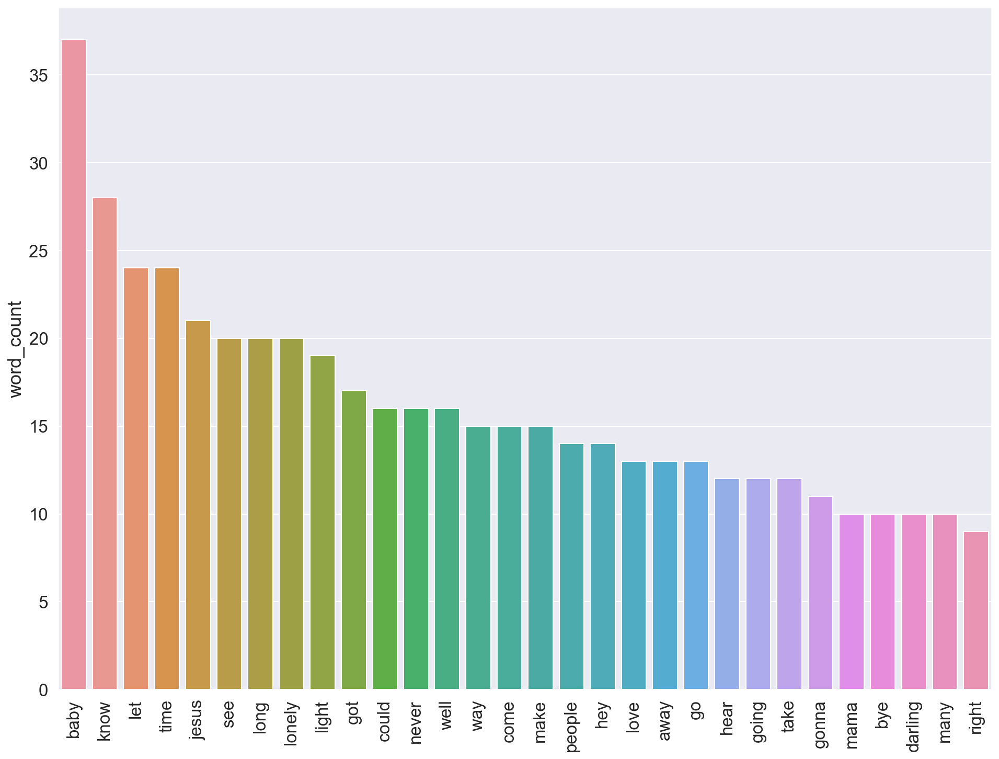

 
Artist: Lil Wayne
         word_count
like            345
nigga           285
got             232
bitch           164
know            153
get             152
fuck            140
shit            129
niggas          122
see             114
love            102
let              97
go               94
ya               93
make             85
bitches          82
right            81
one              79
cause            78
money            76
tell             76
call             69
never            68
back             65
weezy            63
ass              62
baby             62
say              62
man              59
carter           58


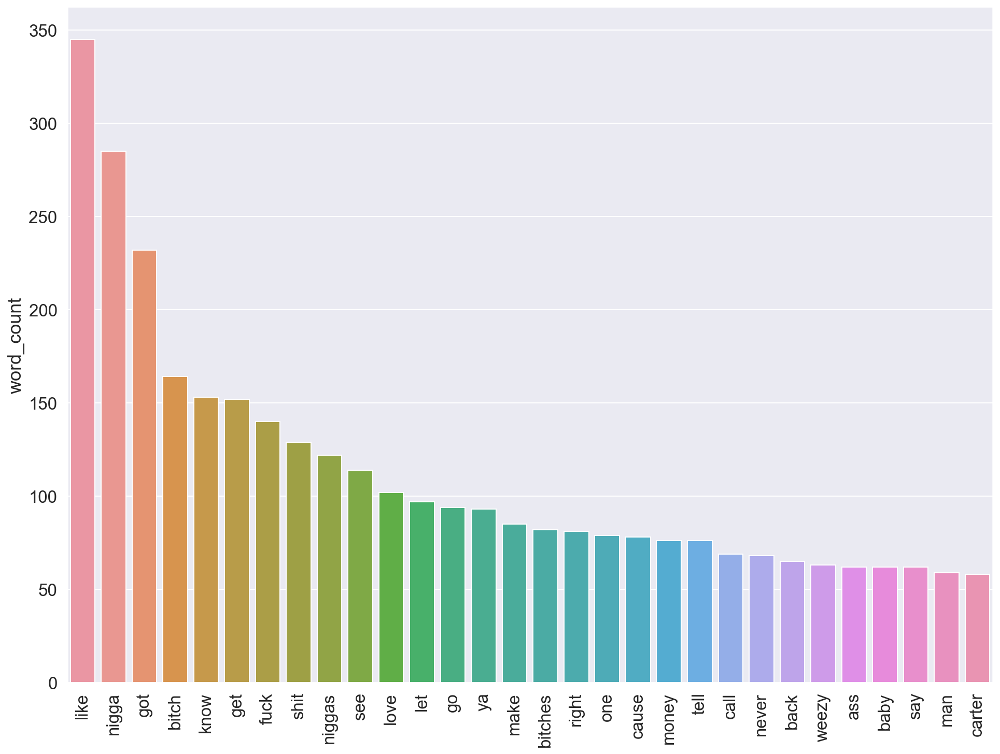

 
Artist: Linkin Park
            word_count
away               134
like               129
one                 88
know                80
go                  75
let                 68
back                62
never               62
see                 62
want                57
say                 51
take                48
right               47
time                45
someone             44
way                 41
inside              39
find                37
things              37
run                 35
everything          34
cause               33
got                 33
give                32
face                30
end                 28
feel                28
skin                28
come                27
little              26


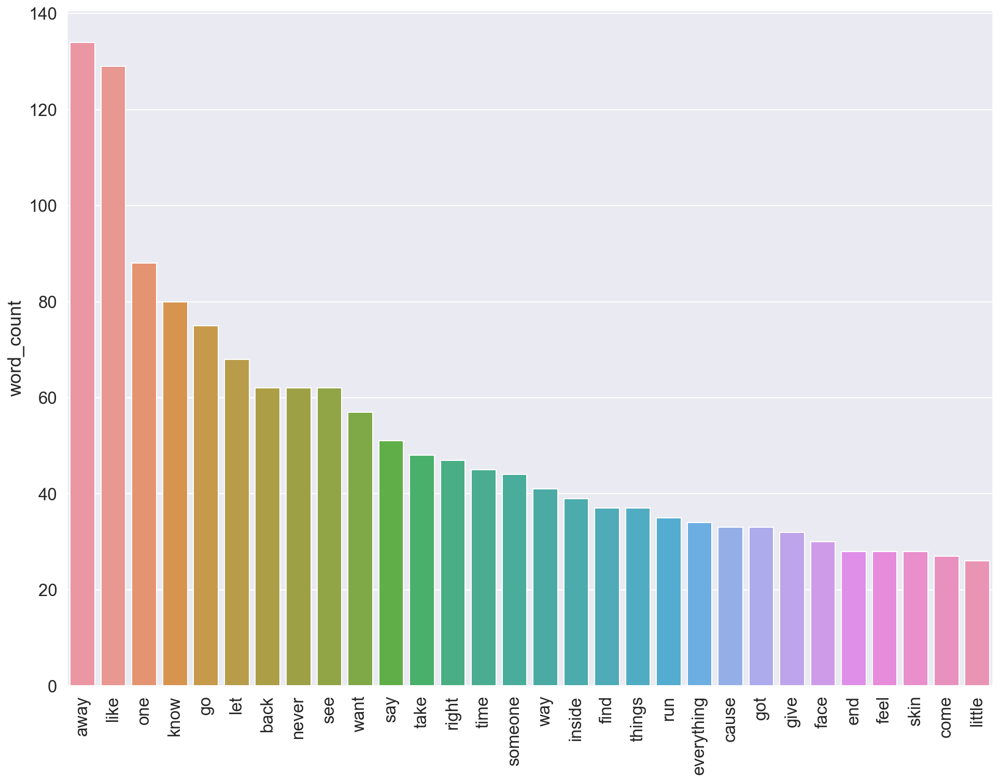

 
Artist: Mac Miller
        word_count
like           271
get            238
got            191
go             171
know           149
shit           148
fuck           136
one            132
love           113
let            106
mind            98
never           97
time            92
life            89
back            88
little          87
need            87
world           87
keep            86
night           84
burn            82
cause           81
see             80
money           78
bitch           77
live            76
take            76
tell            72
wanna           72
make            71


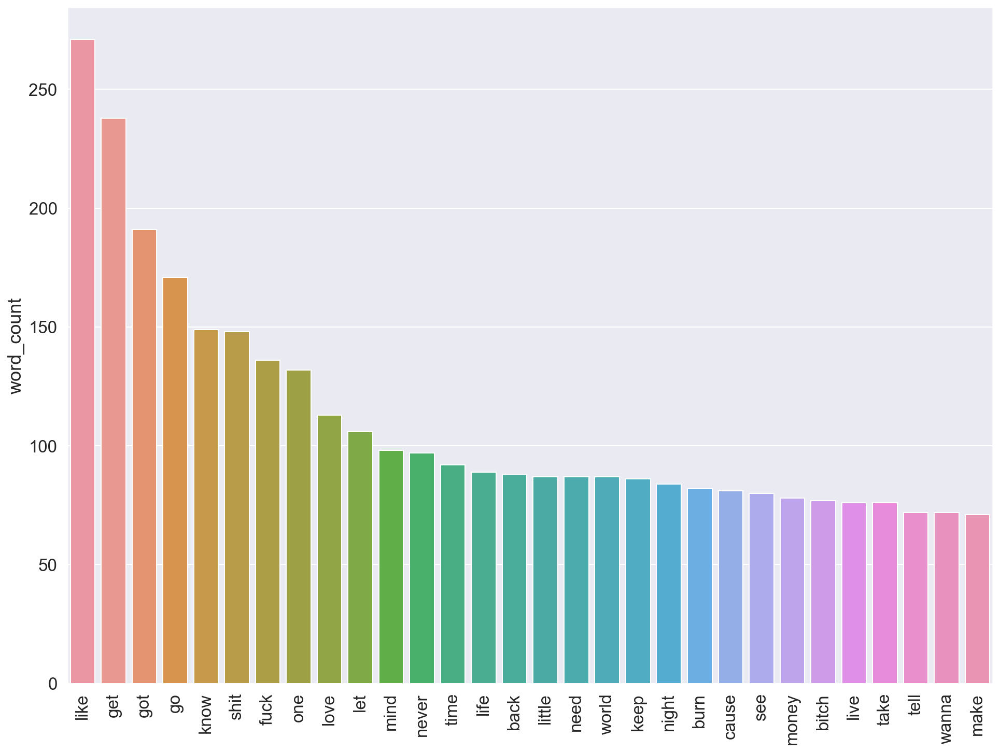

 
Artist: Metallica
            word_count
never               70
hey                 35
gone                29
anger               29
one                 23
want                20
pain                18
nothing             17
light               16
open                16
flush               16
know                15
known               15
free                15
sleeps              15
see                 14
felt                14
say                 14
fame                14
round               14
neck                13
wish                13
unforgiven          13
go                  13
saint               13
away                12
forgive             12
man                 12
life                12
feel                12


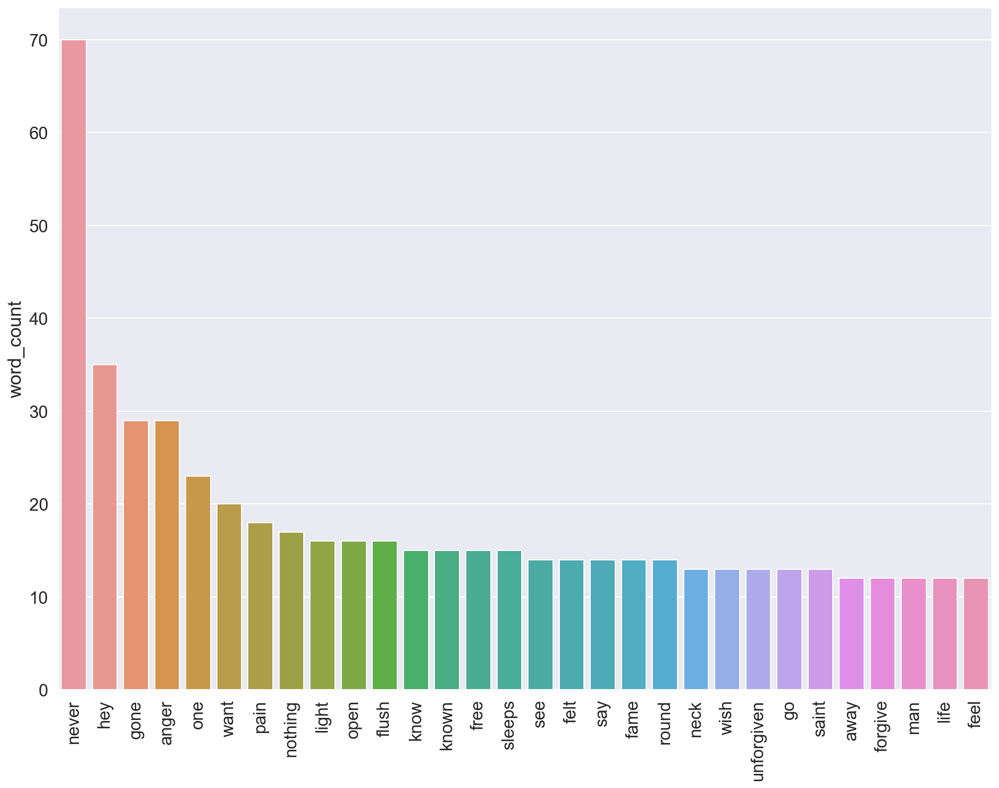

 
Artist: Nirvana
           word_count
take               54
way                45
home               44
away               44
grandma            42
hello              39
said               29
stay               25
find               23
rape               22
go                 21
care               20
like               20
know               18
one                18
got                17
gonna              17
wait               16
crack              16
could              16
gotta              14
mmm                14
hey                14
something          14
advice             14
happy              14
memoria            13
think              12
better             12
mind               12


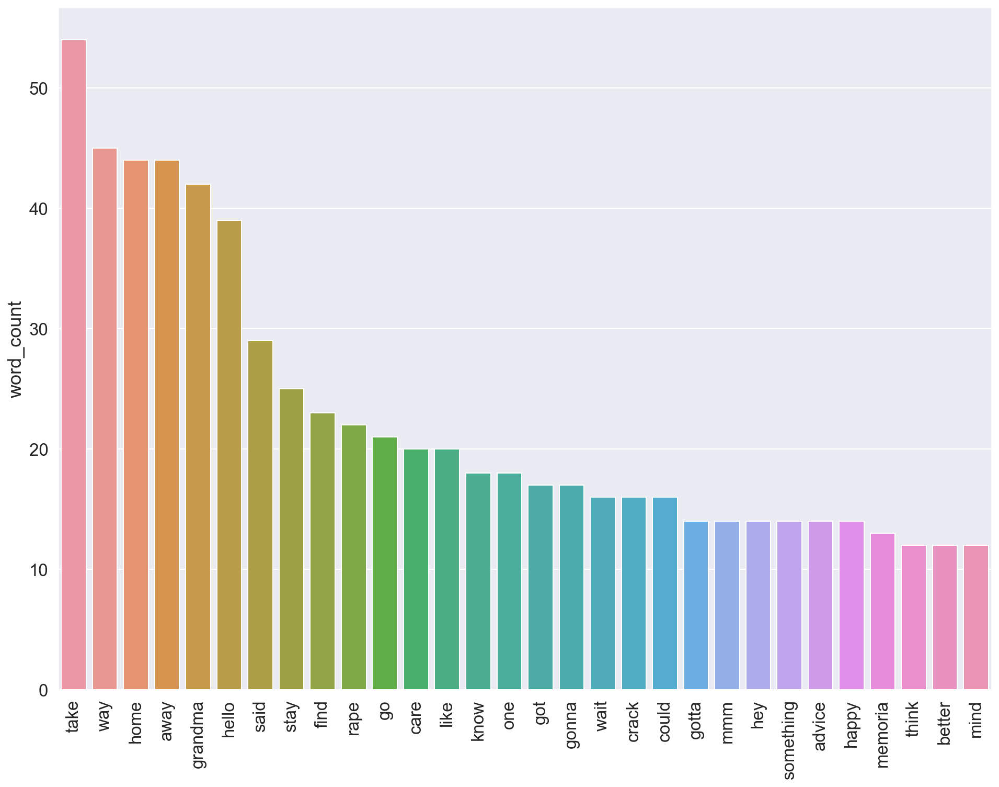

 
Artist: Passion Pit
         word_count
higher           53
go               50
take             40
walk             40
let              37
ever             29
never            25
like             24
love             23
get              23
sorry            21
one              20
make             19
know             18
things           18
feel             18
way              17
away             16
say              16
could            15
another          14
think            13
need             12
bout             12
come             12
always           12
design           11
said             10
took             10
life             10


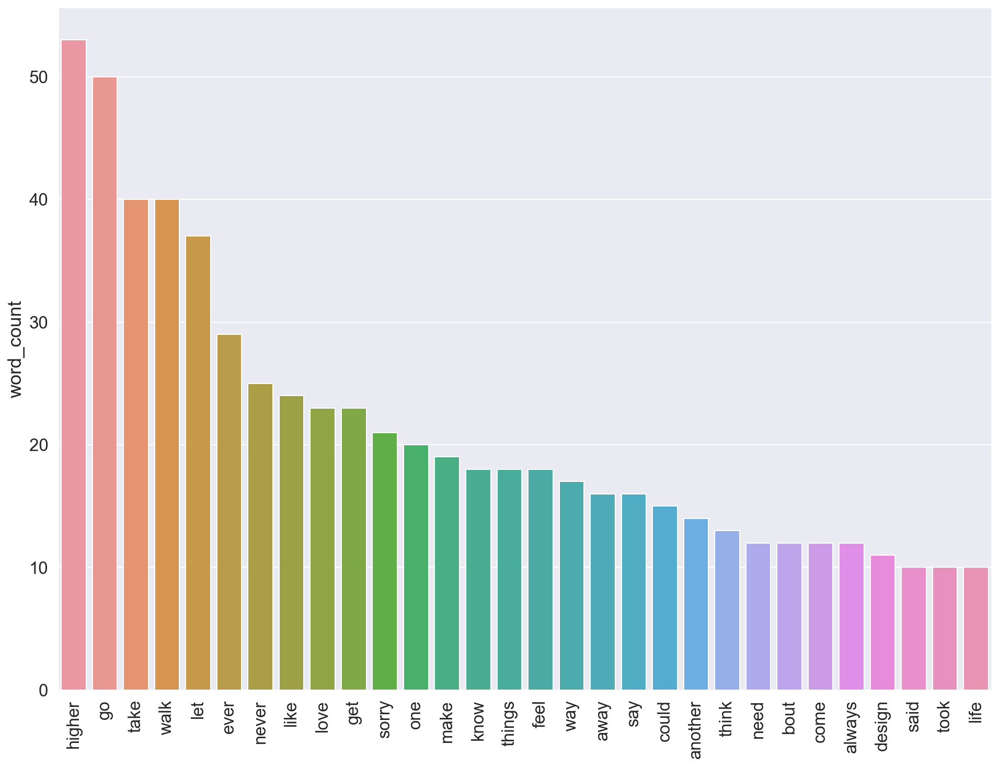

 
Artist: Radiohead
           word_count
know               33
like               30
one                28
get                27
want               27
rain               26
let                26
come               25
truth              25
mess               25
back               23
children           23
first              23
really             22
take               22
broken             21
lost               20
nothing            20
best               19
walking            18
time               18
round              18
hearts             18
enough             17
make               17
paying             16
attention          16
around             16
good               16
go                 15


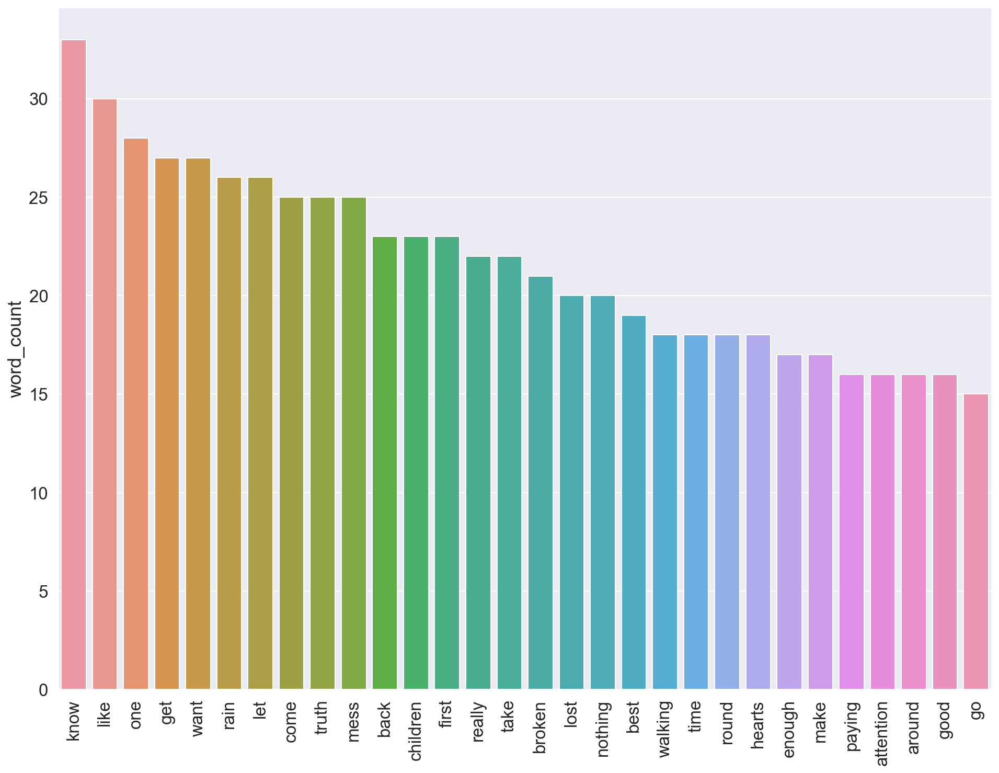

 
Artist: Red Hot Chili Peppers
         word_count
get              99
know             96
take             77
got              75
love             66
never            64
go               61
like             59
come             59
say              59
time             54
want             54
make             54
around           52
girl             51
could            48
one              46
magik            44
way              43
hey              43
another          43
ayo              39
little           37
cause            34
away             34
mind             33
life             33
let              33
sex              32
baby             32


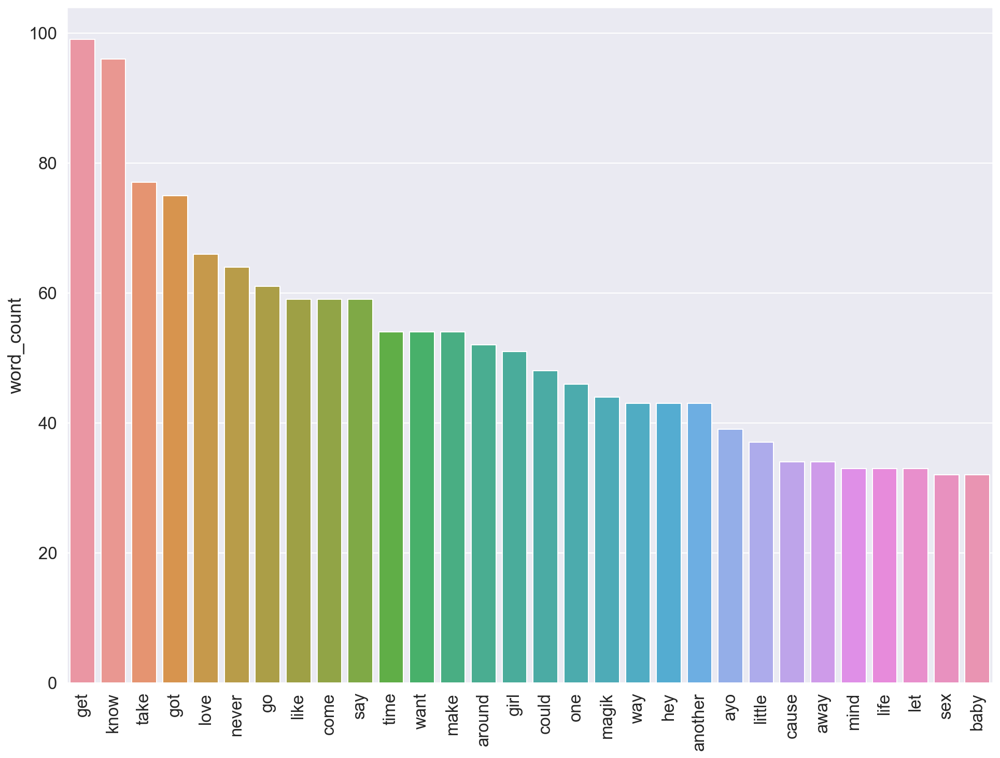

 
Artist: Rihanna
         word_count
love            290
like            215
night           194
know            144
baby            139
got             109
jump            102
boy             101
cause            91
take             88
wanna            87
let              85
work             83
want             79
come             77
one              69
hard             68
get              66
see              65
go               65
feel             61
ya               57
feeling          57
make             55
pum              54
ride             52
money            50
never            50
need             50
mon              48


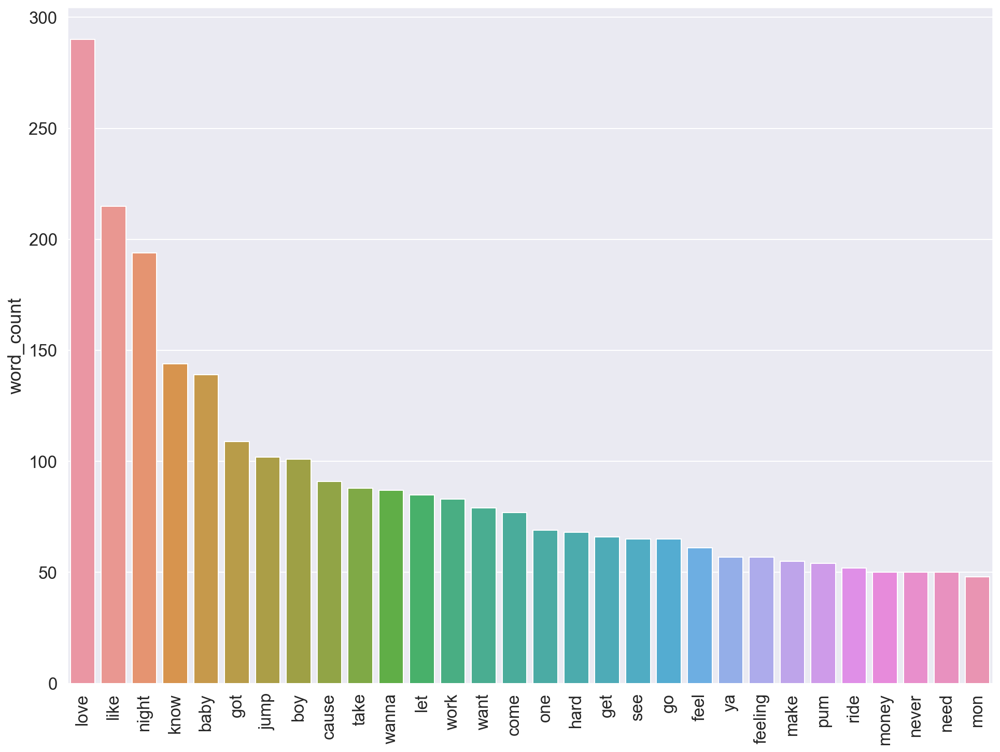

 
Artist: Slipknot
            word_count
fuck               114
know               109
never              100
get                 78
life                75
inside              71
one                 69
like                66
die                 64
everything          62
let                 62
hey                 60
see                 58
cut                 56
wanna               55
shit                55
fucking             52
way                 52
six                 51
five                50
got                 49
give                46
want                41
world               40
end                 39
make                39
time                39
away                37
go                  37
kill                35


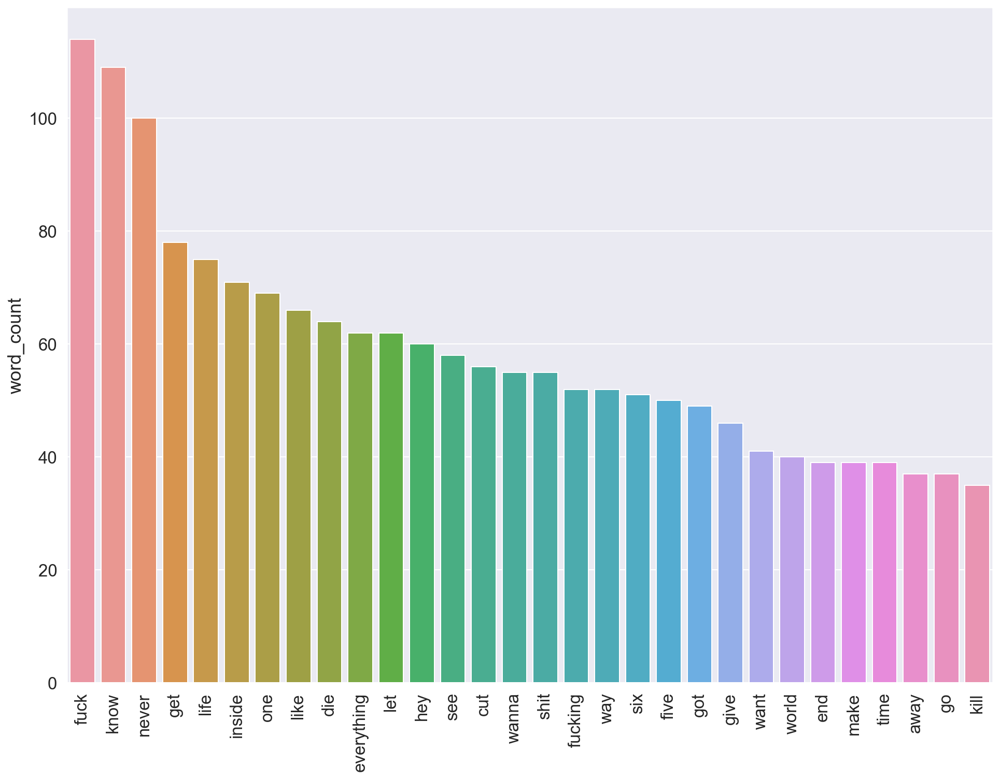

 
Artist: System Of A Down
           word_count
pogo               99
everybody          77
eat                51
right              49
go                 48
know               47
hollywood          46
feel               46
us                 42
away               41
boom               40
hey                39
one                38
die                38
around             37
life               33
world              32
take               30
mind               30
beat               30
need               29
old                29
people             29
man                27
school             26
stop               25
time               24
day                23
fuck               23
eyes               22


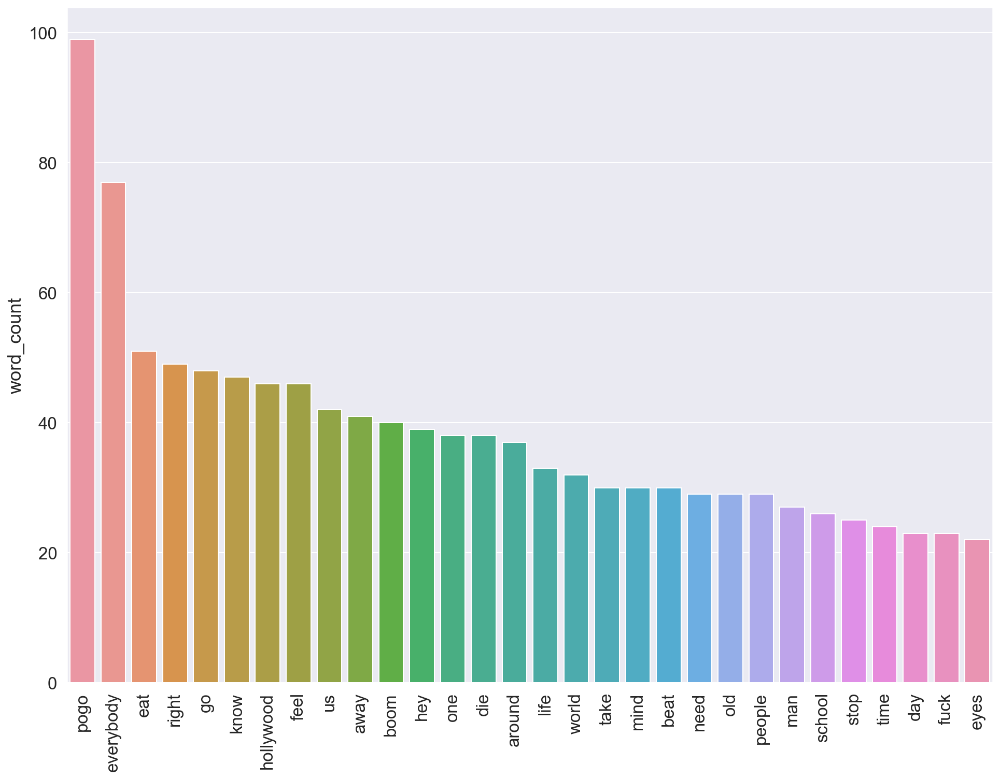

 
Artist: Tame Impala
            word_count
know                55
like                44
go                  28
life                20
something           20
feel                19
never               18
could               18
feels               18
time                17
got                 17
one                 15
get                 14
love                14
eventually          13
come                13
past                13
long                13
day                 13
hard                12
let                 11
right               11
maybe               11
close               10
nothing             10
ready               10
backwards           10
around               9
thinking             9
end                  9


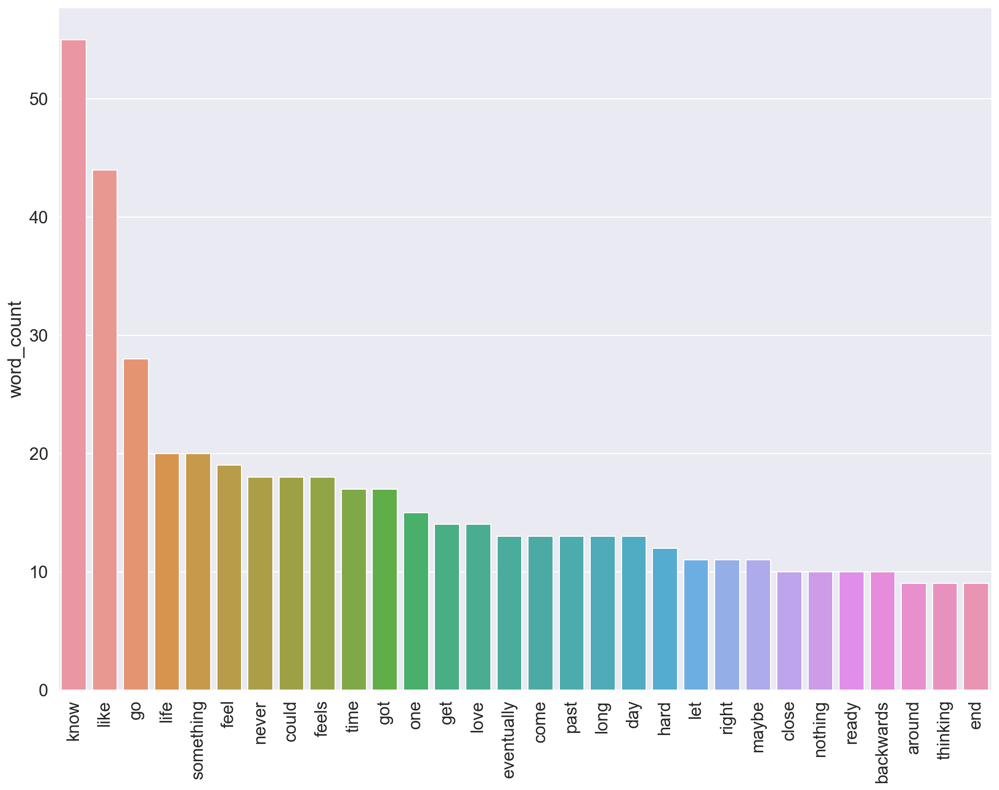

 
Artist: Taylor Swift
       word_count
like          202
know          161
love          138
never         133
got           109
time          107
cause         104
back          101
say            97
think          94
baby           89
ey             84
made           82
shake          79
one            78
see            77
look           76
ever           76
wish           73
go             71
want           69
could          66
eyes           65
wanna          63
take           57
right          57
said           56
gonna          54
call           53
come           53


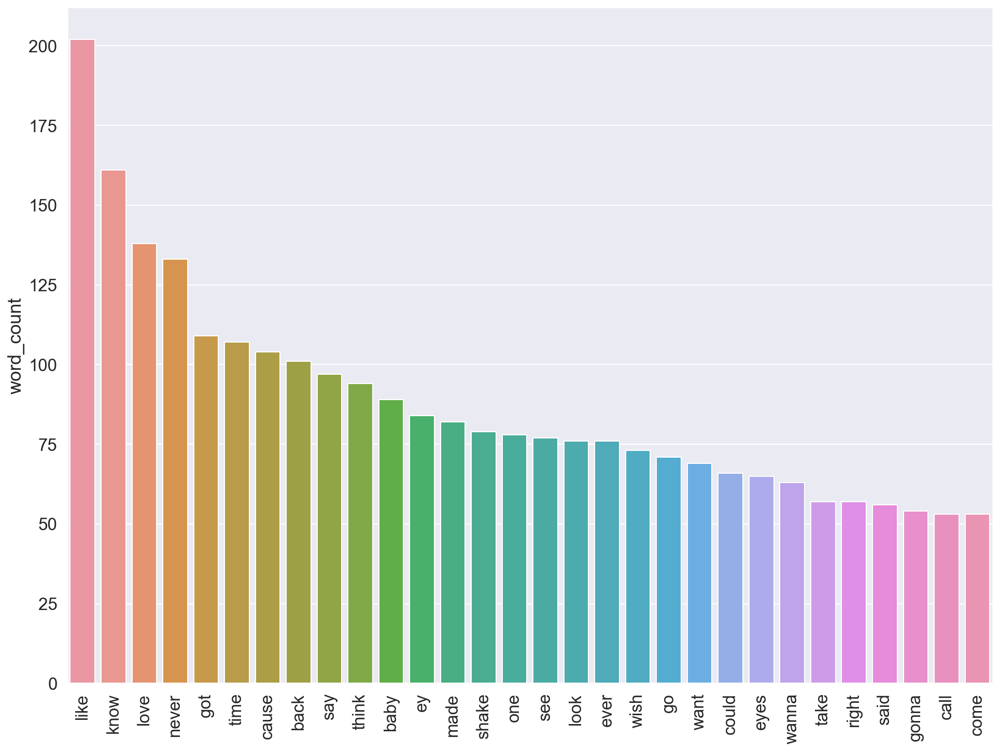

 
Artist: The Black Keys
         word_count
got              98
go               73
know             70
hey              68
love             62
get              59
like             51
one              49
never            47
back             47
let              45
eyes             40
way              39
see              39
right            38
heart            38
time             34
mind             34
stop             33
gonna            31
well             30
thing            30
lies             30
girl             30
baby             29
darling          28
away             28
hold             28
run              26
low              26


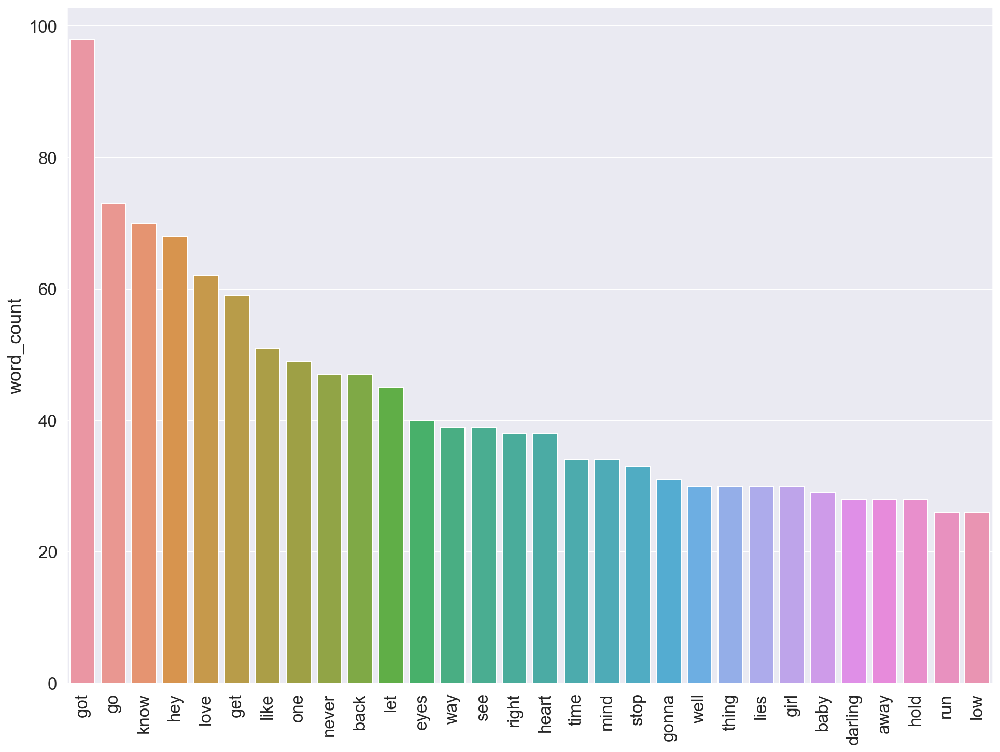

 
Artist: The Rolling Stones
         word_count
got              31
away             31
come             27
roll             24
shot             19
angie            18
heart            18
monkey           18
baby             18
want             15
see              14
thumb            13
black            12
breaker          11
say              11
right            11
wanna            11
painted          10
world            10
well             10
love             10
get              10
rider             9
babe              9
still             9
need              9
change            9
take              8
someone           8
tear              8


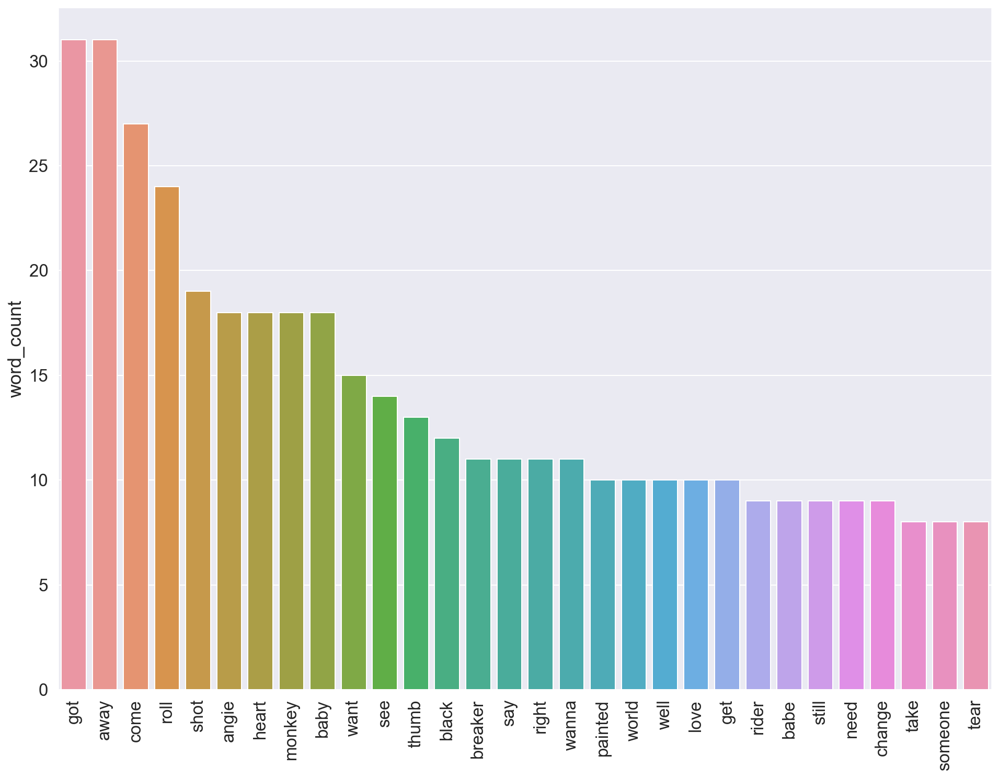

 
Artist: The Weeknd
          word_count
know             261
love             185
baby             156
girl             140
feel             115
got              108
nothing           94
cause             92
need              87
hey               87
want              77
let               76
like              69
make              68
coming            67
life              65
keep              58
get               57
time              56
shit              55
go                55
could             51
find              49
money             46
never             46
somebody          45
babe              44
said              43
live              43
tell              41


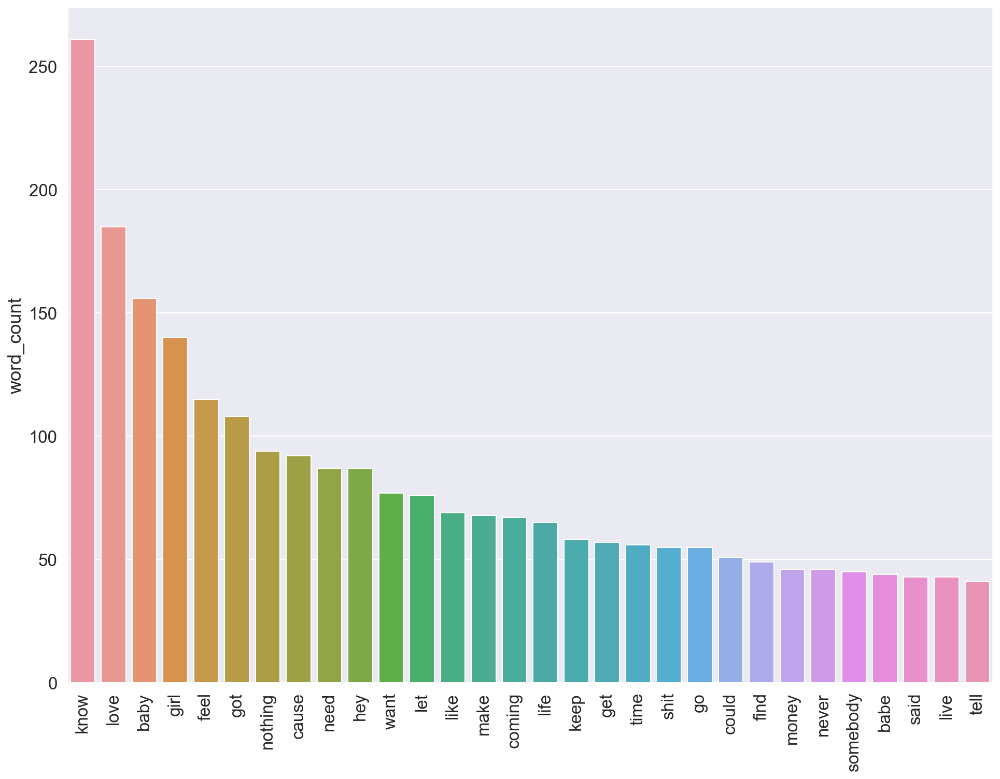

 
Artist: Tyler, The Creator
         word_count
fuck            227
like            178
nigga           144
fucking         141
shit            124
got              99
time             93
get              89
bitch            86
back             86
know             75
cause            68
niggas           67
go               65
take             62
let              58
call             58
wang             56
see              55
golf             53
find             48
one              45
never            43
could            39
girl             38
getting          38
tell             37
want             37
man              35
boy              33


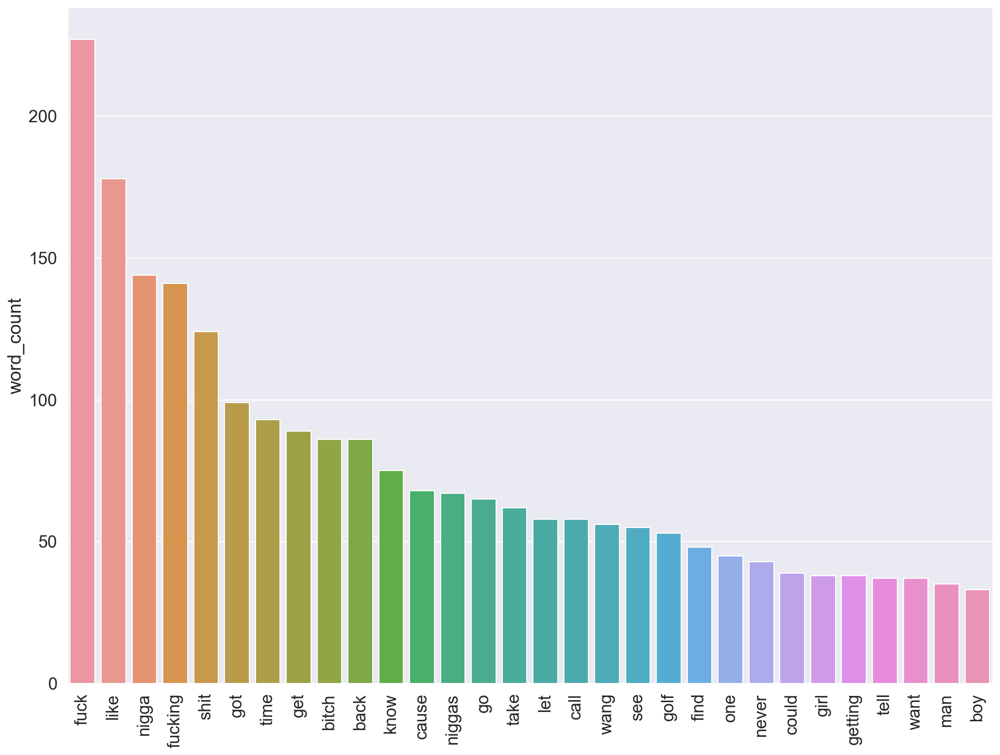

 
Artist: Wiz Khalifa
        word_count
got            111
us             103
get             90
know            89
hard            88
niggas          87
roll            77
hol             77
cause           74
nigga           73
like            72
let             66
go              61
shit            60
money           60
wanna           56
gon             56
make            56
say             55
okay            55
see             51
black           50
yellow          50
fuck            49
one             44
goin            44
front           39
need            39
work            39
still           39


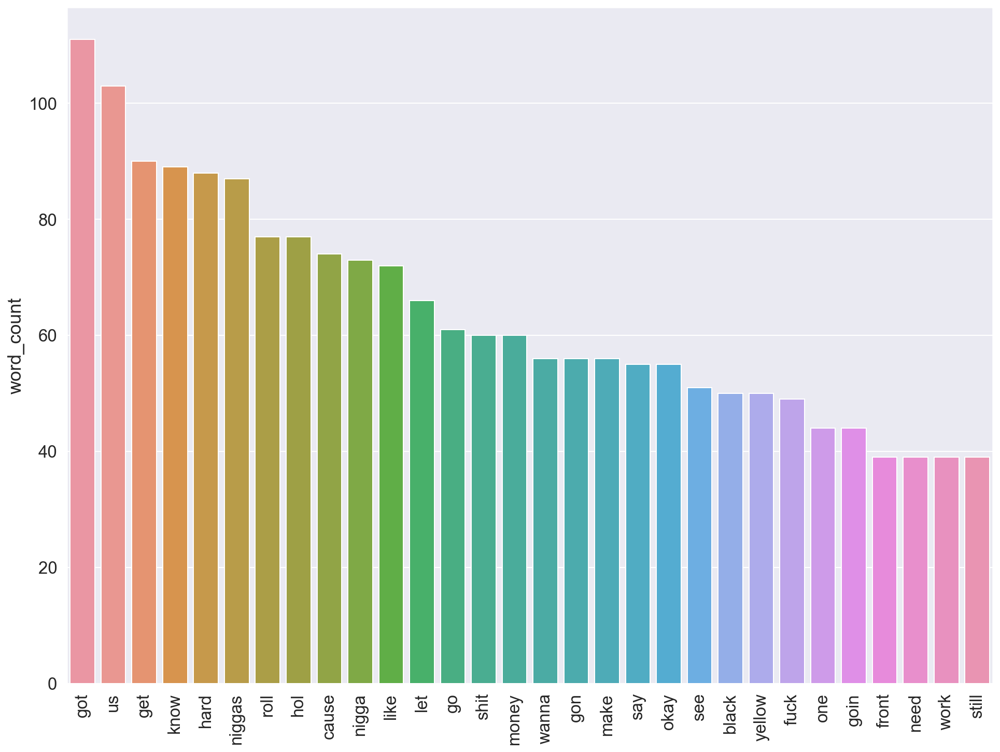

In [48]:
for name in data.artist_name.unique():
    cvec = CountVectorizer(strip_accents='unicode',
                       stop_words=stop, 
                       ngram_range=(1, 1))

    X_all = cvec.fit_transform(data[data.artist_name==name].lyrics_processed)
    columns = cvec.get_feature_names()
    
    CVEC = pd.DataFrame(X_all.toarray(),
                  columns=cvec.get_feature_names())
    print('Artist: {}'.format(name))
    
    cvec_df = pd.DataFrame(CVEC.sum().sort_values(ascending=False)[:30], columns=['word_count'])
    print(cvec_df)
    
    fig, ax = plt.subplots(figsize=(16,12))
    count_bar = sns.barplot(x=cvec_df.index, y=cvec_df.word_count);
    count_bar.set_xticklabels(labels=cvec_df.index,rotation=90);
    plt.show()
    print(' ')

* **Word tfidf per artist**

**Inter- tif and then sorting by artist**

In [49]:
tvec = TfidfVectorizer(strip_accents='unicode',
                       stop_words=stop, 
                       ngram_range=(1, 1))

X_all = tvec.fit_transform(data.lyrics_processed)
columns = tvec.get_feature_names()
    
TVEC = pd.DataFrame(X_all.toarray(),columns=columns)

TVEC['artist'] = data.artist_name

TVEC.set_index('artist', inplace=True)

Artist: A$AP Rocky
        word_tfidf
niggas    3.406190
nigga     2.936604
fuck      2.231375
like      2.058543
flacko    1.642322
got       1.339347
back      1.293803
bitch     1.180450
shit      1.104031
gettin    1.064533
swag      1.011919
lord      0.973611
love      0.909012
still     0.900664
tell      0.880242
young     0.871192
kids      0.850866
ap        0.841908
get       0.831054
come      0.828056
pop       0.800509
man       0.797143
new       0.796172
jodye     0.783459
make      0.773658
ball      0.752469
doot      0.727393
feel      0.726939
wine      0.720943
fine      0.708291


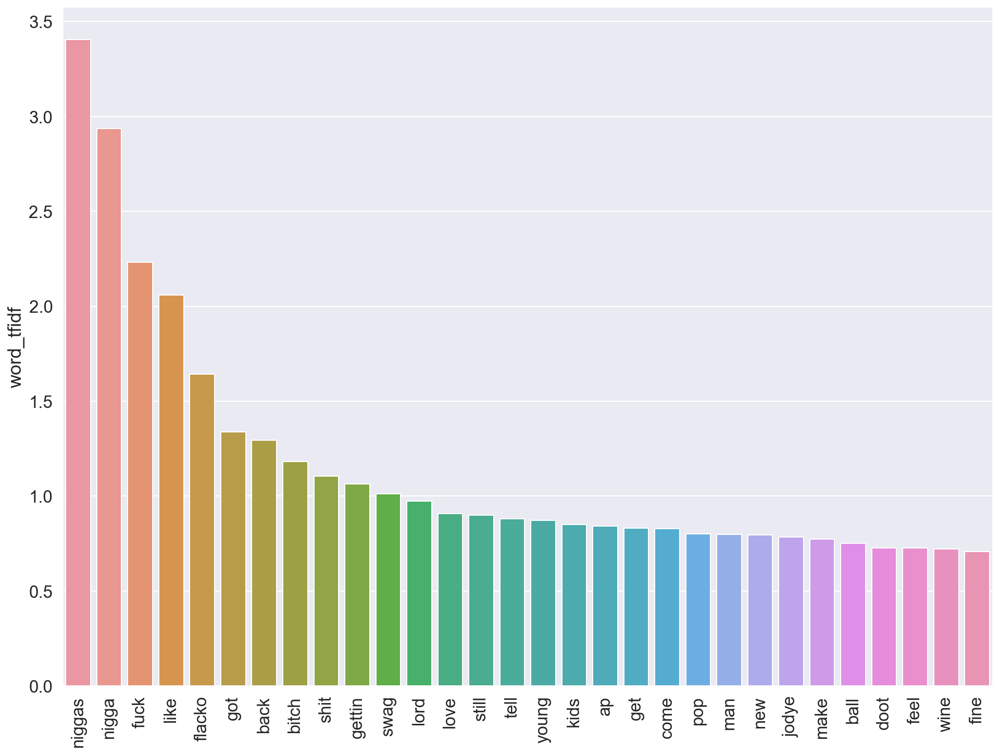

 
Artist: Adele
           word_tfidf
love         1.609977
like         1.251218
wish         1.063568
look         0.979276
go           0.927446
aye          0.903241
whenever     0.900439
miss         0.894276
let          0.889639
feel         0.875327
nothing      0.863870
never        0.853230
sweetest     0.763611
heart        0.761428
lea          0.751642
say          0.743373
always       0.715504
gonna        0.711475
take         0.697080
make         0.680409
sometimes    0.678389
deep         0.646844
river        0.636588
wonders      0.632578
lows         0.628538
world        0.623908
ready        0.617913
known        0.614500
could        0.603756
back         0.595351


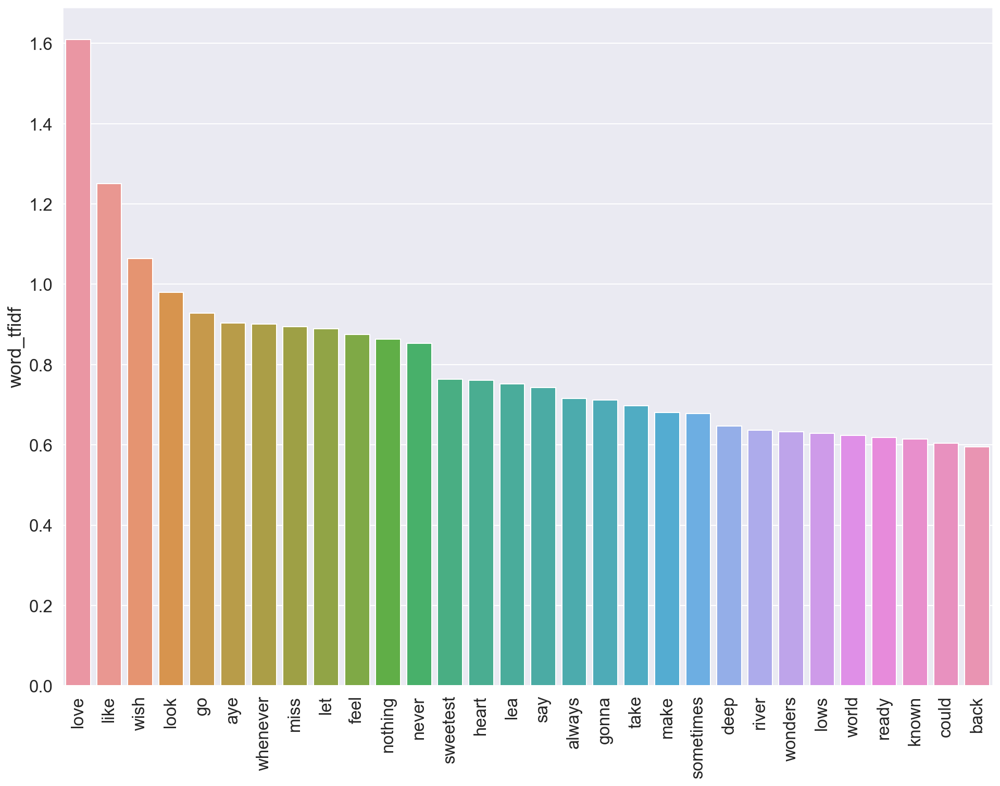

 
Artist: Amy Winehouse
           word_tfidf
man          1.158245
stronger     1.025160
amy          0.957835
lady         0.917634
day          0.891361
friends      0.768146
never        0.759700
get          0.759137
alone        0.753295
greater      0.723970
love         0.673522
mine         0.673489
come         0.667186
bed          0.621693
joy          0.617551
meet         0.613882
always       0.608594
hugging      0.602511
think        0.581144
halftime     0.565138
know         0.557410
way          0.552606
like         0.549511
must         0.543293
ay           0.542253
time         0.532332
rich         0.529428
may          0.506734
pacify       0.506603
forgotten    0.496942


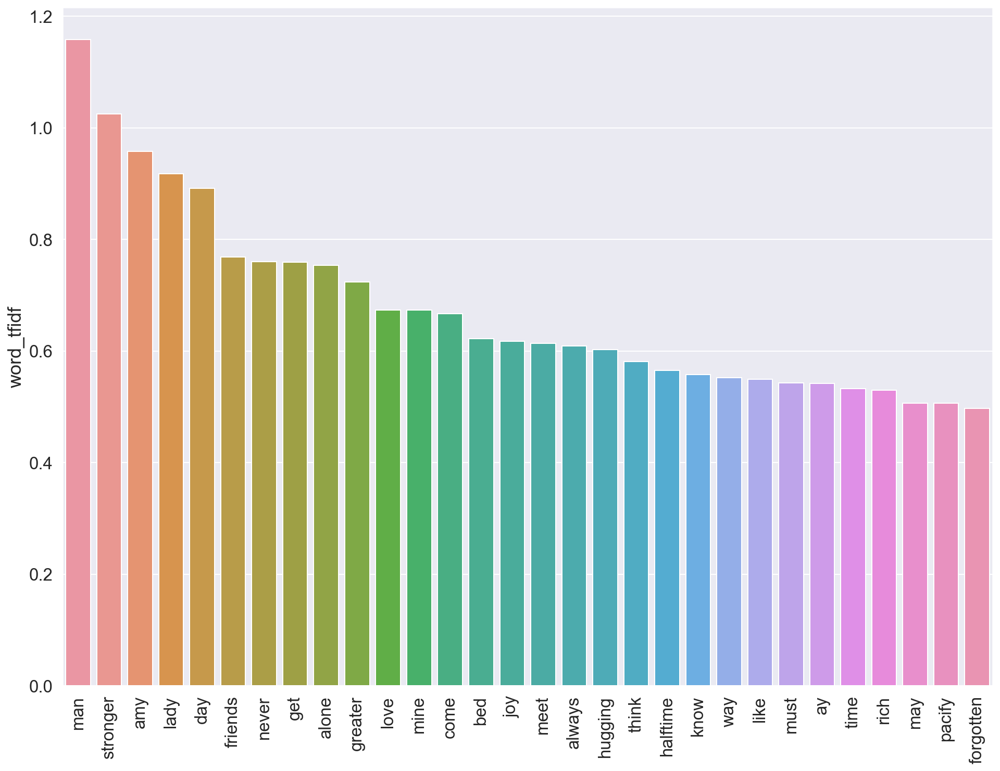

 
Artist: Arctic Monkeys
          word_tfidf
get         1.312485
wanna       1.231744
know        1.165171
like        1.057514
well        0.992821
make        0.948667
thought     0.932398
sure        0.846808
come        0.812161
looks       0.809779
go          0.804192
mine        0.785970
could       0.777323
said        0.774634
us          0.725396
wop         0.724200
time        0.721512
place       0.708445
got         0.700082
back        0.690963
never       0.684265
fun         0.679898
cause       0.666911
shoo        0.657153
woah        0.651011
still       0.650001
wrong       0.633690
serenade    0.618888
though      0.613100
look        0.594854


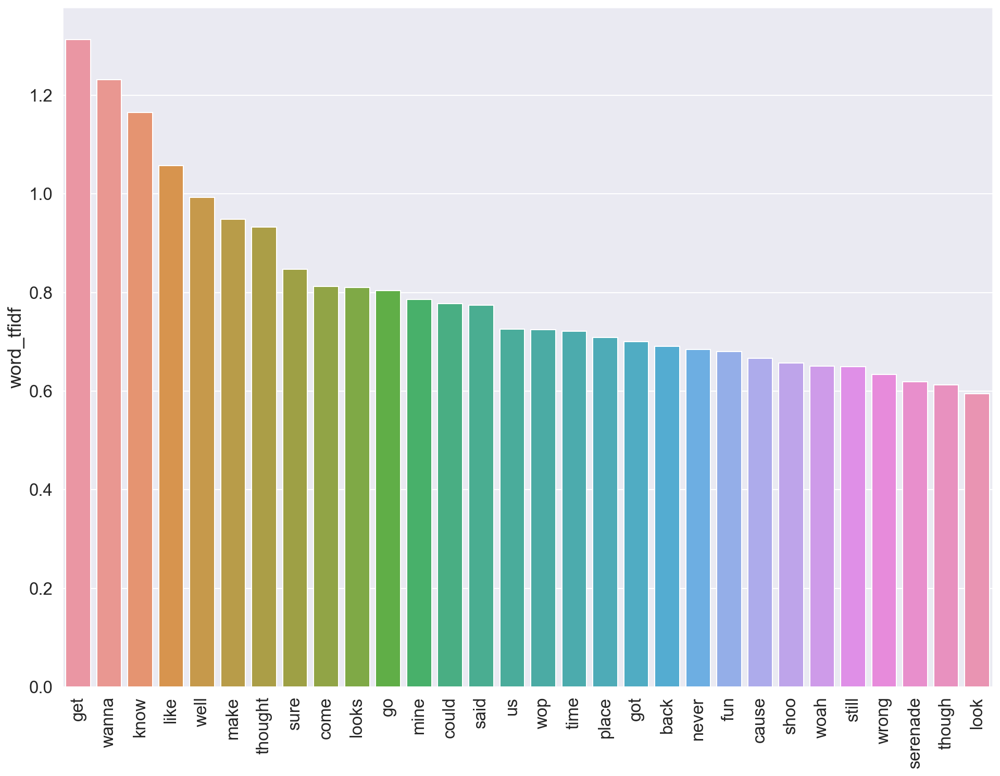

 
Artist: Aretha Franklin
             word_tfidf
baby           1.918630
let            1.510712
right          1.433907
love           1.366228
get            1.355591
send           0.895376
jack           0.839417
serenade       0.773316
thrill         0.771740
step           0.757414
bit            0.728073
walk           0.725543
think          0.718932
freeway        0.704367
midnight       0.666973
see            0.662302
steady         0.657761
load           0.656724
saw            0.652780
moment         0.650648
little         0.640899
thank          0.616025
take           0.600907
til            0.586673
stop           0.568422
daydreaming    0.553161
soul           0.547834
annie          0.547789
wisdom         0.544059
rock           0.541089


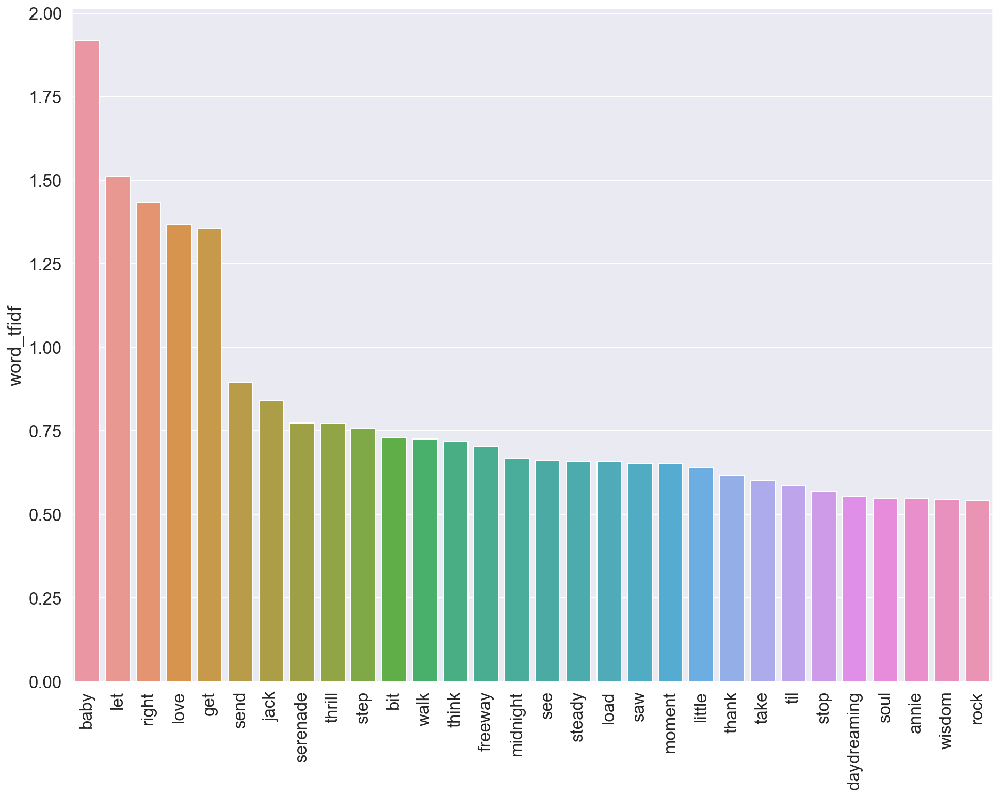

 
Artist: Beach House
           word_tfidf
know         1.897343
like         1.656387
want         1.638152
time         1.432602
comes        1.341902
night        1.213788
go           1.209360
would        1.176104
mind         1.169514
nothing      1.132898
come         1.119583
place        1.110615
love         1.056835
left         1.036872
sun          1.022745
us           1.015685
something    0.987887
happening    0.920189
take         0.854735
eyes         0.851670
say          0.847543
day          0.838086
back         0.835281
tell         0.832272
equal        0.823023
gone         0.813461
takes        0.808107
care         0.807006
dark         0.801611
lose         0.800197


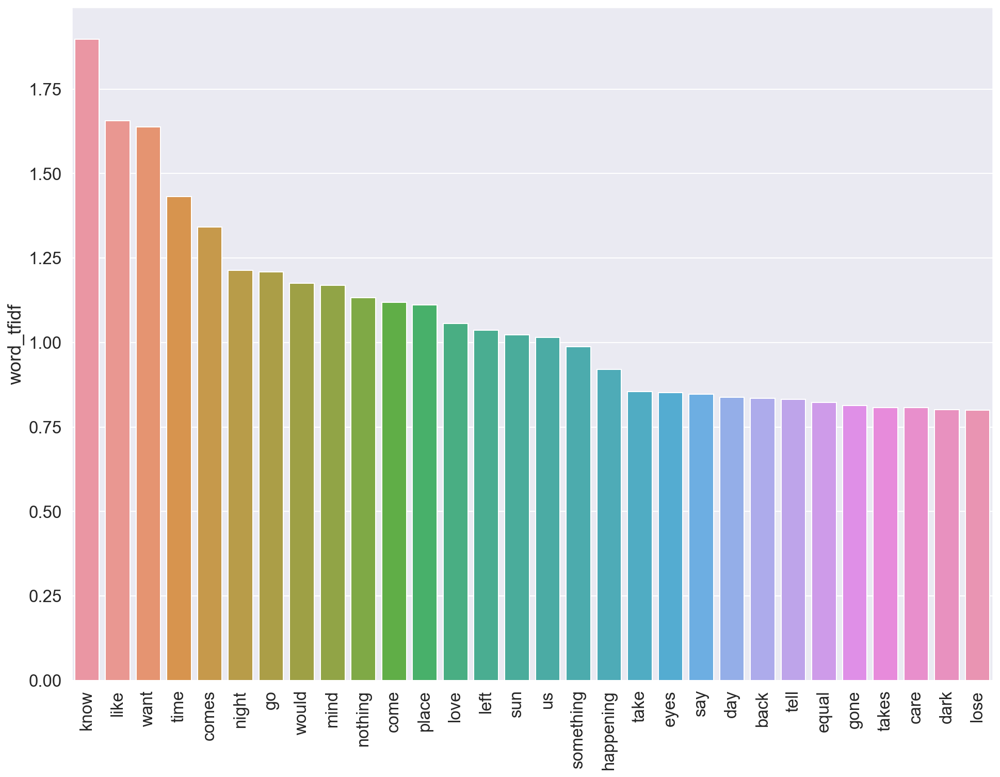

 
Artist: Beyoncé
            word_tfidf
love          3.544279
baby          2.826166
like          2.100128
know          2.079011
got           2.026089
yes           1.785486
girl          1.761687
cause         1.705822
go            1.486700
wanna         1.388033
let           1.327583
care          1.184663
hey           1.176016
boy           1.149464
see           1.140255
could         1.121111
time          1.112240
hello         1.073553
lights        1.070348
good          1.039646
body          1.032071
said          1.030081
daddy         1.020001
without       1.005492
ring          0.993542
halo          0.981454
put           0.972958
everything    0.967335
right         0.967003
much          0.963727


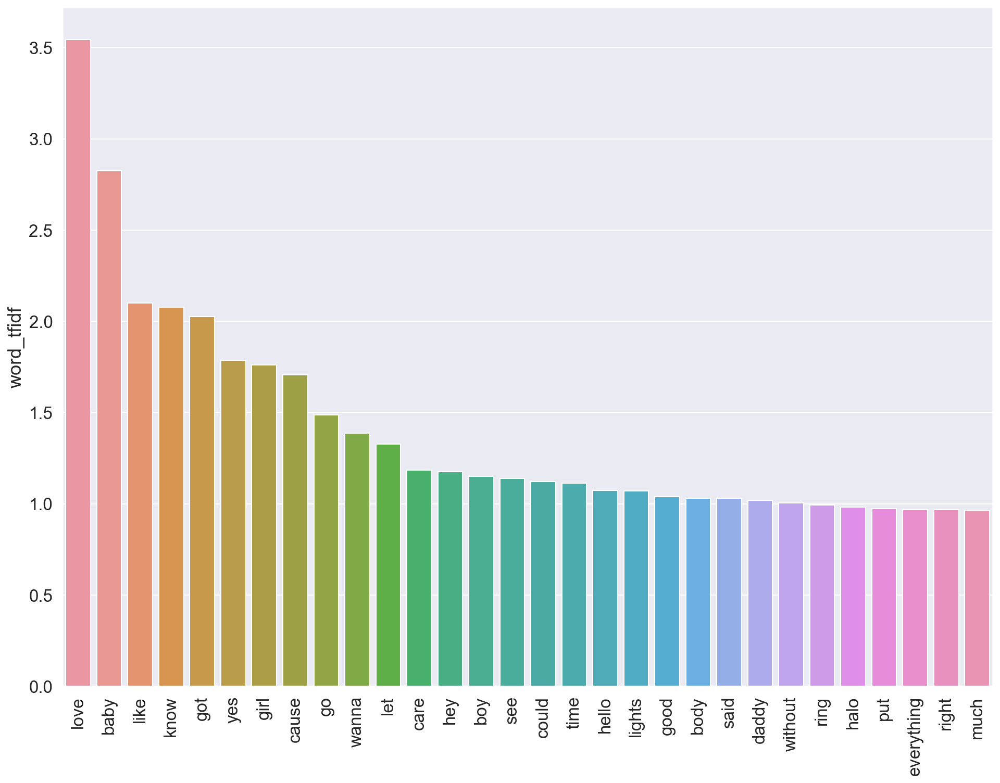

 
Artist: Caribou
              word_tfidf
say             1.241307
love            1.071516
instrumental    1.000000
sun             1.000000
away            0.969752
house           0.803527
tell            0.727455
irene           0.719367
ohh             0.677042
goes            0.664411
ever            0.620926
best            0.578417
leave           0.572736
left            0.521265
melts           0.518091
go              0.476466
sometimes       0.472509
melody          0.442068
jamelia         0.430089
stay            0.415558
looked          0.408347
knows           0.396260
gone            0.361081
people          0.339720
know            0.308752
imagine         0.289271
told            0.282396
smile           0.264574
try             0.262679
treat           0.261870


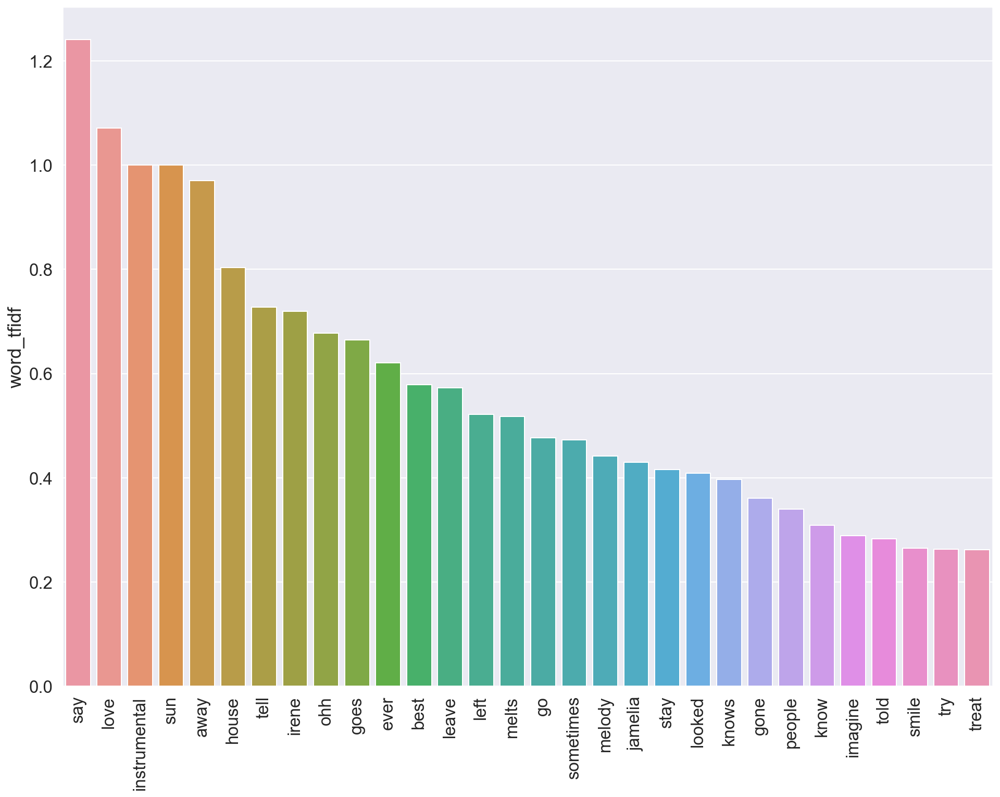

 
Artist: Fall Out Boy
            word_tfidf
beat          1.046787
live          1.011833
remember      0.983653
young         0.975861
love          0.971066
last          0.911125
american      0.910743
like          0.895367
immortals     0.823095
baby          0.818519
mighty        0.778898
boost         0.752904
knees         0.724289
way           0.719534
one           0.704635
champion      0.684494
saturday      0.682207
du            0.671458
benzedrine    0.668407
come          0.649877
tight         0.648926
danced        0.640087
us            0.621927
yesterday     0.584259
sun           0.583618
hallelujah    0.580145
get           0.574079
fall          0.558086
hey           0.557134
know          0.552495


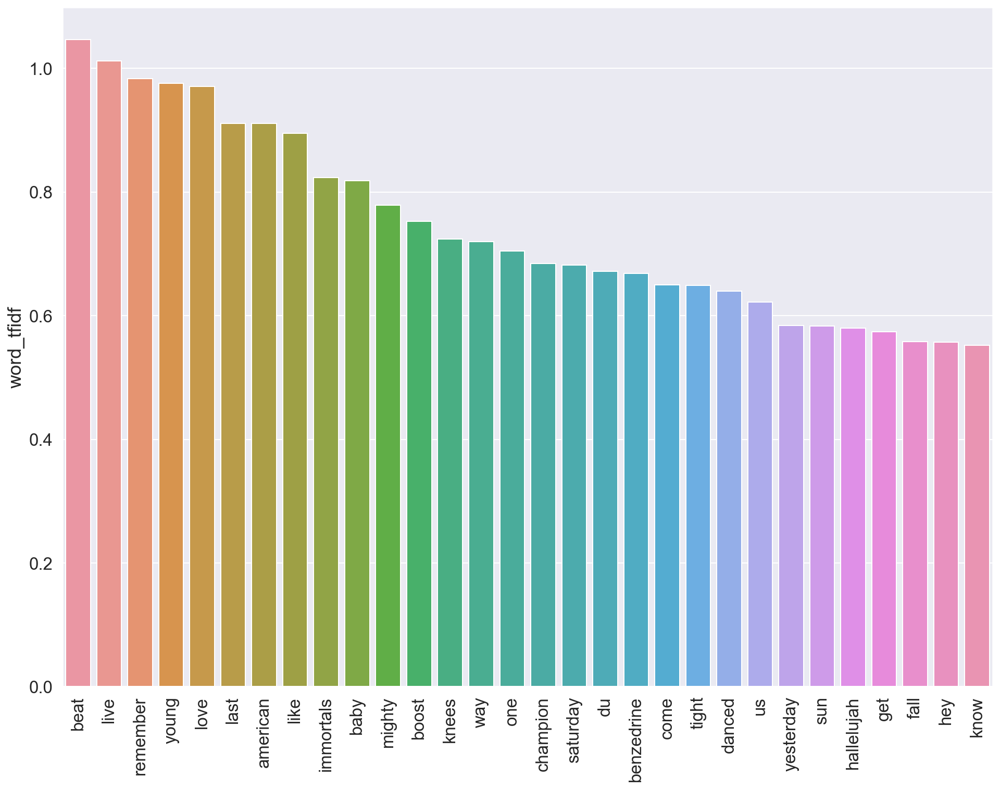

 
Artist: Fleetwood Mac
          word_tfidf
go          0.879399
love        0.865145
hold        0.864963
loving      0.806181
turning     0.741836
got         0.714490
want        0.703686
way         0.681870
tell        0.660484
magic       0.655565
lies        0.650798
rhiannon    0.642214
baby        0.630521
comes       0.548787
gypsy       0.541357
mind        0.540508
head        0.535863
falling     0.518572
maybe       0.497434
woman       0.459098
yes         0.449897
help        0.449602
taken       0.425562
fun         0.420916
world       0.412653
sure        0.405477
another     0.405417
disguise    0.402471
say         0.397482
ever        0.373000


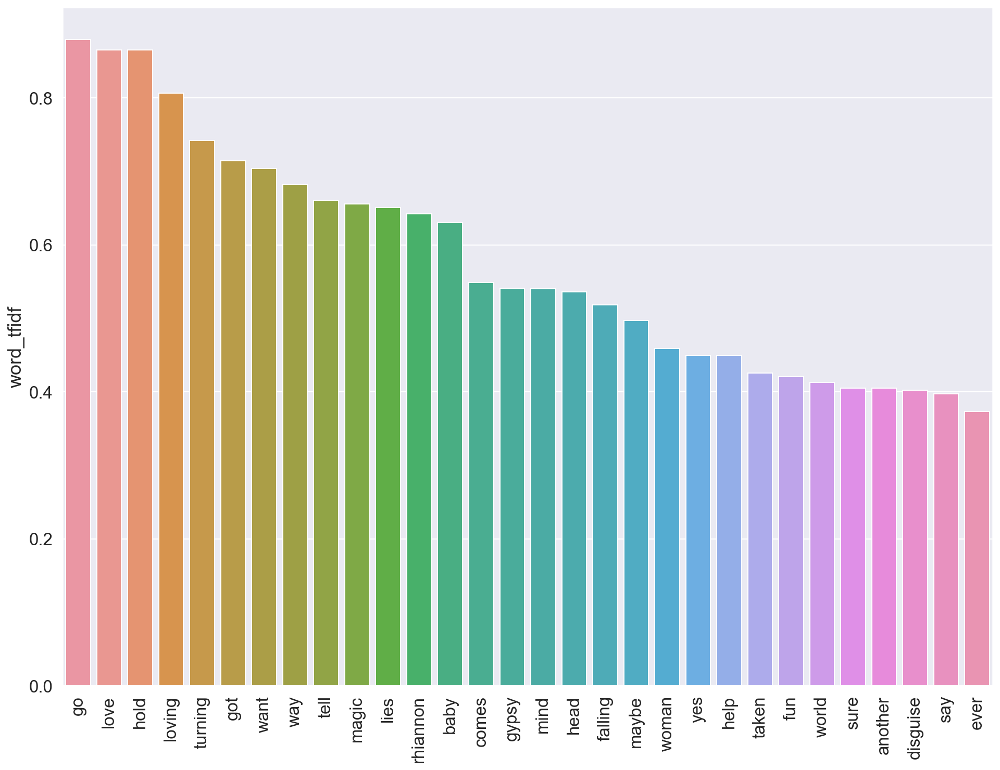

 
Artist: Foo Fighters
           word_tfidf
go           1.716144
come         1.666837
back         1.621846
one          1.497537
say          1.422645
away         1.292013
never        1.152185
die          1.120662
days         1.100589
time         1.024198
alive        0.976049
life         0.929462
word         0.928190
best         0.918372
river        0.914105
another      0.890382
wheels       0.885355
something    0.881472
know         0.873823
run          0.865579
clear        0.864246
let          0.854157
way          0.848500
done         0.841838
dear         0.806710
shame        0.806065
waited       0.793157
times        0.787980
break        0.786916
like         0.779696


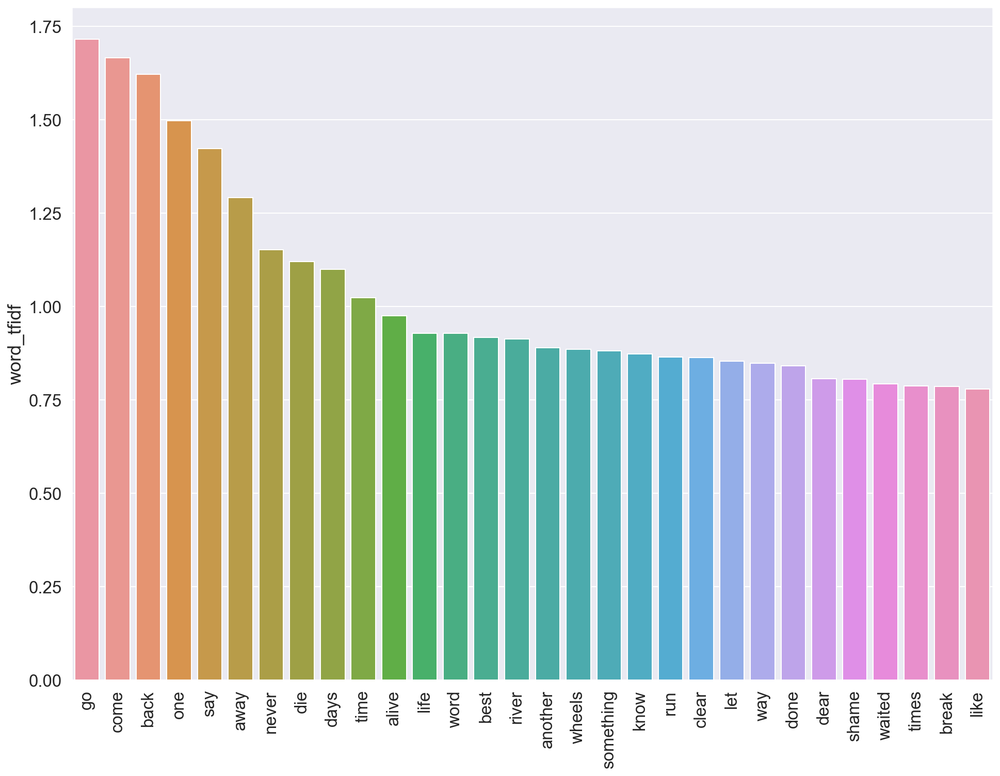

 
Artist: Frank Ocean
            word_tfidf
like          1.157929
know          1.155123
good          1.140788
love          1.132465
life          1.033583
sweet         0.980989
fertilizer    0.947721
got           0.944631
forrest       0.830761
lost          0.786828
could         0.743560
hah           0.730316
swim          0.722632
low           0.712266
pyramid       0.708262
see           0.687886
time          0.674474
nothing       0.667260
feel          0.663024
run           0.648614
pretty        0.628345
us            0.625199
working       0.621313
think         0.618093
thinkin       0.611435
night         0.585516
nigga         0.565018
crack         0.562101
provide       0.551356
facebook      0.549074


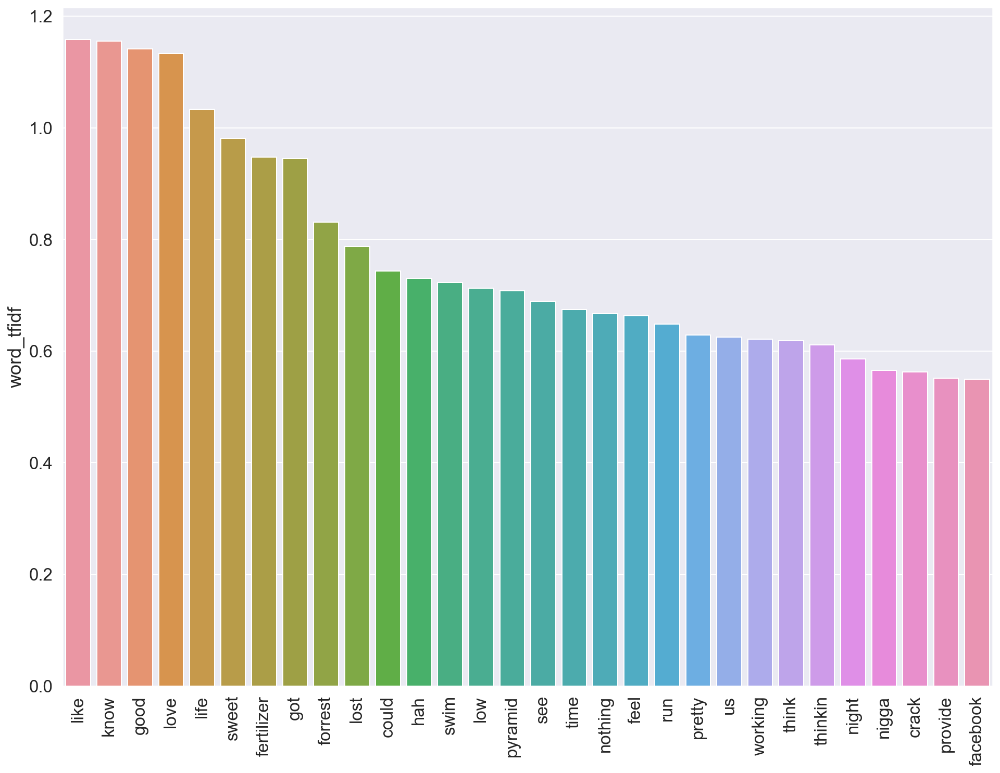

 
Artist: Gorillaz
            word_tfidf
coming        1.448277
gone          1.124699
everybody     1.068999
magic         1.009034
alone         1.000745
find          0.960492
ay            0.905999
stop          0.872026
think         0.860047
love          0.853379
got           0.850052
loneliness    0.829899
starshine     0.829483
broken        0.825004
day           0.808417
dracula       0.801444
gonna         0.796505
time          0.783182
money         0.773828
get           0.767906
inner         0.758632
long          0.730703
world         0.722808
bump          0.719031
push          0.718404
white         0.698064
like          0.697774
lost          0.684377
vision        0.679568
door          0.668875


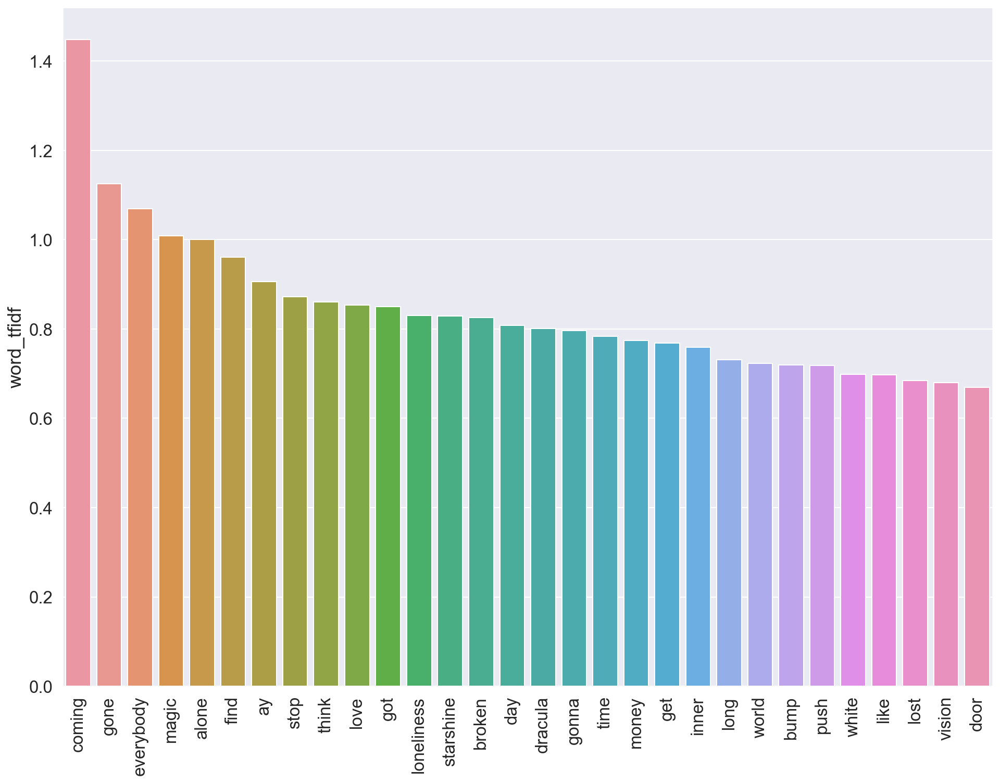

 
Artist: HAIM
            word_tfidf
never         1.153332
know          0.984897
falling       0.875505
tried         0.841425
say           0.831272
love          0.828961
saying        0.797256
right         0.770548
goodbye       0.729227
want          0.670532
honey         0.636603
forever       0.556153
mind          0.554232
friend        0.548540
back          0.543712
give          0.529774
knew          0.517803
fumbled       0.515320
guess         0.514735
lover         0.507843
take          0.485460
gave          0.475352
felt          0.458501
wire          0.452252
good          0.449207
need          0.445413
loneliness    0.408831
long          0.394985
visions       0.366310
fault         0.350101


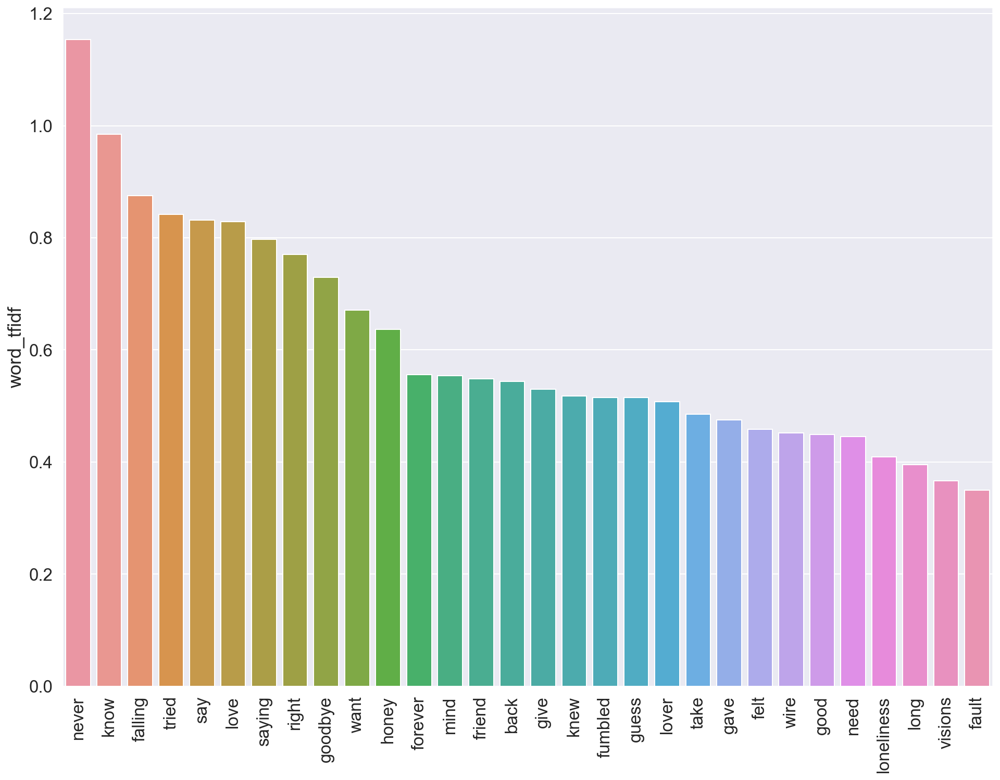

 
Artist: John Legend
            word_tfidf
love          3.972882
know          2.786905
go            2.368285
heaven        1.852796
let           1.756387
time          1.679940
alright       1.610981
wanna         1.603576
like          1.373514
one           1.326492
baby          1.294522
tonight       1.244748
nobody        1.191864
stay          1.152658
try           1.133278
come          1.126838
think         1.117526
make          1.108879
dream         1.069824
want          1.016295
take          1.014586
loved         0.998954
give          0.996261
stars         0.965551
night         0.950582
need          0.933131
save          0.924943
crazy         0.872696
gonna         0.857679
snowflakes    0.852927


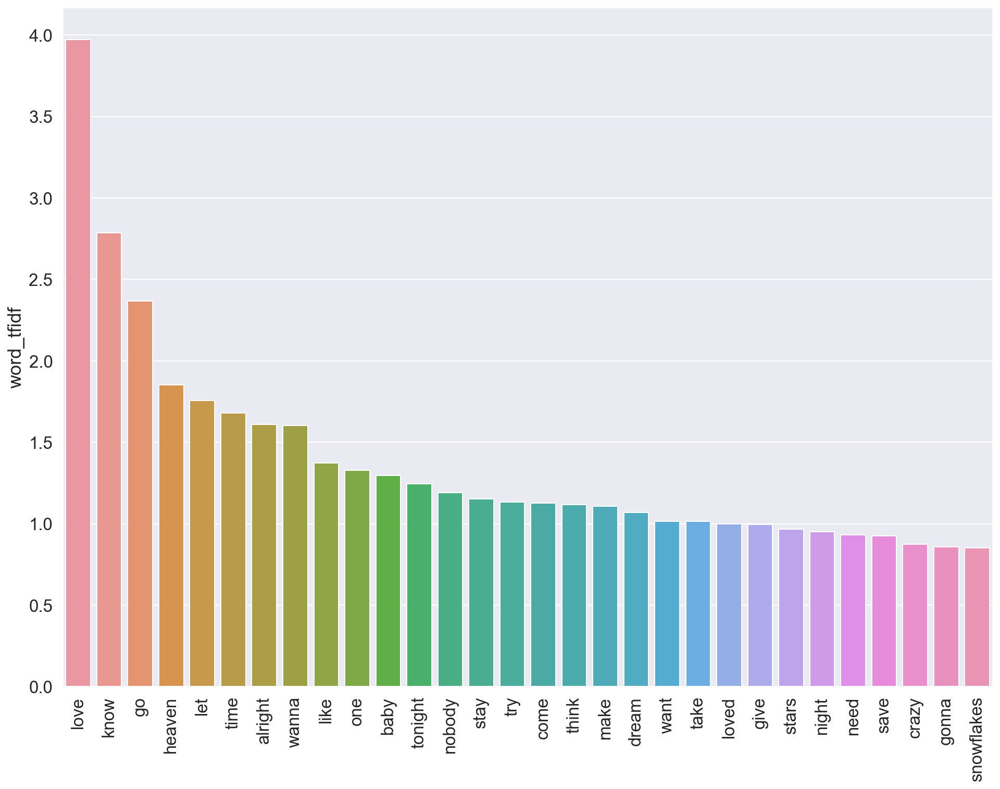

 
Artist: Kendrick Lamar
         word_tfidf
nigga      1.912631
like       1.665467
feel       1.498912
bitch      1.268646
king       1.180419
gon        1.171335
know       1.168329
love       1.164636
got        1.133830
shit       1.124490
hol        1.042918
get        1.035875
life       1.025516
yah        1.018185
alright    0.980547
one        0.949298
dna        0.917742
real       0.891908
zoom       0.850961
make       0.849512
walls      0.805897
niggas     0.795483
people     0.787866
ho         0.787582
vibe       0.778638
ass        0.776563
funk       0.755604
damn       0.750657
two        0.749425
going      0.730222


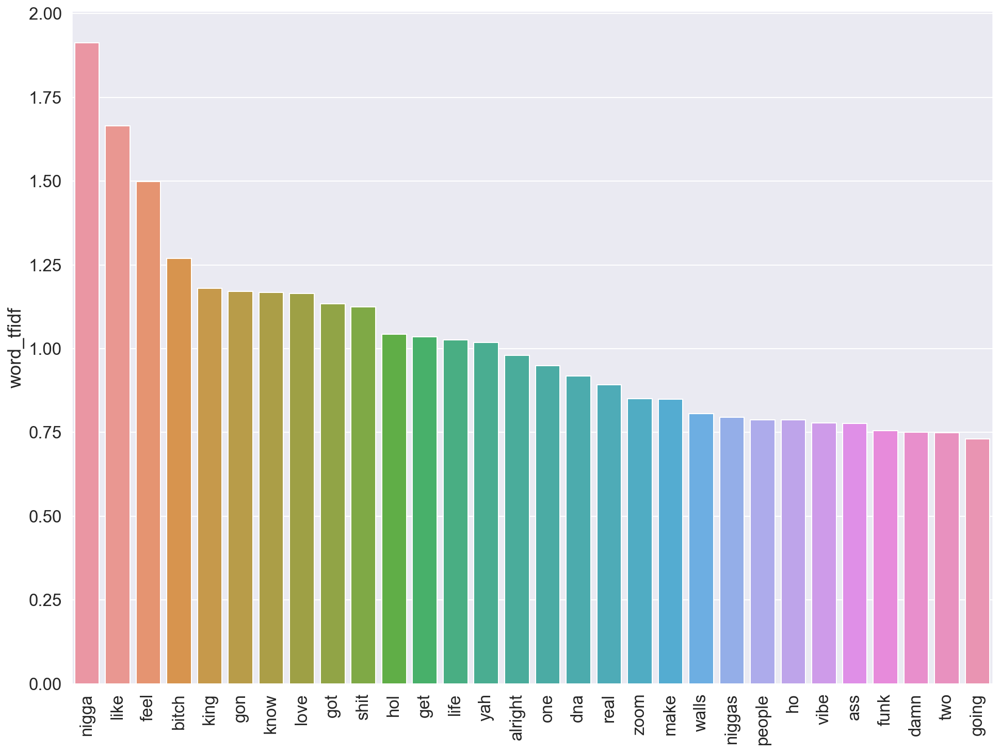

 
Artist: Kings of Leon
           word_tfidf
going        1.970943
say          1.643126
away         1.576287
go           1.495944
way          1.487630
know         1.312596
like         1.240594
got          1.222990
take         1.180559
something    1.178612
see          1.170270
one          1.168661
back         1.101725
gonna        1.097462
shake        1.055859
want         1.041782
come         1.036619
get          1.014569
walk         0.995683
roll         0.977863
knock        0.966649
somebody     0.943849
face         0.934928
friend       0.924256
heart        0.912379
could        0.884640
haa          0.868652
times        0.847780
wait         0.847545
home         0.840688


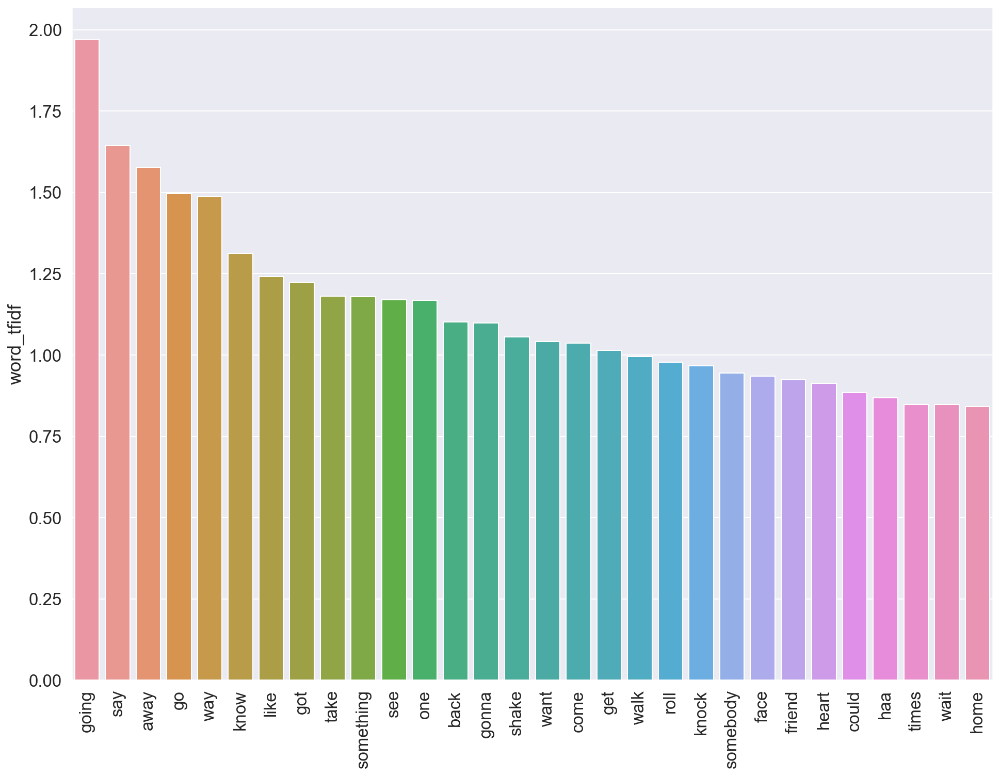

 
Artist: Korn
          word_tfidf
life        1.482372
inside      1.396444
twist       1.081510
never       1.052420
away        0.992907
body        0.905739
hate        0.881168
music       0.872719
got         0.858816
beg         0.828932
fucking     0.805254
take        0.786499
gonna       0.783837
give        0.782549
shut        0.761397
wall        0.759474
bring       0.756296
pain        0.748116
feel        0.734627
cannot      0.712449
somebody    0.708390
fuck        0.692295
tongue      0.666318
word        0.665670
liar        0.660424
ever        0.609120
please      0.608477
insane      0.605646
throw       0.602505
bodies      0.594551


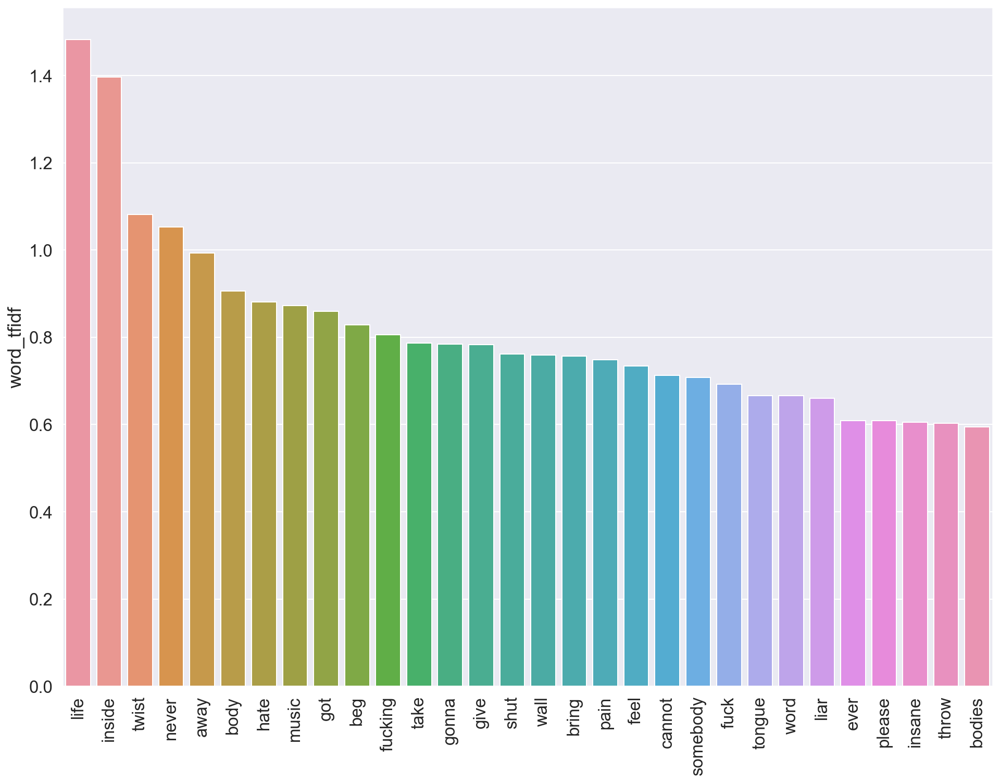

 
Artist: LCD Soundsystem
            word_tfidf
want          1.198131
time          1.101597
home          0.946466
come          0.939796
drunk         0.936123
change        0.909664
coming        0.842530
people        0.839239
north         0.794004
terrible      0.754413
normalize     0.748528
still         0.670729
make          0.668244
great         0.667949
never         0.666499
like          0.658925
undone        0.640096
discovery     0.627364
repeat        0.616738
love          0.606519
discipline    0.597002
thrills       0.594811
everybody     0.592529
comes         0.586235
keeps         0.572471
stop          0.566938
connection    0.558585
touch         0.558313
things        0.557978
without       0.550671


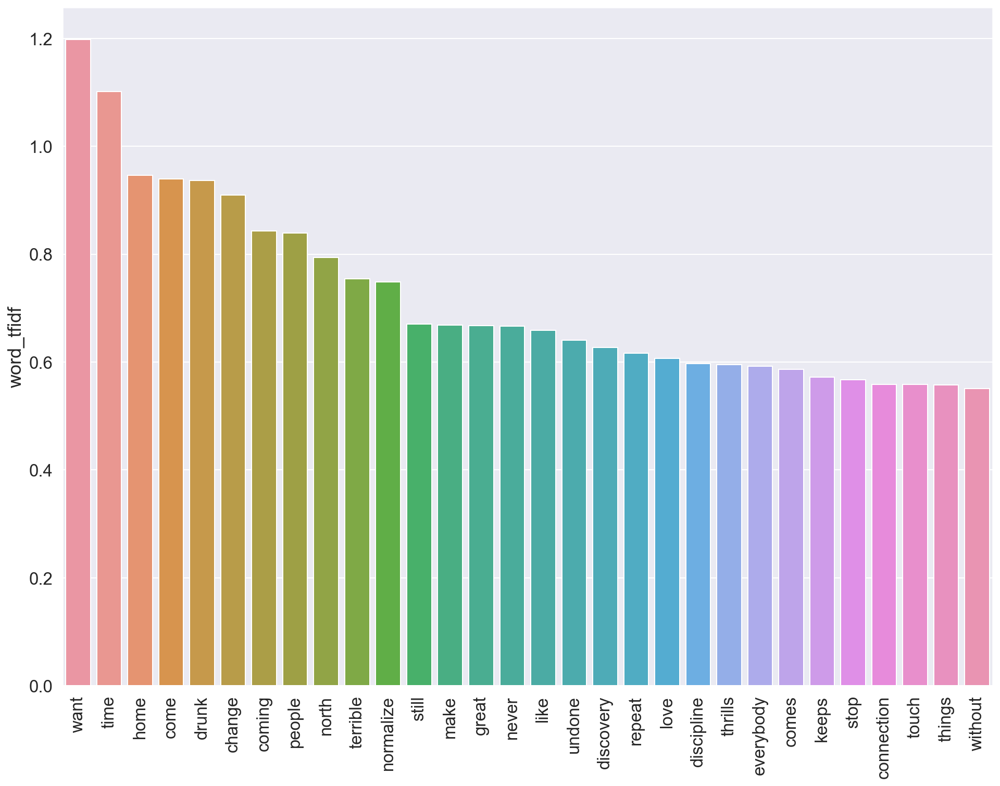

 
Artist: Lady Gaga
           word_tfidf
love         2.209278
baby         2.152653
want         1.643907
hey          1.575051
could        1.530402
hair         1.526921
dance        1.456817
wanna        1.407800
cause        1.346922
body         1.309658
heart        1.304714
touch        1.296058
girl         1.290456
know         1.289763
got          1.138472
hoo          1.135531
fame         1.129734
bad          1.053767
way          1.043097
gaga         0.997491
good         0.995410
gypsy        0.931453
heal         0.923881
gonna        0.911228
like         0.903046
rough        0.886266
ahhh         0.877328
alejandro    0.874131
brown        0.844028
lover        0.842756


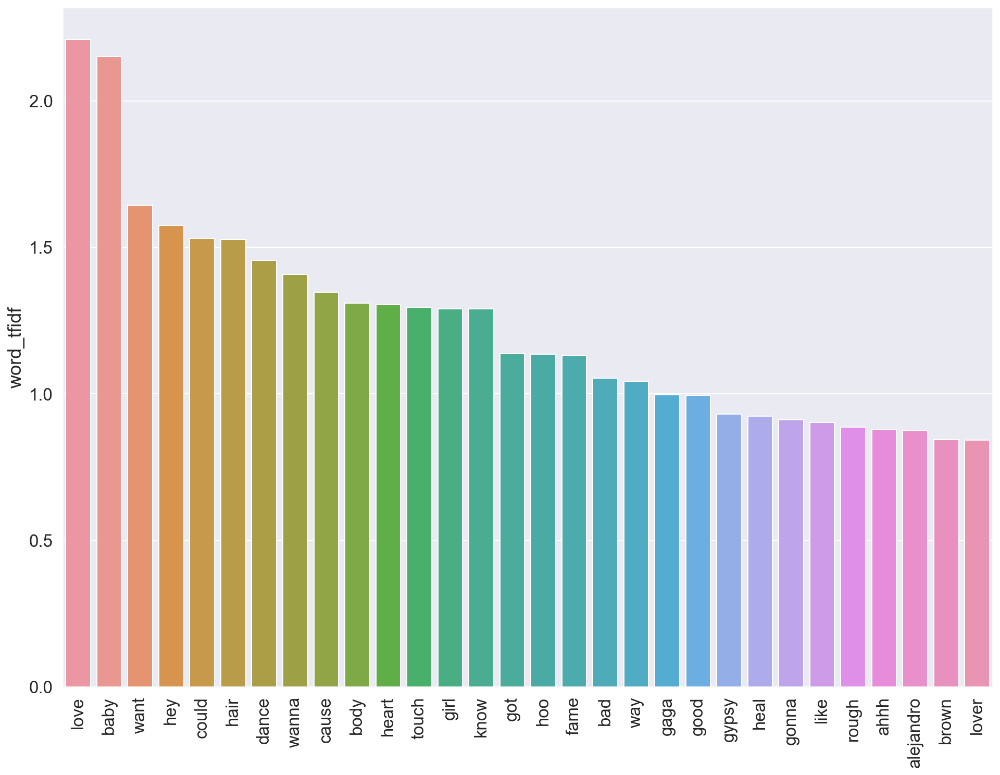

 
Artist: Led Zeppelin
         word_tfidf
baby       1.322955
lonely     0.777573
sliding    0.767759
let        0.740561
light      0.735054
darling    0.721769
people     0.703586
jesus      0.695591
know       0.678718
woman      0.637758
many       0.635061
hey        0.634744
long       0.620462
join       0.609661
singing    0.587523
custard    0.564496
time       0.536253
going      0.505573
turned     0.505537
away       0.497782
see        0.489844
mama       0.487031
way        0.476043
never      0.472615
grow       0.469527
could      0.465940
nana       0.460081
gonna      0.450584
take       0.431724
pie        0.423367


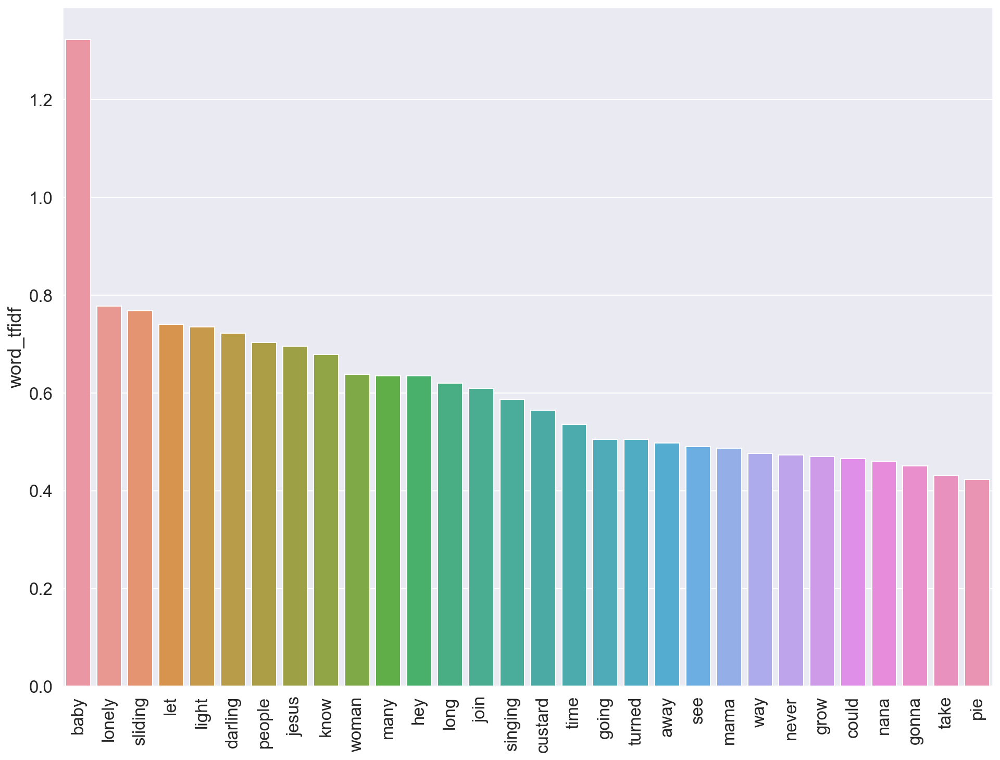

 
Artist: Lil Wayne
         word_tfidf
nigga      4.677427
like       3.164525
bitch      3.063796
niggas     2.661245
got        2.526204
fuck       2.262888
shit       2.115050
weezy      1.910412
ya         1.774020
carter     1.755198
bitches    1.735608
get        1.702069
know       1.565206
money      1.543484
young      1.299870
see        1.280880
ass        1.238740
tunechi    1.208356
pussy      1.195171
love       1.191209
right      1.190411
call       1.187624
tell       1.168204
let        1.145973
go         1.077006
make       1.056593
gun        1.034503
lil        1.015129
baby       1.009448
cause      0.949603


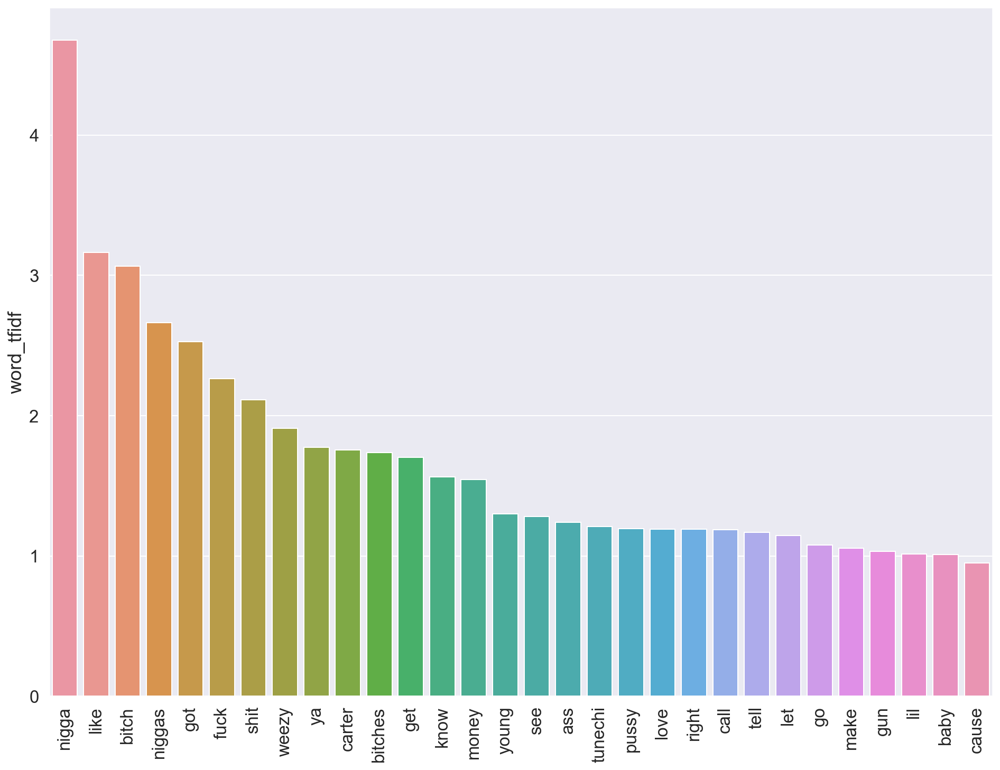

 
Artist: Linkin Park
            word_tfidf
away          2.906964
like          1.883776
one           1.849880
let           1.723800
go            1.721946
someone       1.388305
know          1.351349
see           1.301428
back          1.266914
want          1.154163
never         1.126805
take          1.092921
alone         1.082927
inside        1.079025
say           1.057959
everything    1.057601
invisible     1.046159
things        1.035689
time          1.007229
skin          0.995902
end           0.987691
become        0.942638
way           0.915993
right         0.866645
even          0.862416
lies          0.861312
try           0.856180
far           0.847736
find          0.834322
learned       0.815239


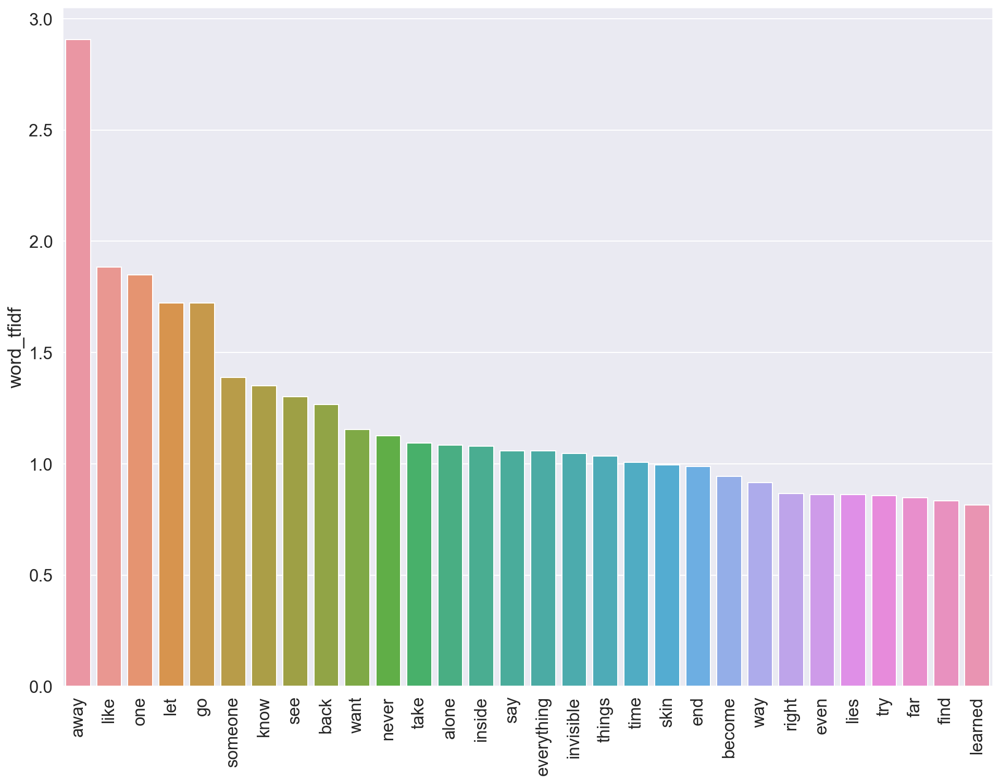

 
Artist: Mac Miller
        word_tfidf
get       3.712542
like      3.513019
shit      3.016947
fuck      2.964353
got       2.726701
go        2.368744
world     2.117190
know      2.094973
mind      2.011519
high      1.992105
money     1.971551
love      1.955370
keep      1.824556
need      1.808984
life      1.808392
let       1.793898
gon       1.777589
gettin    1.703444
little    1.693519
never     1.688791
bitch     1.678642
til       1.630084
one       1.603653
wanna     1.590755
back      1.586408
lookin    1.567380
night     1.540683
tryna     1.539245
wake      1.502747
right     1.478105


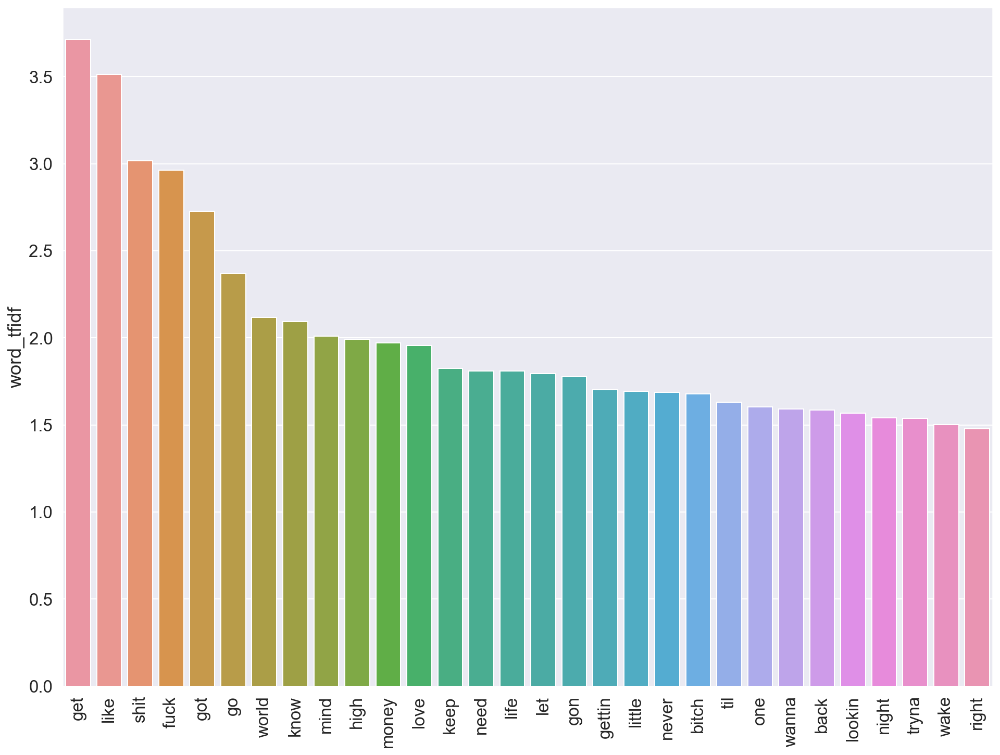

 
Artist: Metallica
            word_tfidf
never         1.306289
hey           0.985310
sleeps        0.805270
gone          0.759343
unforgiven    0.736998
anger         0.688839
forgive       0.650545
pain          0.625738
fame          0.617249
holier        0.617078
destruct      0.599234
cared         0.578398
known         0.548531
open          0.539265
light         0.524691
thou          0.513825
one           0.508365
felt          0.505847
crown         0.490710
self          0.485298
nothing       0.476729
sad           0.468415
matters       0.460824
thee          0.459155
dub           0.444074
wish          0.434796
true          0.426627
flush         0.404171
vain          0.401222
ash           0.394496


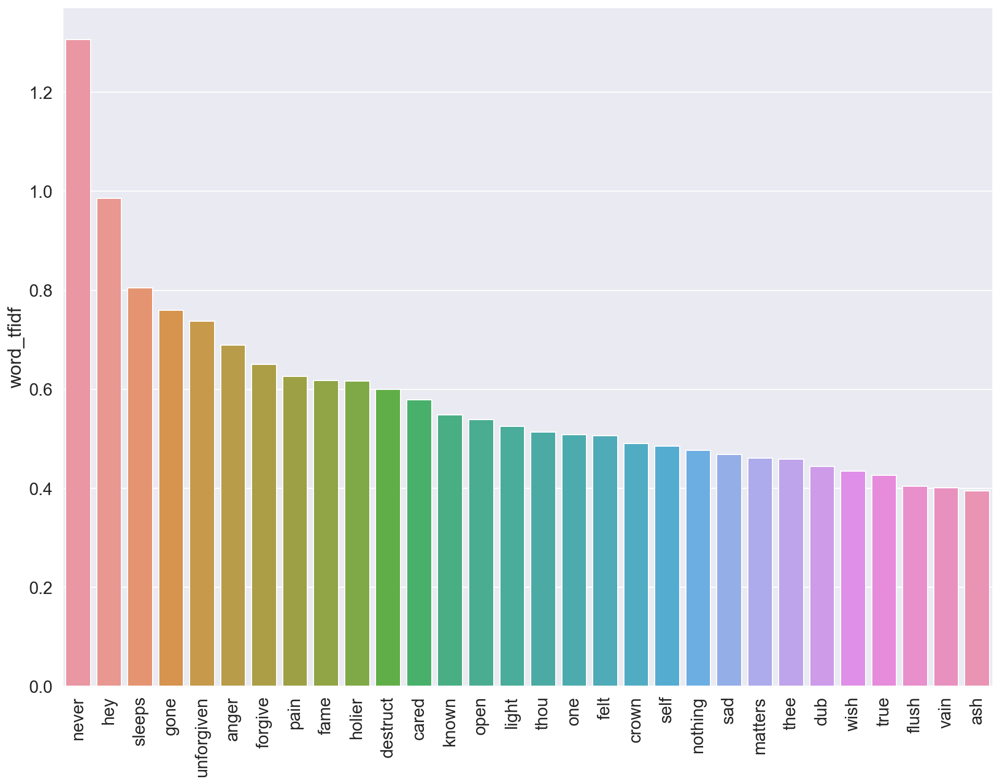

 
Artist: Nirvana
            word_tfidf
away          1.268653
way           0.986487
rape          0.971317
memoria       0.897455
hello         0.885144
grandma       0.848317
crack         0.771186
stay          0.741993
mmm           0.719888
go            0.671609
take          0.659872
find          0.632851
care          0.621611
laundry       0.620757
wing          0.619824
mother        0.603589
said          0.593660
sun           0.581873
happy         0.577654
smell         0.573680
meat          0.542562
advice        0.519698
pennyroyal    0.519126
home          0.468224
sky           0.457372
else          0.455694
wait          0.452489
afraid        0.447731
like          0.431421
buried        0.426521


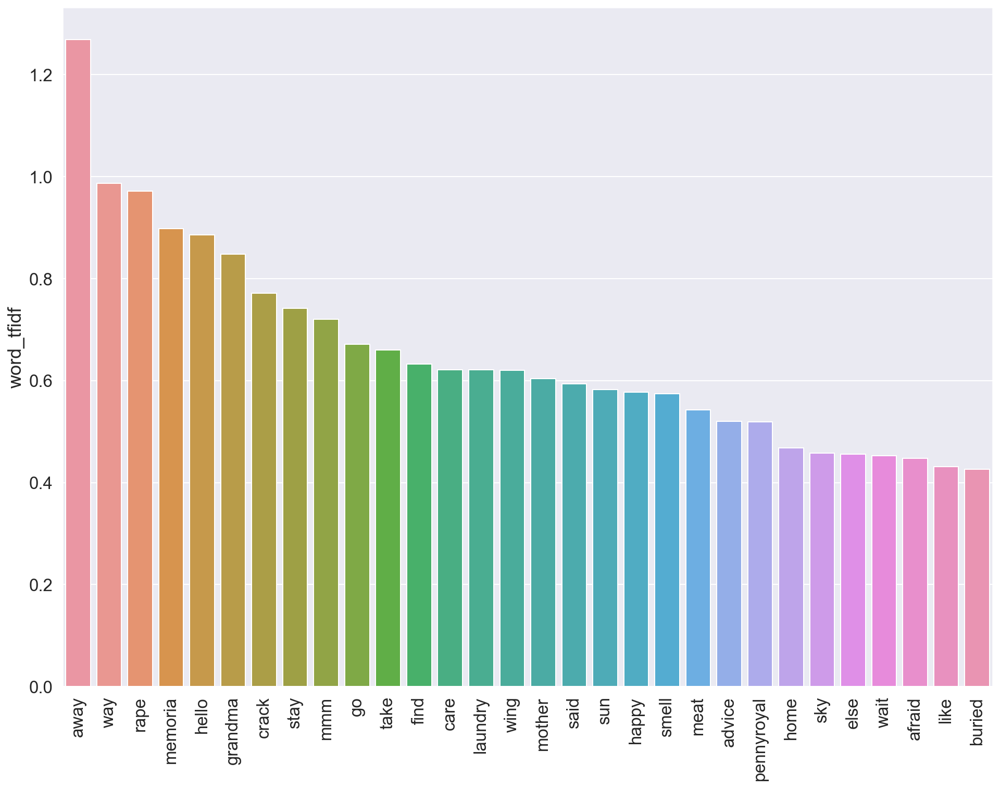

 
Artist: Passion Pit
            word_tfidf
go            1.060526
higher        1.005443
ever          0.990051
walk          0.825591
sorry         0.812288
let           0.803571
things        0.765974
take          0.676294
design        0.662624
impossible    0.638109
never         0.593385
alright       0.569537
oiche         0.542546
fheil         0.542546
love          0.519848
another       0.503928
carried       0.496305
like          0.492289
comes         0.487654
darling       0.480486
means         0.479013
make          0.471991
way           0.466773
think         0.428903
get           0.426640
eoin          0.421980
singing       0.410791
one           0.408372
away          0.406848
tall          0.404241


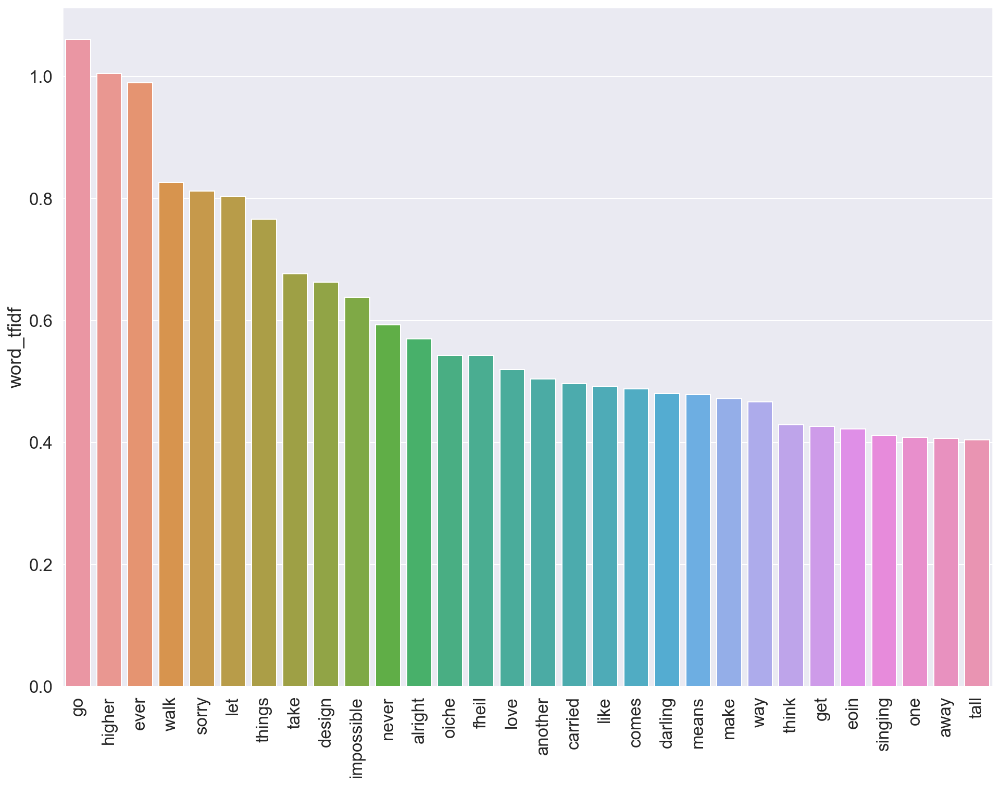

 
Artist: Radiohead
             word_tfidf
lost           1.206670
nothing        1.145750
one            1.065737
get            0.999201
children       0.979459
round          0.977862
walking        0.939156
else           0.916908
wrong          0.916597
come           0.911674
wears          0.871062
end            0.867711
rain           0.851741
light          0.814118
mess           0.801243
slow           0.794781
best           0.782219
bulletproof    0.778102
let            0.772037
like           0.768328
enough         0.758977
paying         0.747767
hanging        0.721205
want           0.720826
standing       0.719522
first          0.708997
surprises      0.694626
blame          0.689310
ready          0.688697
back           0.687989


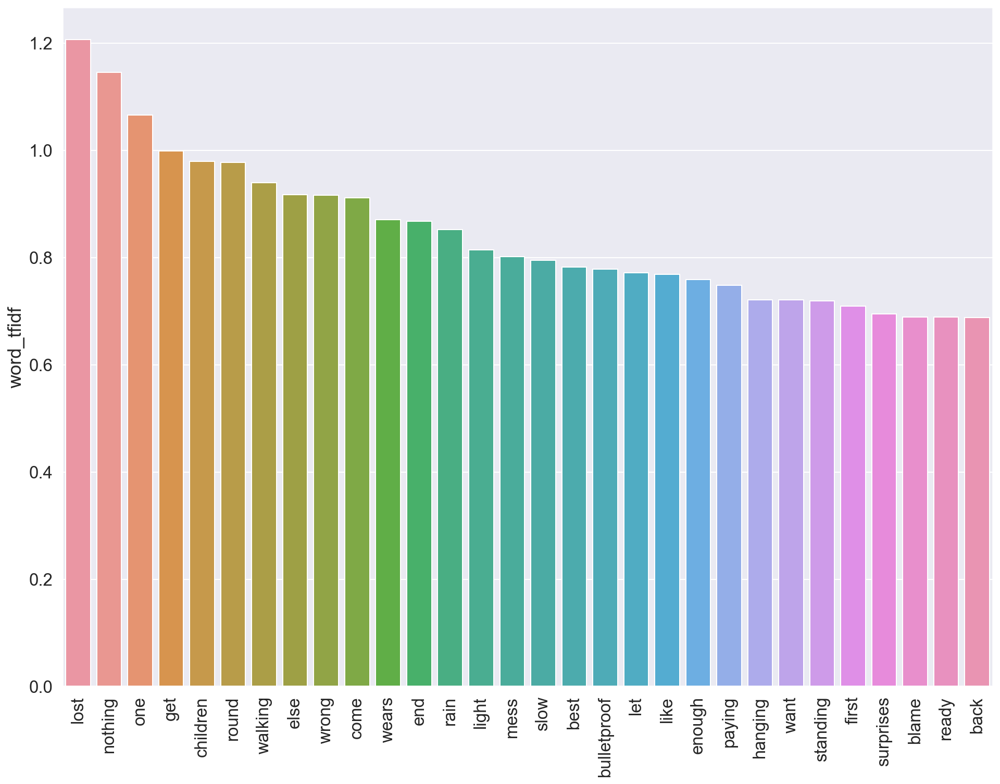

 
Artist: Red Hot Chili Peppers
            word_tfidf
take          2.010070
know          1.833894
get           1.684565
love          1.575286
girl          1.553152
never         1.510491
could         1.489326
got           1.460921
hey           1.426665
want          1.337667
come          1.300766
make          1.287904
go            1.264224
say           1.263924
little        1.227465
time          1.204280
another       1.162995
around        1.138072
way           1.137079
lonely        1.135388
like          1.067324
please        1.035969
mind          1.035300
away          1.031645
better        0.998855
one           0.994740
california    0.972826
ayo           0.957143
readymade     0.943047
life          0.938605


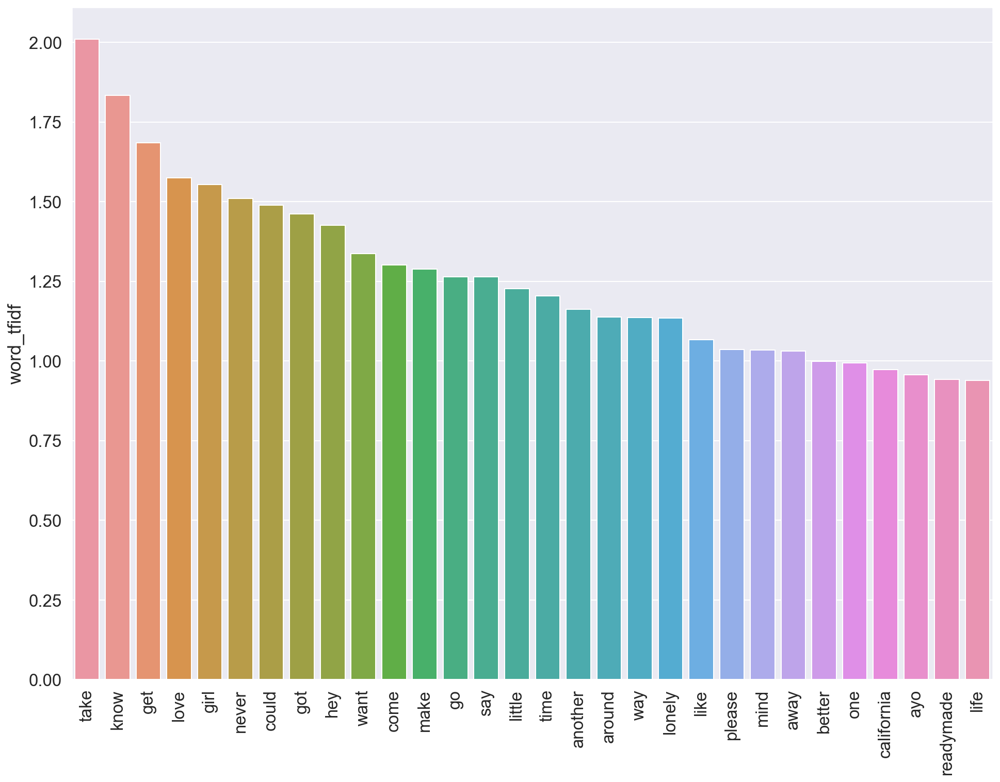

 
Artist: Rihanna
         word_tfidf
love       3.872177
like       2.050047
know       1.894389
boy        1.861503
baby       1.799527
wanna      1.701889
night      1.462238
ya         1.328591
feeling    1.311541
feel       1.311502
let        1.283808
got        1.277583
said       1.264277
hard       1.238865
take       1.230362
cause      1.227631
want       1.204636
one        1.143971
bitch      1.127962
come       1.057931
talk       1.039310
babe       1.033896
go         1.016458
jump       0.982319
get        0.972913
see        0.962369
work       0.957918
need       0.946716
way        0.917138
pum        0.913856


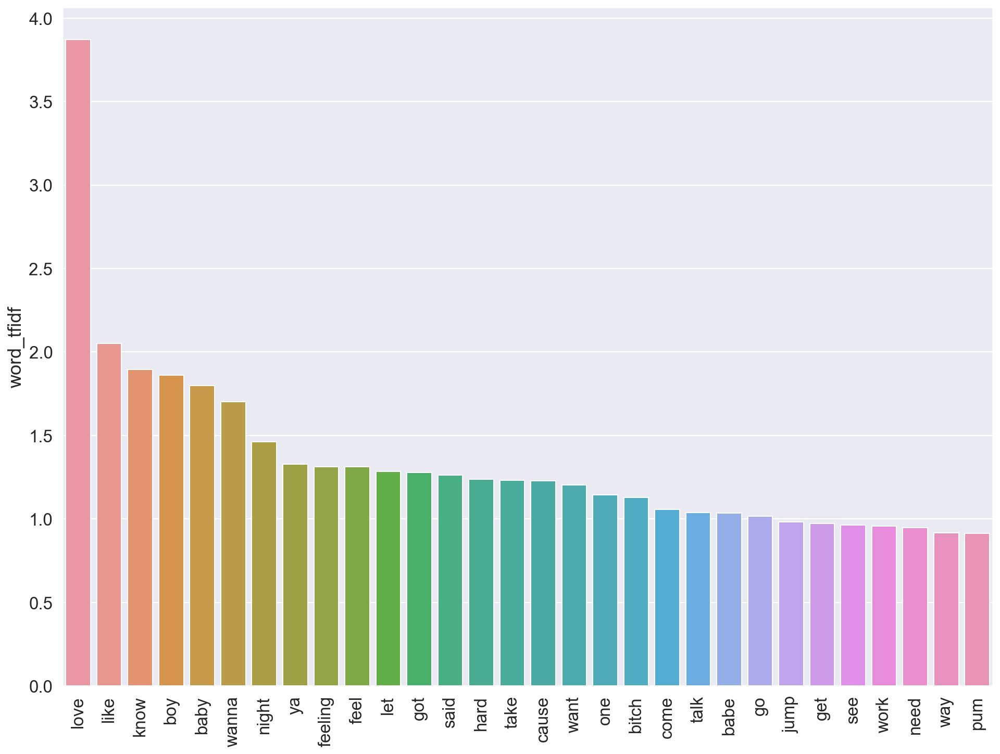

 
Artist: Slipknot
            word_tfidf
fuck          2.104468
inside        2.060355
never         2.007455
life          1.871238
know          1.801178
fucking       1.720910
die           1.691948
everything    1.511548
one           1.476808
kill          1.472007
build         1.440594
let           1.353238
dead          1.350225
save          1.243870
get           1.238394
world         1.200713
shit          1.193674
way           1.152001
gods          1.132914
give          1.127609
cities        1.076455
wanna         1.059439
see           1.036709
kind          0.983581
nothing       0.982696
like          0.935375
end           0.926287
burn          0.911668
want          0.897190
sick          0.886925


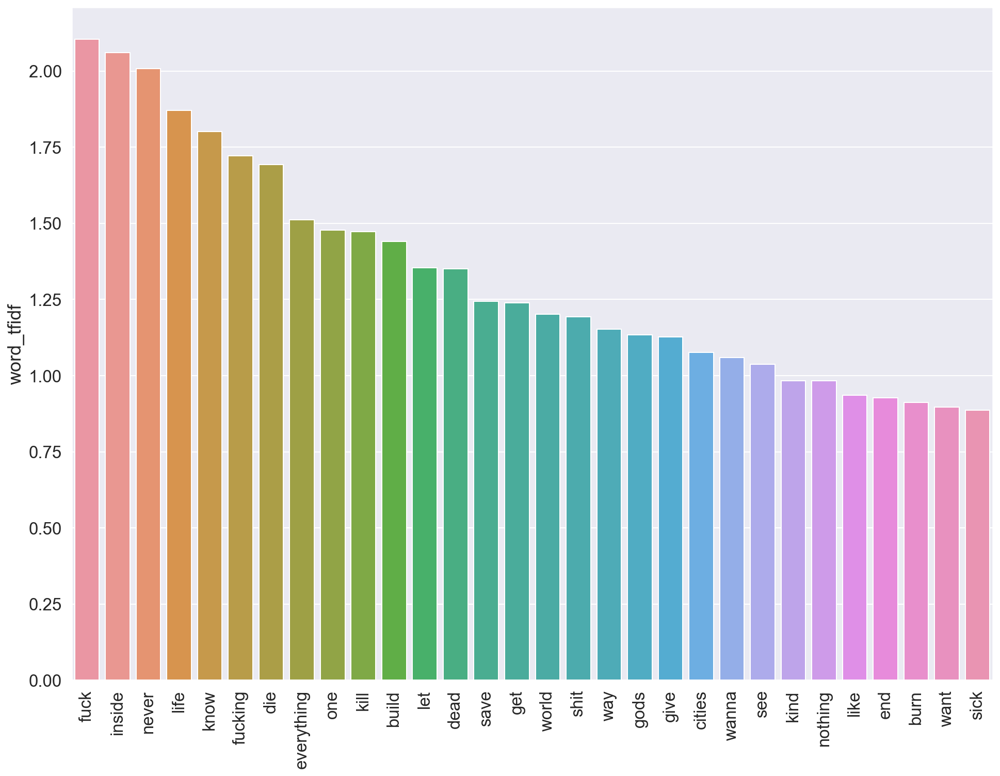

 
Artist: System Of A Down
               word_tfidf
hollywood        1.200790
around           1.177042
us               1.109168
die              1.065032
feel             1.061457
pogo             0.994865
boom             0.955744
people           0.926716
life             0.904716
car              0.904340
pictures         0.898032
away             0.882593
eat              0.871256
hey              0.848967
everybody        0.843570
mind             0.810083
tapeworm         0.807667
day              0.797825
motherfucking    0.780376
waiting          0.770340
poor             0.766163
right            0.762729
disorder         0.753636
unrealized       0.748140
sitting          0.733708
know             0.732655
innervision      0.731200
go               0.729789
world            0.692931
loneliest        0.677926


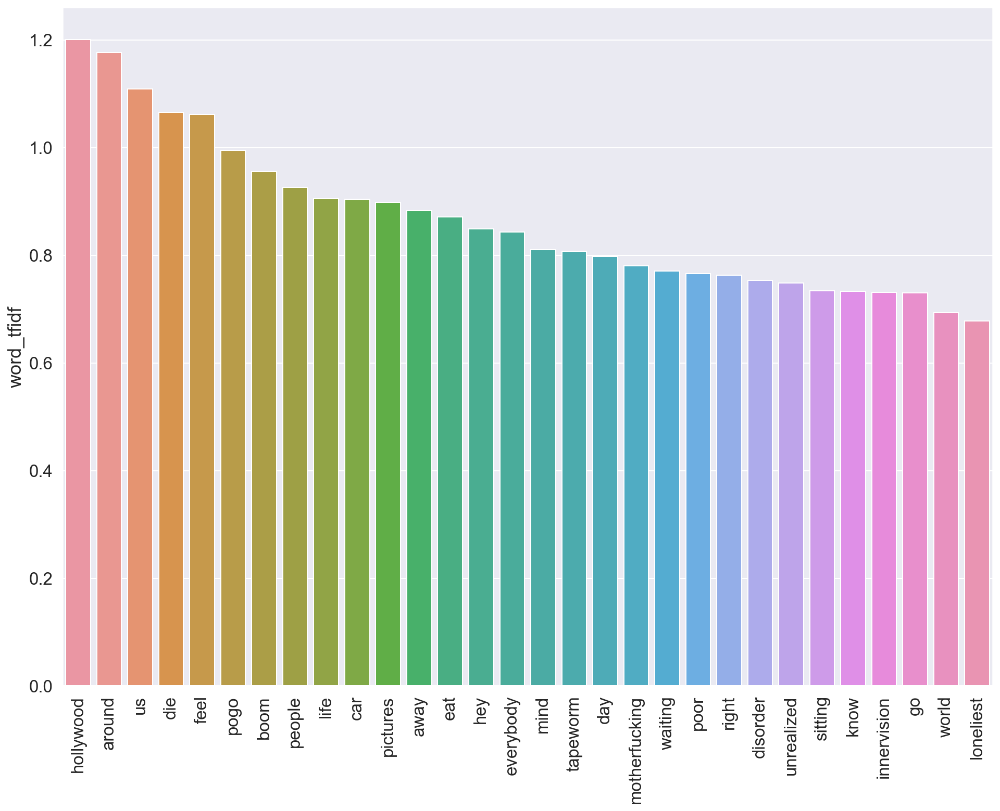

 
Artist: Tame Impala
            word_tfidf
something     1.335563
know          1.270251
like          1.122848
eventually    0.995297
feels         0.937958
go            0.830268
could         0.791555
life          0.779005
happen        0.746924
day           0.719505
long          0.696154
hard          0.677437
end           0.658383
one           0.651756
feel          0.651052
close         0.650963
ready         0.640054
past          0.638435
really        0.617207
nothing       0.610064
hell          0.609049
time          0.608324
never         0.605520
maybe         0.598624
backwards     0.563674
come          0.530874
get           0.528630
real          0.526834
honesty       0.513174
guess         0.510305


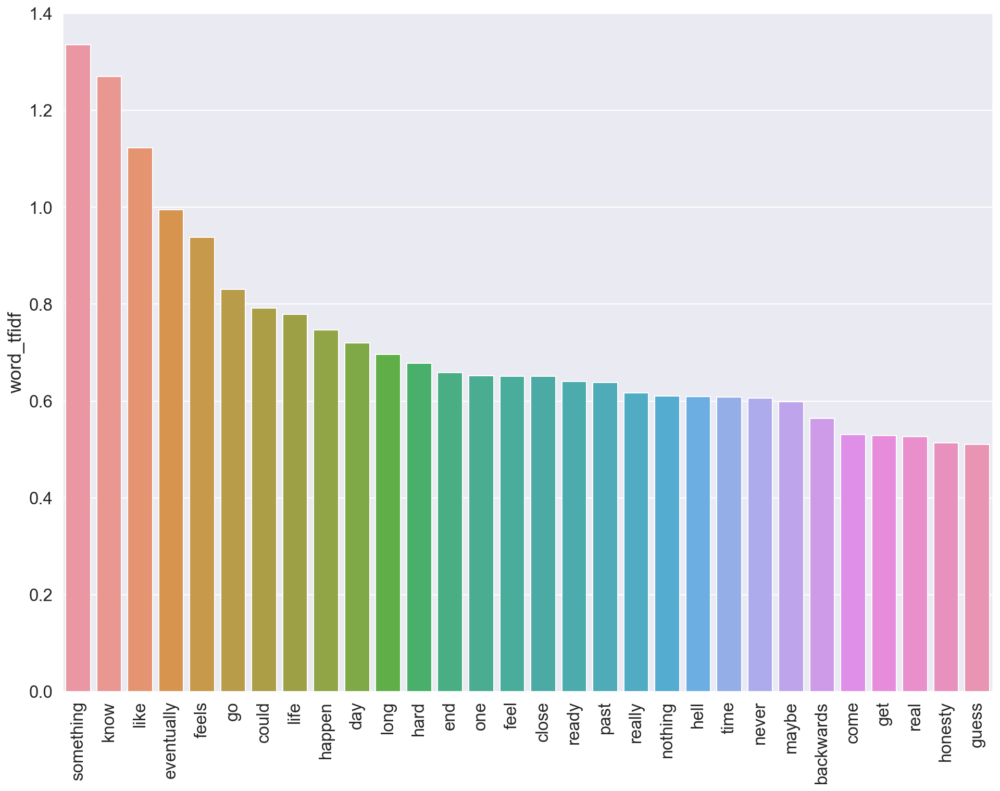

 
Artist: Taylor Swift
           word_tfidf
like         2.848926
know         2.474133
love         2.368447
never        2.250926
think        2.144197
cause        1.919718
back         1.896510
ever         1.812440
say          1.780440
time         1.773601
baby         1.716784
see          1.575102
made         1.552442
got          1.549337
one          1.496959
eyes         1.458017
ey           1.456305
look         1.448997
said         1.401951
could        1.327867
bad          1.321186
wish         1.300087
want         1.273706
tell         1.247929
things       1.195304
beautiful    1.177251
go           1.172782
remember     1.156525
knew         1.151677
around       1.135606


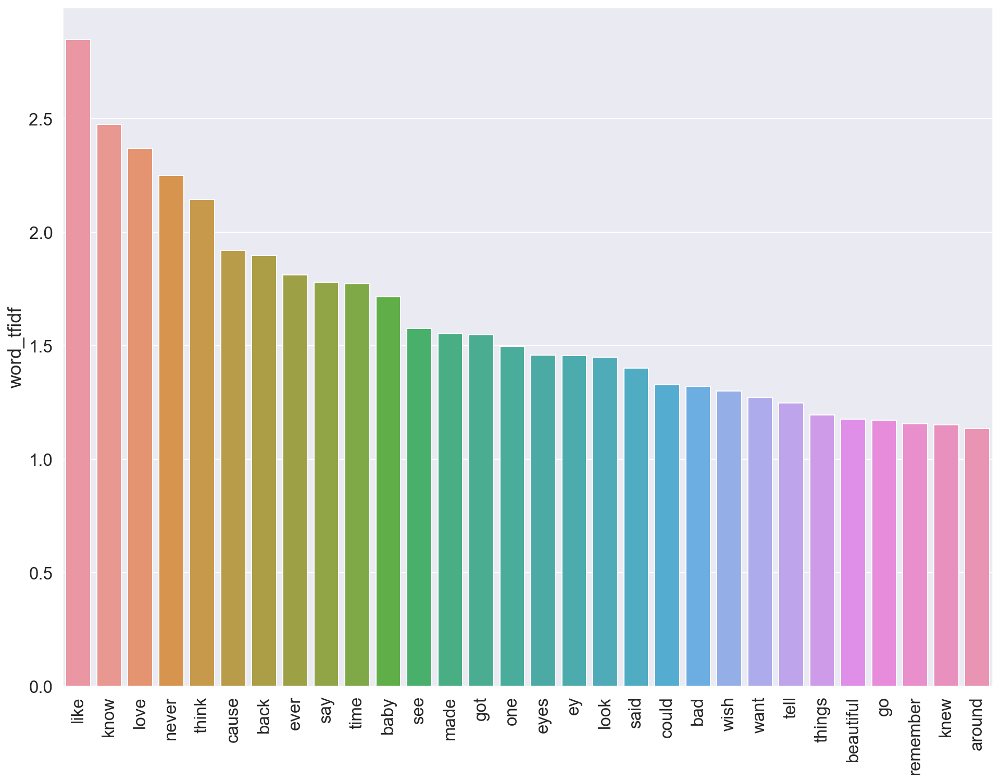

 
Artist: The Black Keys
         word_tfidf
got        3.362131
hey        2.900026
know       2.648052
go         2.442836
love       2.268723
heart      2.148506
thing      2.087093
mind       2.067586
darling    2.058408
hold       2.056744
get        1.976027
well       1.906529
let        1.904725
door       1.828200
one        1.793905
lies       1.769039
never      1.635298
mine       1.613292
right      1.603202
way        1.579465
see        1.572600
times      1.568714
like       1.565918
matter     1.558293
eyes       1.536910
going      1.509654
away       1.494152
back       1.489287
gonna      1.423566
baby       1.340076


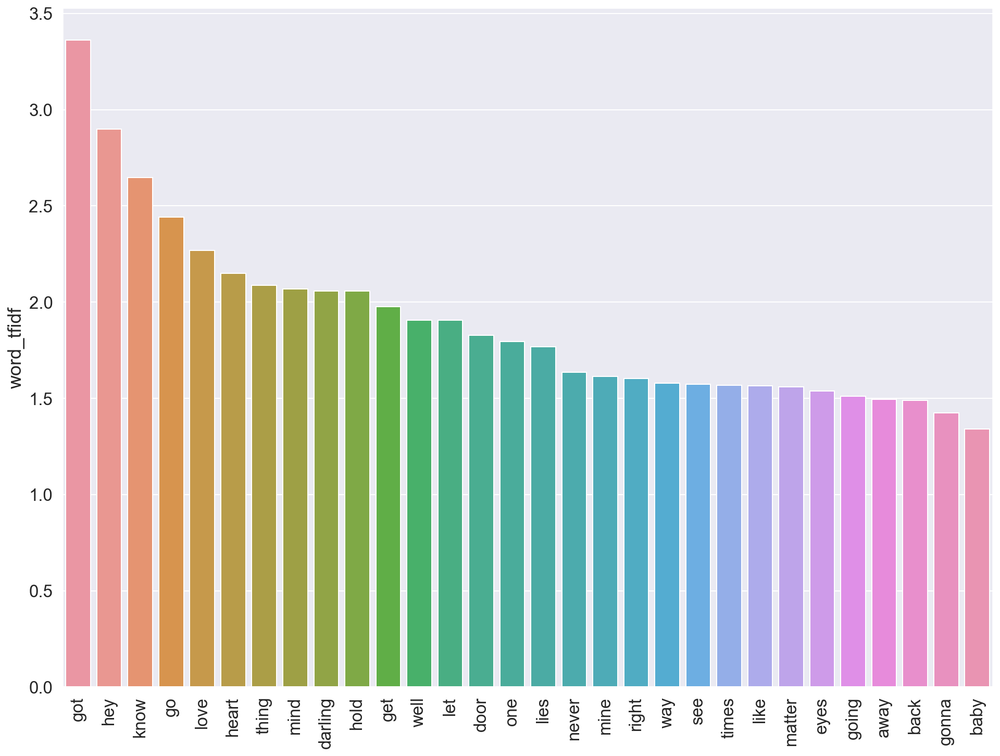

 
Artist: The Rolling Stones
          word_tfidf
angie       0.954313
monkey      0.918007
thumb       0.830064
come        0.750639
roll        0.724037
breaker     0.685840
shot        0.663284
rider       0.653777
away        0.647750
painted     0.646794
got         0.516539
black       0.460704
ruby        0.436743
heart       0.425910
change      0.404861
want        0.397068
babe        0.388062
tuesday     0.384486
baby        0.375753
tumbling    0.372712
tear        0.346686
goodbye     0.328368
scrape      0.309946
virginia    0.309946
someone     0.308961
well        0.291179
right       0.277192
hang        0.276990
see         0.276965
bleed       0.276500


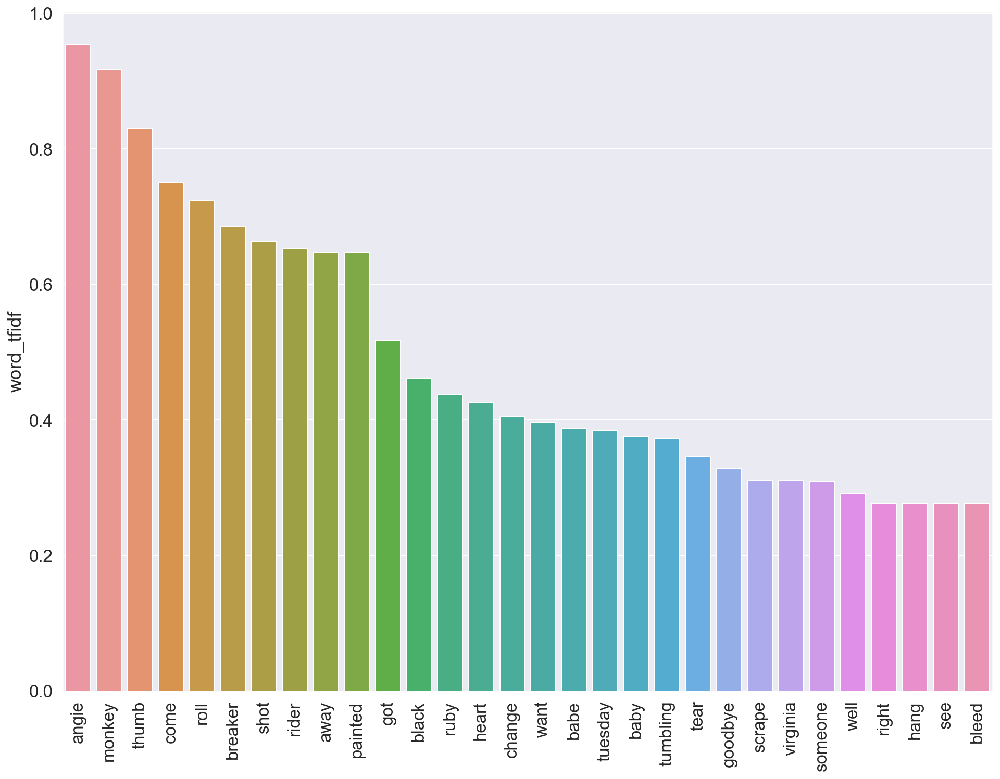

 
Artist: The Weeknd
          word_tfidf
know        3.368589
love        3.085702
baby        3.026474
girl        2.818673
got         1.867149
need        1.843074
cause       1.605302
feel        1.602071
nothing     1.573168
thursday    1.556551
want        1.506453
xo          1.503438
let         1.270353
make        1.269346
life        1.198983
shit        1.191636
ohh         1.173257
woah        1.128618
keep        1.126245
somebody    1.086382
touch       1.047419
money       1.030008
star        1.019486
find        0.991764
could       0.986596
hey         0.949222
lo          0.948644
said        0.941227
coming      0.929299
like        0.913970


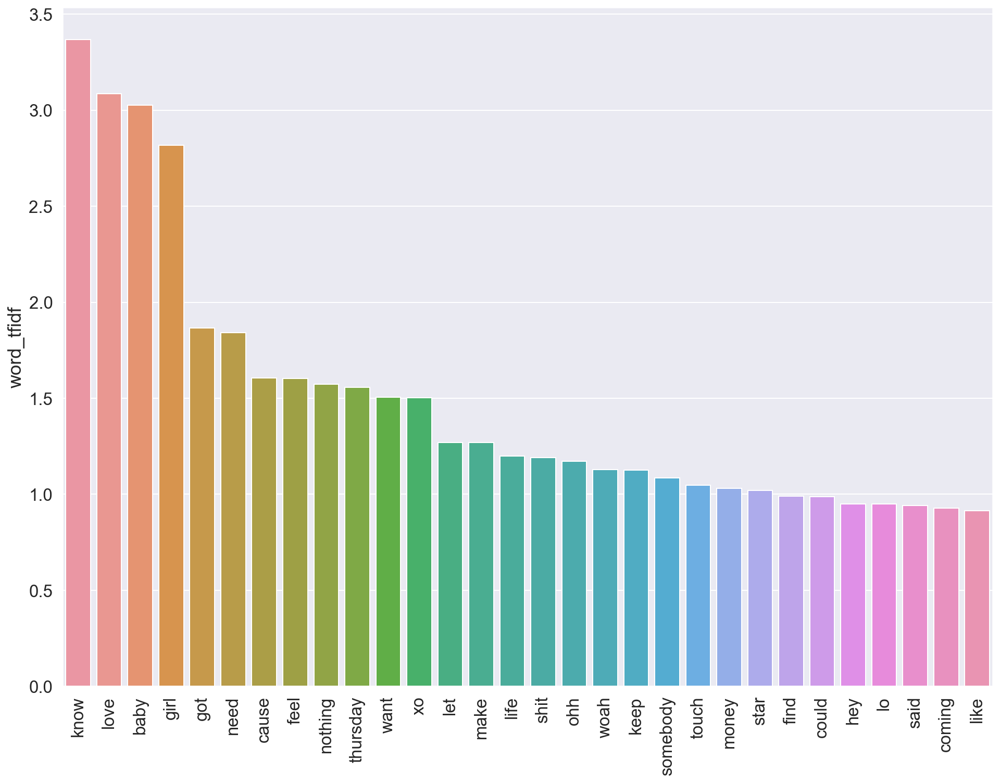

 
Artist: Tyler, The Creator
          word_tfidf
fuck        3.432063
fucking     2.984622
nigga       2.854396
like        2.014124
shit        1.955267
bitch       1.780341
niggas      1.484994
golf        1.438601
wang        1.422188
got         1.193340
back        1.139935
get         1.114384
time        1.046972
bag         1.039631
call        1.033985
cause       0.936376
girl        0.934008
couple      0.916689
let         0.888192
getting     0.871606
go          0.871198
know        0.871022
wolf        0.834466
48          0.825084
boy         0.803710
run         0.797087
tamale      0.783585
november    0.778897
find        0.771337
see         0.769655


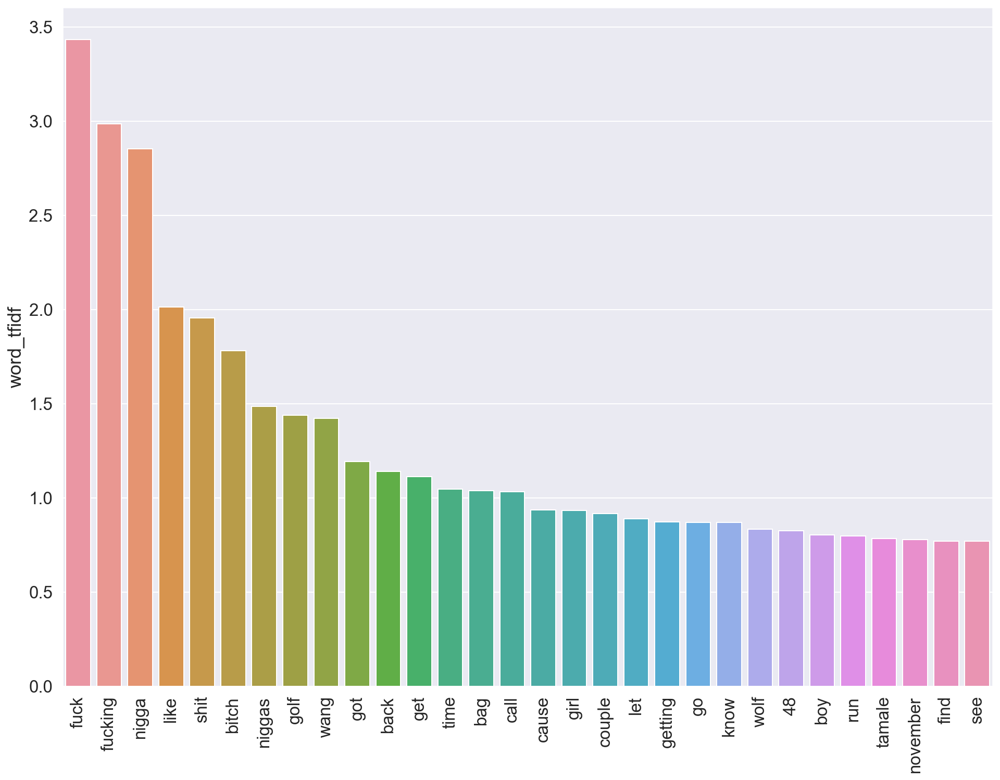

 
Artist: Wiz Khalifa
         word_tfidf
niggas     2.284720
roll       1.879985
nigga      1.682271
hard       1.554940
money      1.538087
got        1.535496
get        1.375042
gang       1.343606
us         1.335290
gon        1.301980
rolling    1.134224
shit       1.081292
real       1.033244
weed       1.029339
papers     1.027750
cause      1.021045
know       0.987176
let        0.976866
hol        0.963539
say        0.962862
wanna      0.961613
paper      0.950366
goin       0.932676
fuck       0.907313
make       0.905655
okay       0.900283
plane      0.880911
like       0.873015
wake       0.869980
work       0.866900


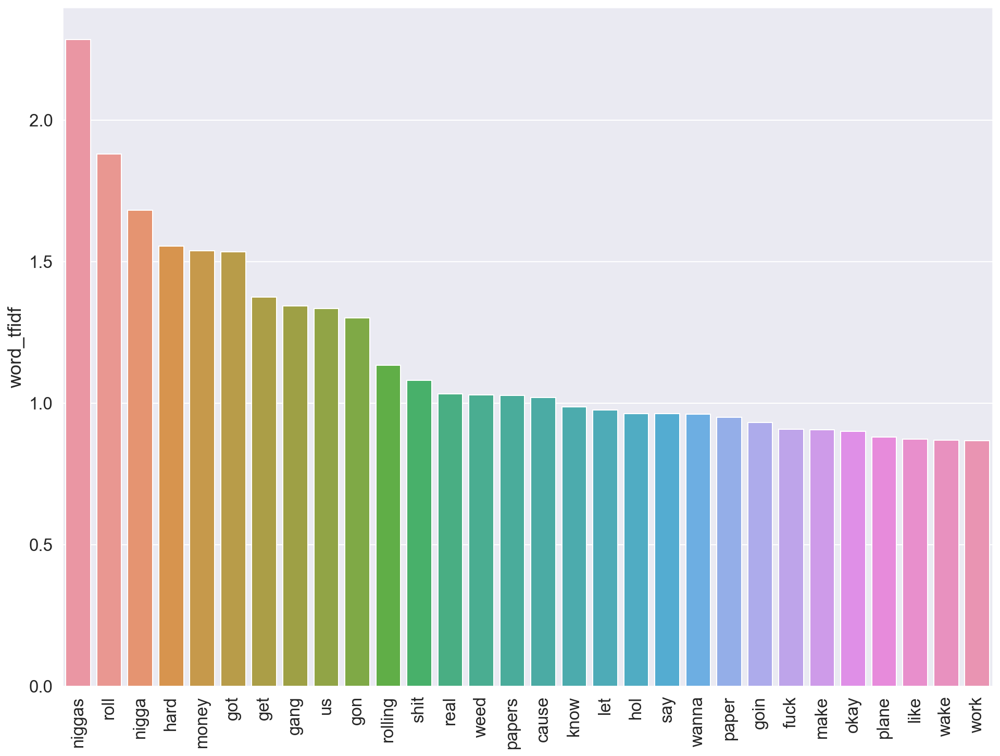

In [50]:
for name in data.artist_name.unique():
    
    print('Artist: {}'.format(name))
    
    tvec_artist = pd.DataFrame(TVEC[TVEC.index==name].sum(), 
                           columns=['word_tfidf']).sort_values(by='word_tfidf', 
                                                               ascending=False)[:30]

    print(tvec_artist)
    
    fig, ax = plt.subplots(figsize=(16,12))
    count_bar = sns.barplot(x=tvec_artist.index, y=tvec_artist.word_tfidf);
    count_bar.set_xticklabels(labels=tvec_artist.index,rotation=90);
    plt.show()
    print(' ')

**Intra tifdf**

Artist: A$AP Rocky
        word_tfidf
like      2.481974
niggas    2.183054
nigga     1.956192
fuck      1.676265
love      1.445175
back      1.426645
got       1.341892
come      1.029566
shit      1.019885
feel      1.011198
still     1.010775
flacko    0.995258
tell      0.991867
swag      0.960945
know      0.923494
man       0.892704
one       0.886383
young     0.883842
new       0.853428
get       0.849848
kids      0.842247
make      0.841917
say       0.826226
gettin    0.815728
cause     0.814166
never     0.813883
bitch     0.799196
lord      0.780904
day       0.776928
go        0.751022


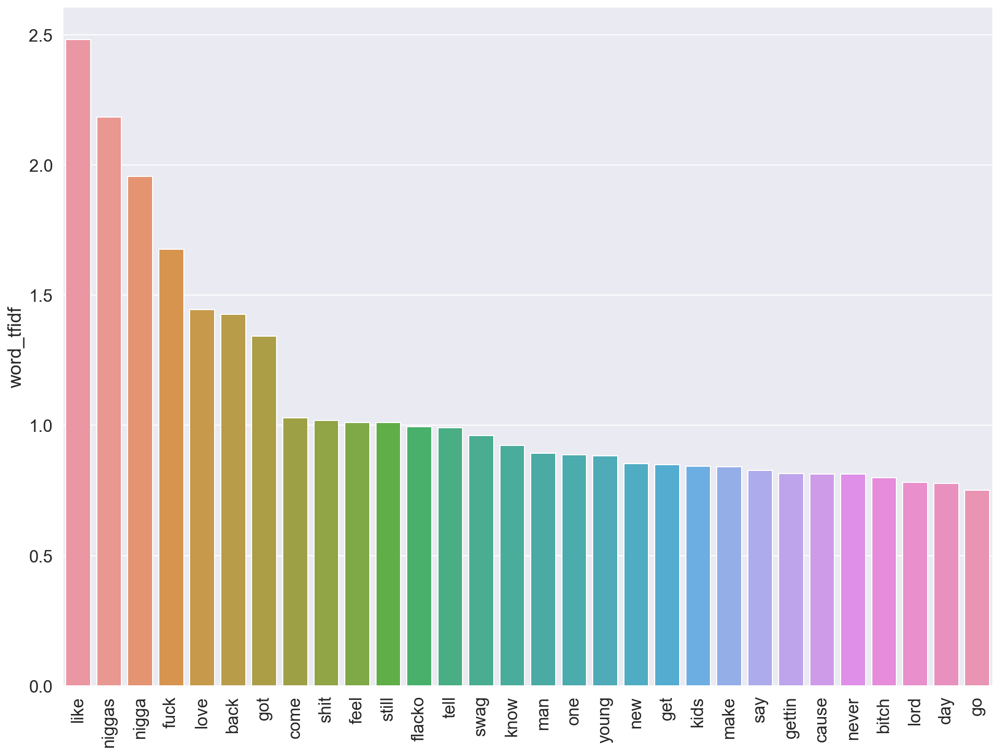

 
Artist: Adele
          word_tfidf
love        1.755087
like        1.499673
go          1.074754
take        1.043741
let         1.009601
look        1.002274
feel        1.001063
wish        0.992159
say         0.936745
miss        0.901266
make        0.891233
aye         0.877910
never       0.855479
gonna       0.854884
always      0.838159
world       0.809300
nothing     0.765139
sweetest    0.745925
know        0.726811
whenever    0.723226
life        0.722166
could       0.713711
river       0.696504
back        0.673998
heart       0.667683
deep        0.667182
lea         0.659157
time        0.656666
ready       0.655597
see         0.645302


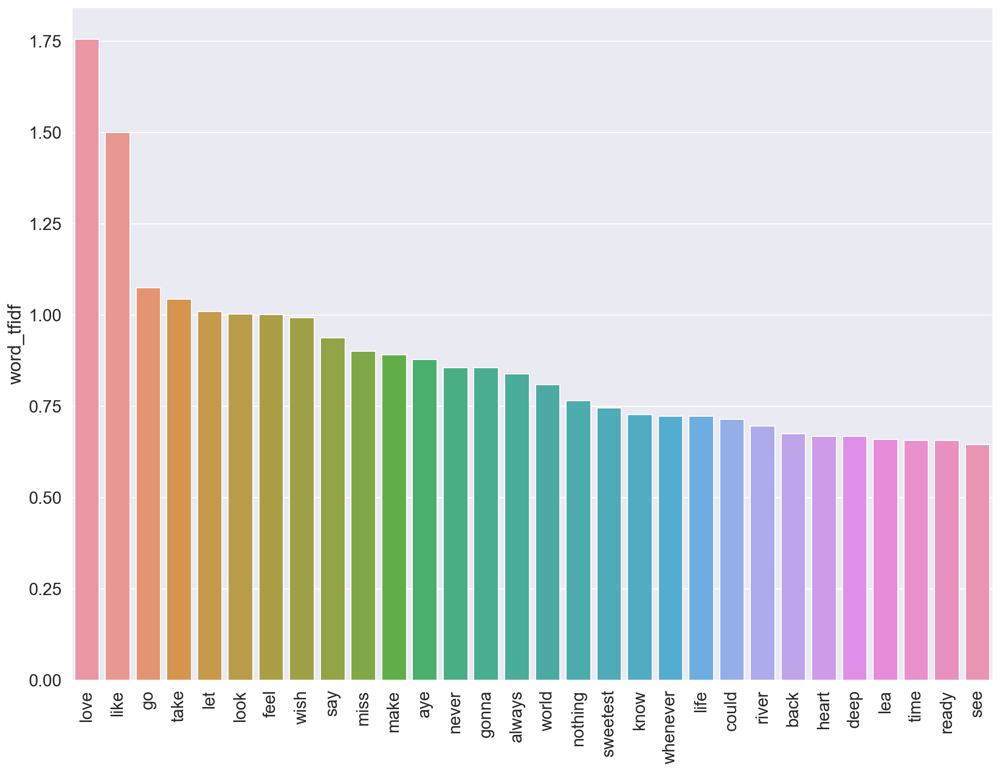

 
Artist: Amy Winehouse
          word_tfidf
man         1.156884
get         1.057668
love        0.978412
never       0.974220
amy         0.934334
like        0.925633
day         0.871809
lady        0.852301
come        0.849037
stronger    0.822555
friends     0.792531
time        0.779545
know        0.754747
alone       0.722201
always      0.705669
way         0.680200
think       0.654535
mine        0.632027
feel        0.611450
greater     0.599545
got         0.596684
must        0.589409
bed         0.580097
cause       0.543564
ay          0.538945
rich        0.523920
girl        0.521762
meet        0.519886
men         0.514751
bout        0.514751


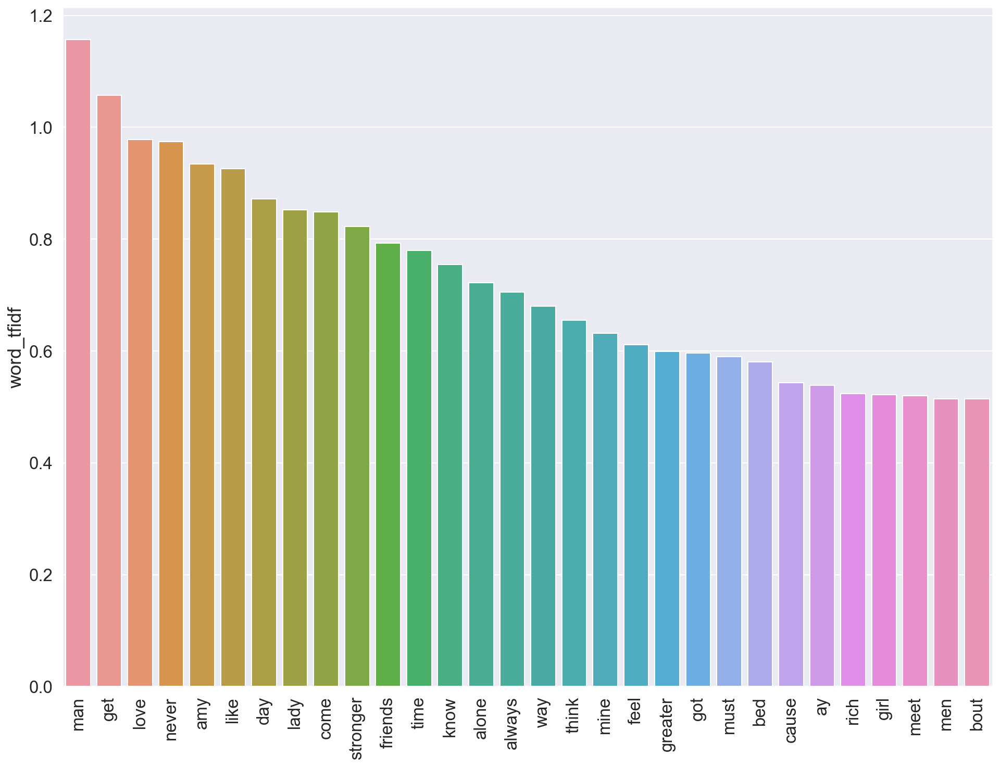

 
Artist: Arctic Monkeys
         word_tfidf
know       1.779418
wanna      1.520163
make       1.393877
get        1.331142
like       1.316146
come       1.147041
go         1.110940
well       0.967059
could      0.954044
cause      0.946943
never      0.939847
back       0.937111
said       0.912581
time       0.896124
got        0.889097
us         0.887562
mine       0.859470
thought    0.819149
looks      0.802874
see        0.797520
want       0.793141
take       0.777306
sure       0.757010
let        0.709757
still      0.709448
look       0.701743
wrong      0.693818
eyes       0.684956
place      0.678619
fun        0.677207


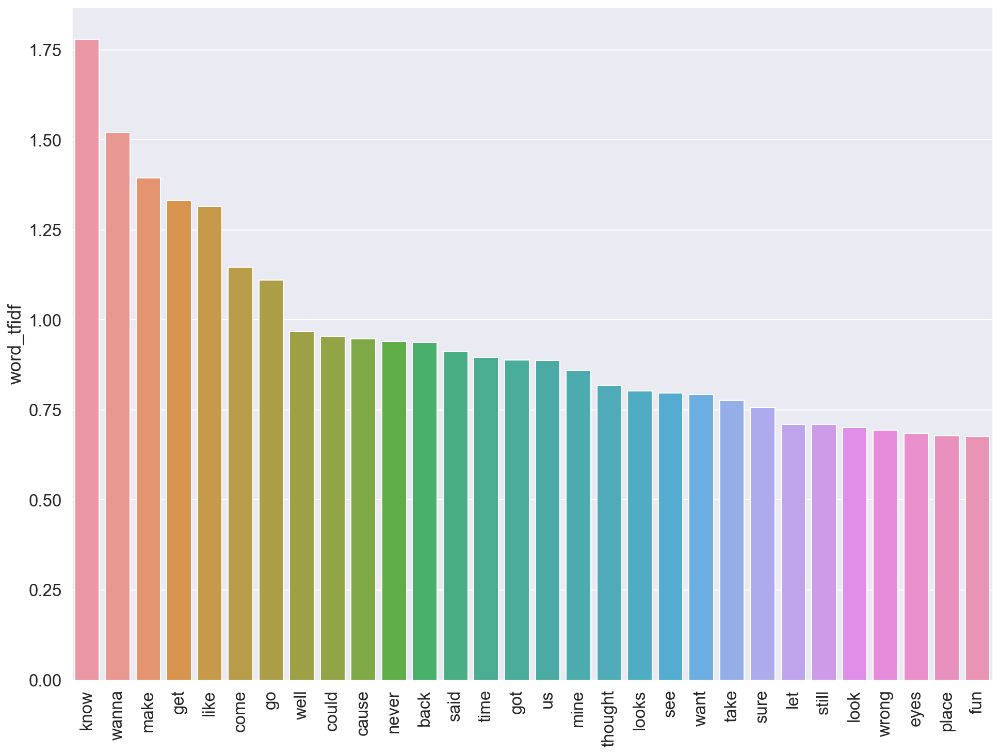

 
Artist: Aretha Franklin
          word_tfidf
let         1.654357
love        1.642175
baby        1.614939
get         1.581803
right       1.318676
think       0.902916
see         0.826772
little      0.822701
send        0.809142
take        0.770147
walk        0.756571
go          0.751126
like        0.750840
jack        0.732679
soul        0.730085
step        0.714433
bit         0.695532
midnight    0.665320
til         0.649122
last        0.641860
load        0.635957
serenade    0.634412
back        0.628054
man         0.620626
freeway     0.617073
feel        0.606721
steady      0.605112
rock        0.605112
moment      0.599074
saw         0.593417


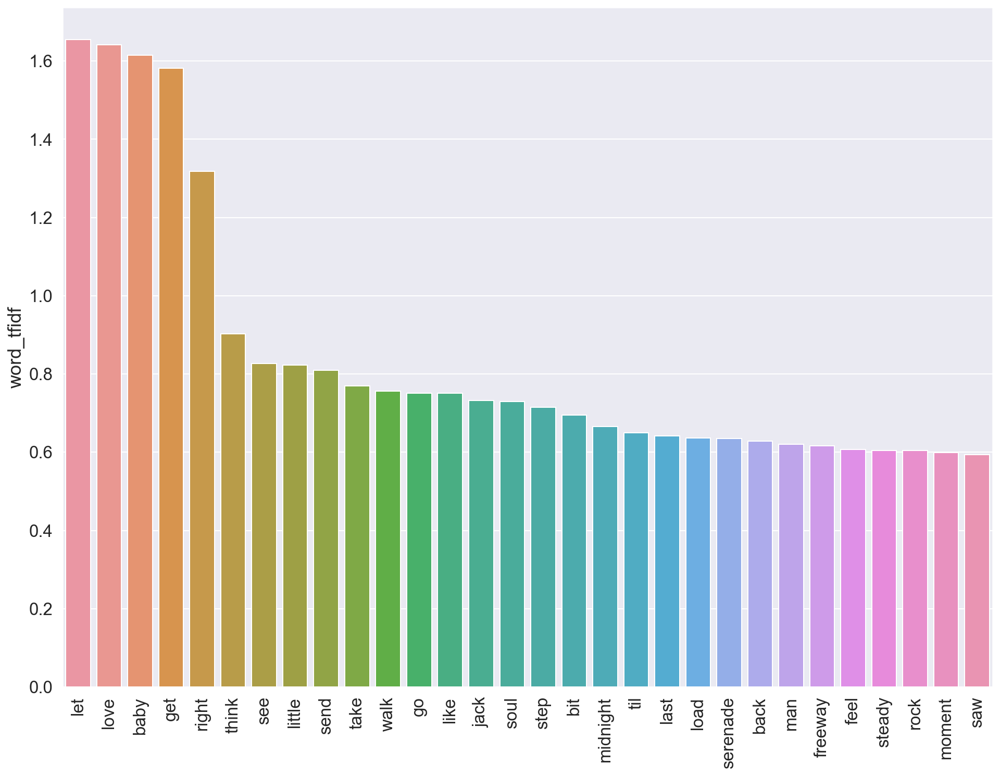

 
Artist: Beach House
           word_tfidf
like         2.727435
know         2.420197
want         1.981673
time         1.741873
go           1.509810
mind         1.353880
back         1.305884
nothing      1.240454
love         1.229787
come         1.202870
take         1.176666
tell         1.170196
say          1.152656
night        1.149048
left         1.088796
us           1.084736
day          1.083609
would        1.074298
comes        1.026626
run          1.026605
place        1.024432
something    0.998203
sun          0.963656
happening    0.918507
right        0.911609
one          0.898797
eyes         0.876247
keep         0.864816
watch        0.855797
dark         0.848838


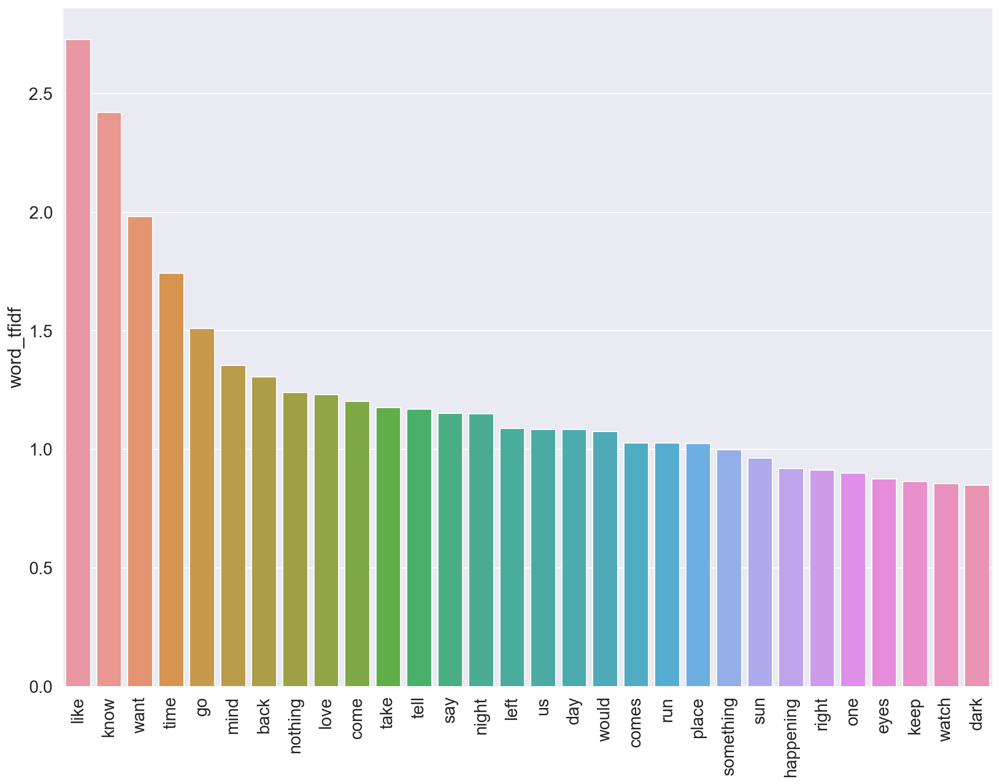

 
Artist: Beyoncé
        word_tfidf
love      3.310562
baby      2.412969
like      2.366336
got       2.137331
know      2.034331
go        1.789741
girl      1.732148
cause     1.618081
yes       1.576302
let       1.505907
hey       1.375395
wanna     1.370502
could     1.308533
said      1.303491
time      1.274112
put       1.229865
care      1.136879
never     1.136780
us        1.097415
hello     1.067591
much      1.067132
lights    1.062727
body      1.060135
see       1.043239
right     1.035803
good      1.009051
want      1.005419
halo      0.978145
mine      0.975005
feel      0.974381


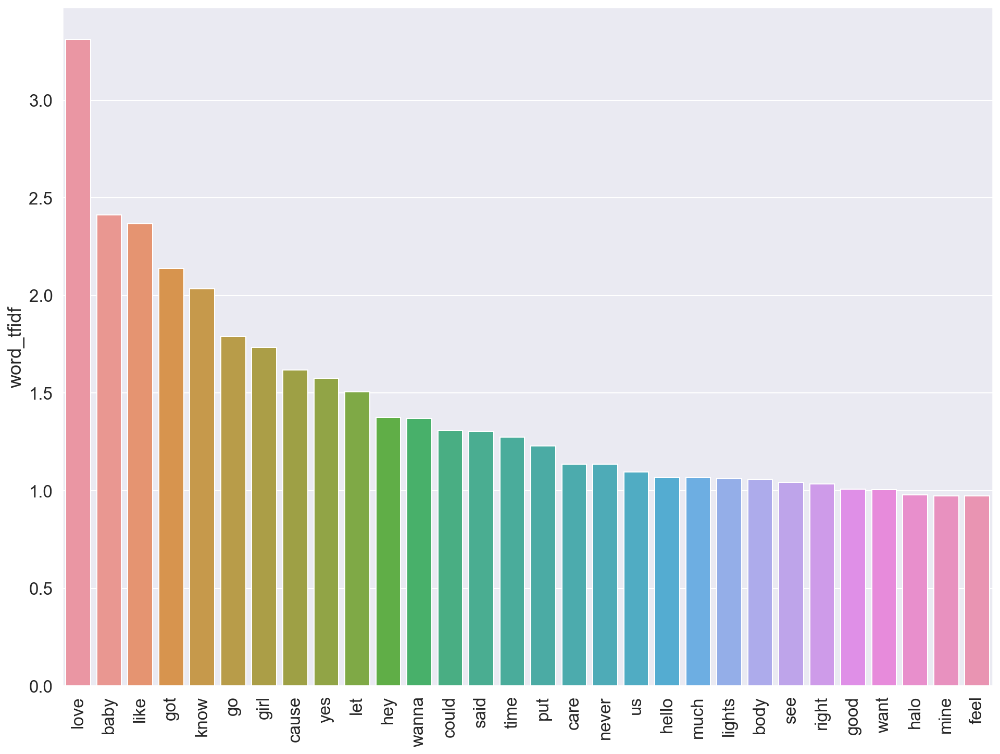

 
Artist: Caribou
              word_tfidf
say             1.372882
love            1.099852
instrumental    1.000000
sun             1.000000
away            0.877391
ever            0.700913
house           0.692025
leave           0.669930
go              0.668363
goes            0.649775
tell            0.637123
know            0.619760
ohh             0.583030
left            0.566368
best            0.525685
sometimes       0.457849
irene           0.444443
stay            0.432002
day             0.368282
take            0.349120
smile           0.348479
melody          0.348479
melts           0.348479
gone            0.329899
got             0.316615
see             0.314408
knows           0.313033
done            0.298249
gonna           0.295429
come            0.294103


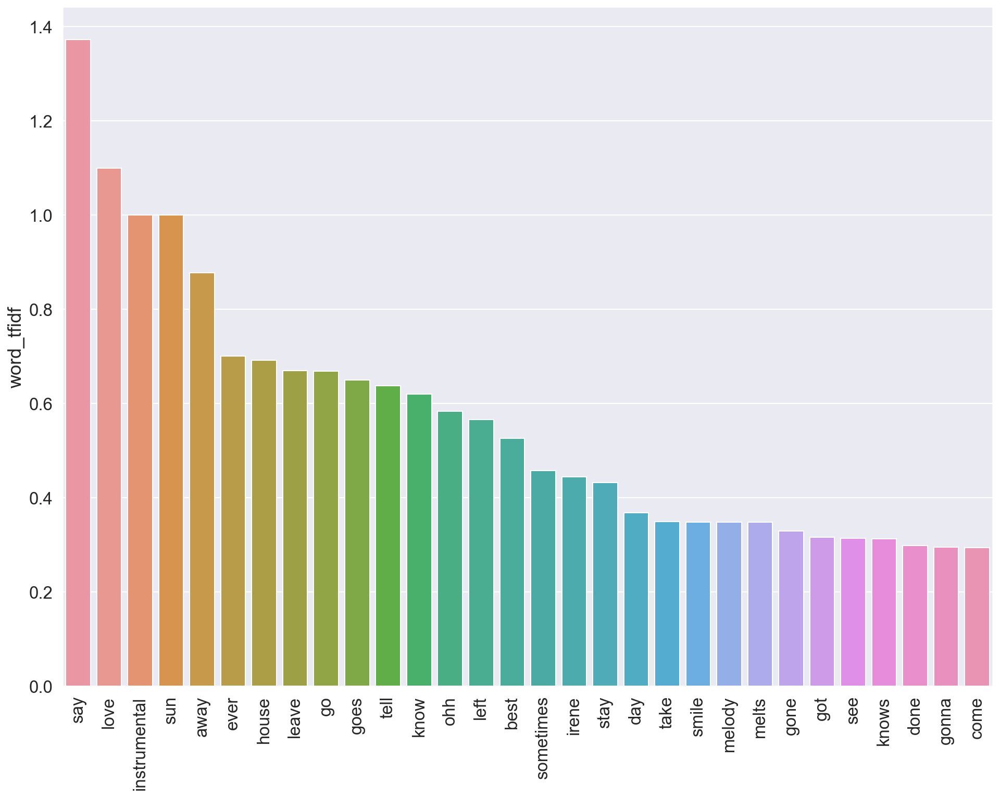

 
Artist: Fall Out Boy
           word_tfidf
like         1.183046
remember     1.140567
love         1.130660
live         1.079627
beat         1.066617
young        1.004250
baby         0.993265
last         0.933181
american     0.905601
one          0.830092
way          0.824237
know         0.792771
back         0.792292
hey          0.791218
little       0.783660
immortals    0.763509
get          0.761990
knees        0.758731
sun          0.739891
fall         0.704244
come         0.688037
mighty       0.669043
long         0.660370
boost        0.638372
anything     0.620438
home         0.620163
let          0.613118
hold         0.608938
tight        0.608938
saturday     0.602101


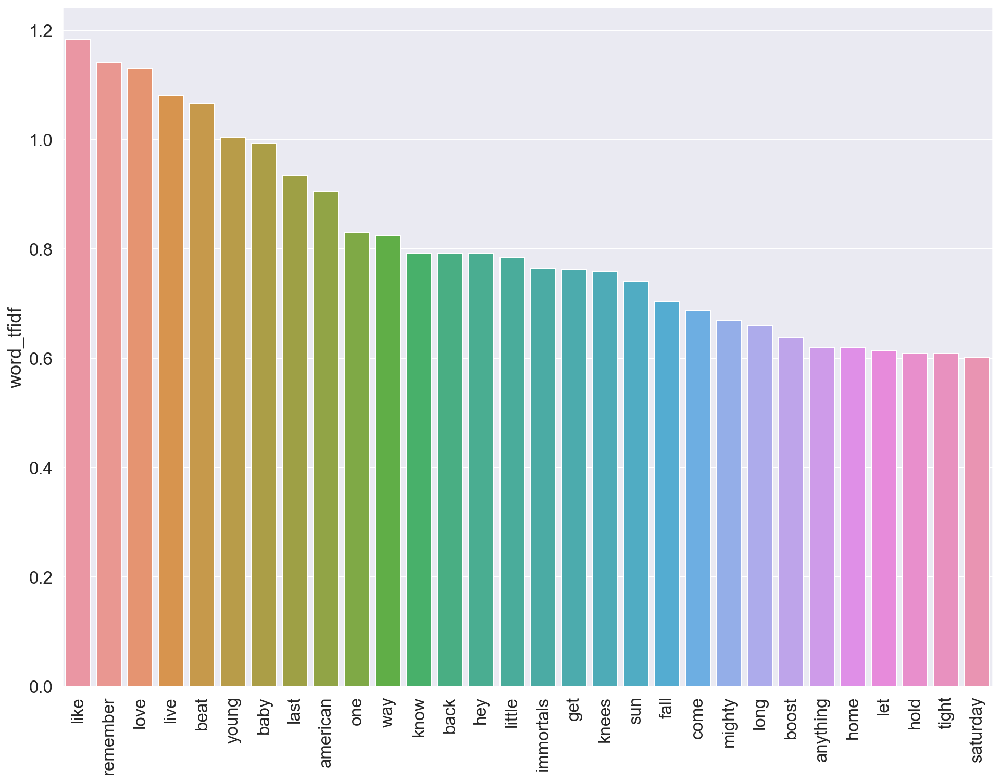

 
Artist: Fleetwood Mac
          word_tfidf
go          1.064978
got         0.969593
hold        0.943419
love        0.925316
tell        0.755633
way         0.723880
want        0.710583
baby        0.664333
mind        0.649390
head        0.646898
lies        0.637200
comes       0.602524
get         0.591842
like        0.573035
back        0.571497
say         0.555883
loving      0.542904
turning     0.533975
world       0.514816
know        0.504663
falling     0.498143
make        0.489313
magic       0.474181
maybe       0.471675
need        0.443369
fun         0.439074
rhiannon    0.435690
taken       0.435690
yes         0.428716
another     0.426996


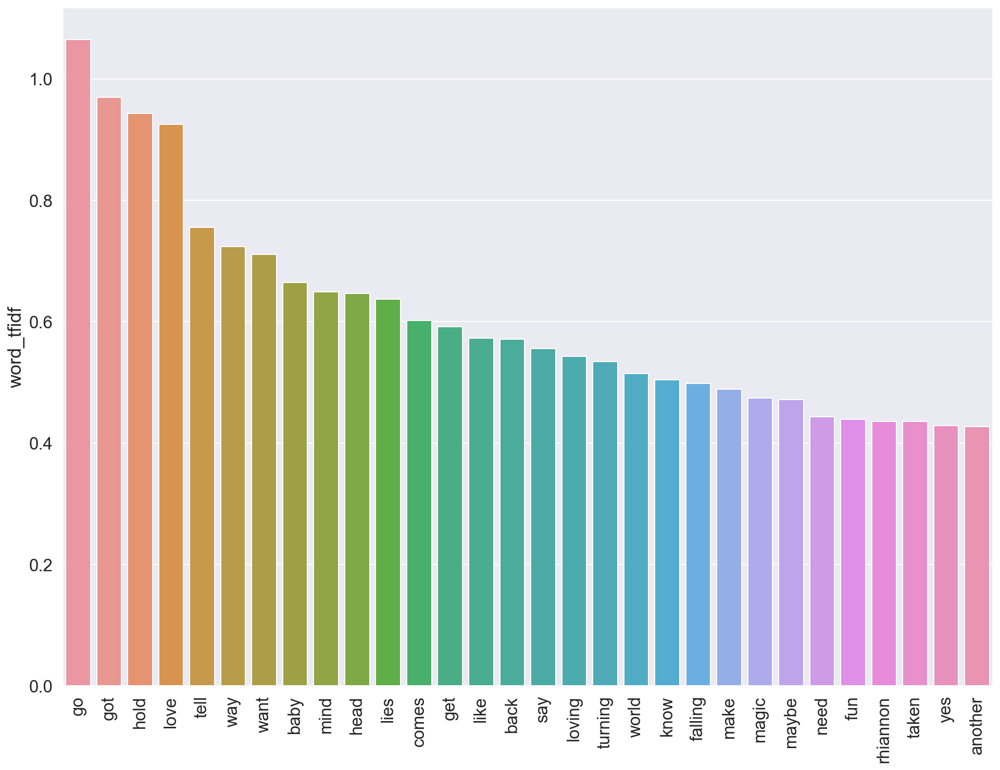

 
Artist: Foo Fighters
           word_tfidf
go           2.291957
back         2.091609
come         1.837979
one          1.719899
say          1.632911
never        1.568742
like         1.335493
away         1.292006
know         1.255001
let          1.221157
die          1.112749
time         1.091656
make         1.056433
way          1.030261
want         1.000838
life         0.995949
best         0.966869
word         0.957532
ever         0.942501
days         0.937815
run          0.937295
river        0.907940
alive        0.893661
something    0.857091
clear        0.854316
hey          0.847519
done         0.828968
could        0.828067
call         0.817012
wheels       0.809375


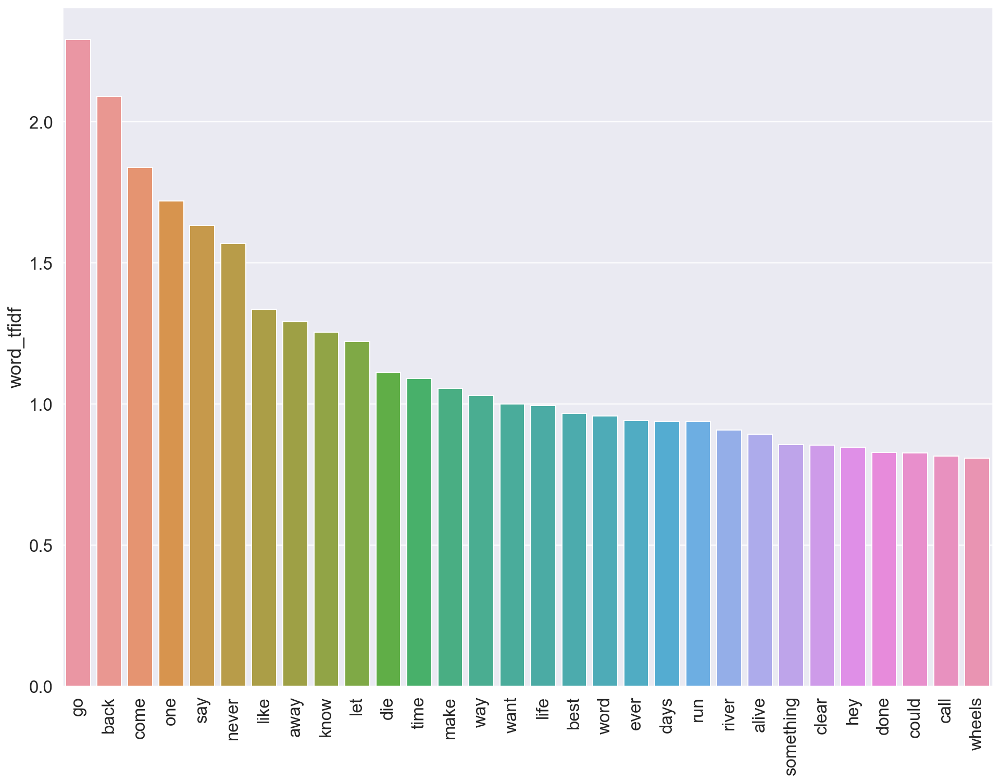

 
Artist: Frank Ocean
            word_tfidf
love          1.563986
know          1.400430
like          1.386737
life          1.235721
got           1.117431
see           1.030989
good          1.001874
sweet         0.947749
time          0.902503
lost          0.883003
fertilizer    0.864017
could         0.824764
run           0.818893
feel          0.792624
forrest       0.769188
think         0.762334
night         0.762225
nothing       0.760127
low           0.745779
swim          0.706861
us            0.692791
nigga         0.666885
mind          0.660134
pyramid       0.648508
hah           0.627961
feelings      0.626840
fuck          0.625962
working       0.625069
world         0.622027
back          0.611502


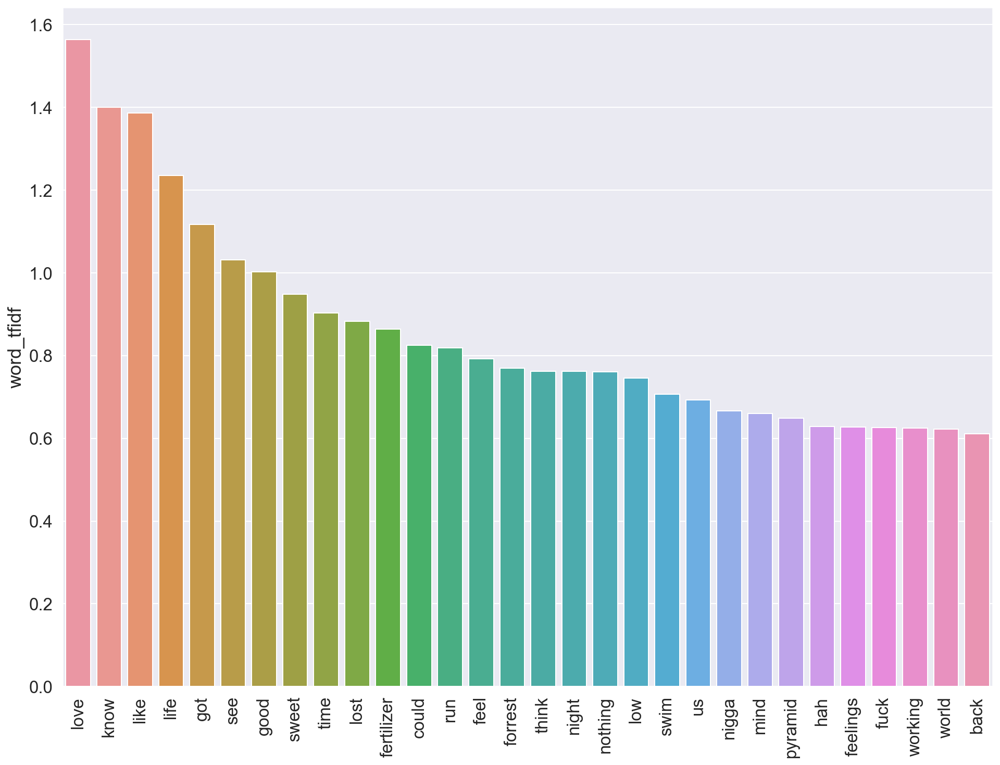

 
Artist: Gorillaz
            word_tfidf
coming        1.576930
gone          1.265193
love          1.240466
like          1.209861
everybody     1.127105
find          1.108096
get           1.092167
think         1.090902
gonna         1.036690
alone         1.034057
got           1.027144
know          0.965403
time          0.932910
day           0.908567
magic         0.902922
stop          0.885382
never         0.881502
broken        0.872864
want          0.864425
world         0.845882
ay            0.845284
away          0.823533
money         0.808279
door          0.787294
feel          0.754330
white         0.750850
back          0.747248
loneliness    0.739149
see           0.738759
vision        0.735656


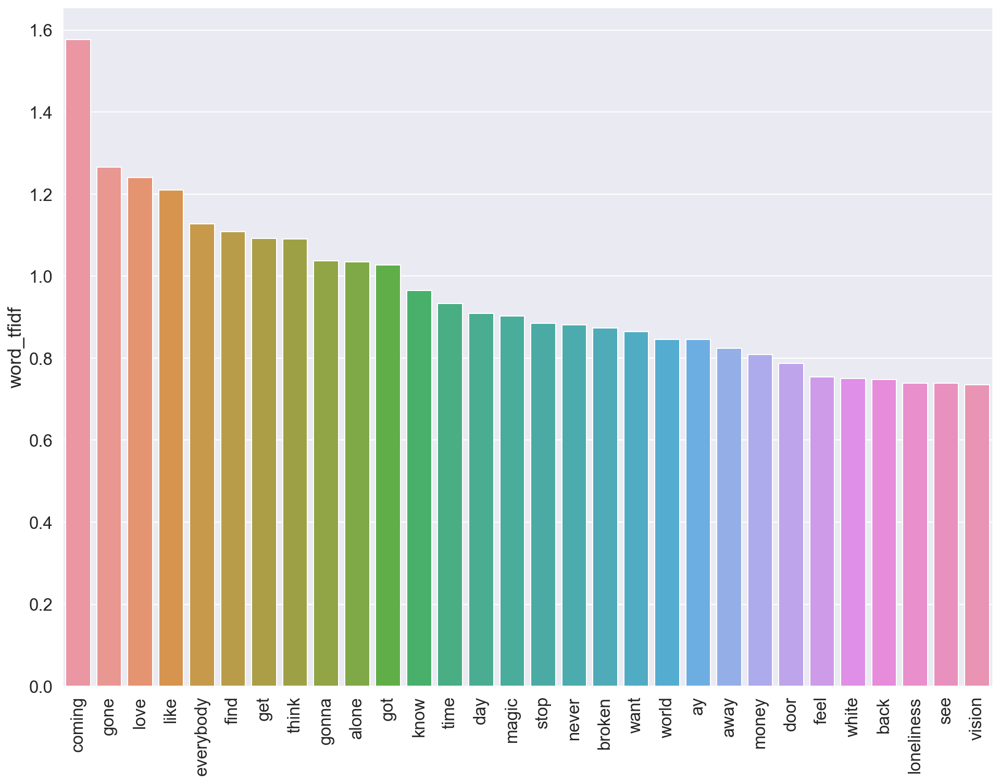

 
Artist: HAIM
         word_tfidf
never      1.199605
know       1.073336
love       0.927692
falling    0.850108
right      0.829591
say        0.767910
saying     0.727000
tried      0.686497
want       0.670474
goodbye    0.658883
honey      0.628370
forever    0.626818
take       0.608896
back       0.573076
give       0.565554
good       0.557118
mind       0.554793
need       0.548802
felt       0.545666
friend     0.532387
guess      0.520719
knew       0.520719
long       0.464181
lover      0.462351
call       0.410979
could      0.387505
go         0.377115
came       0.368972
gave       0.362490
wire       0.354683


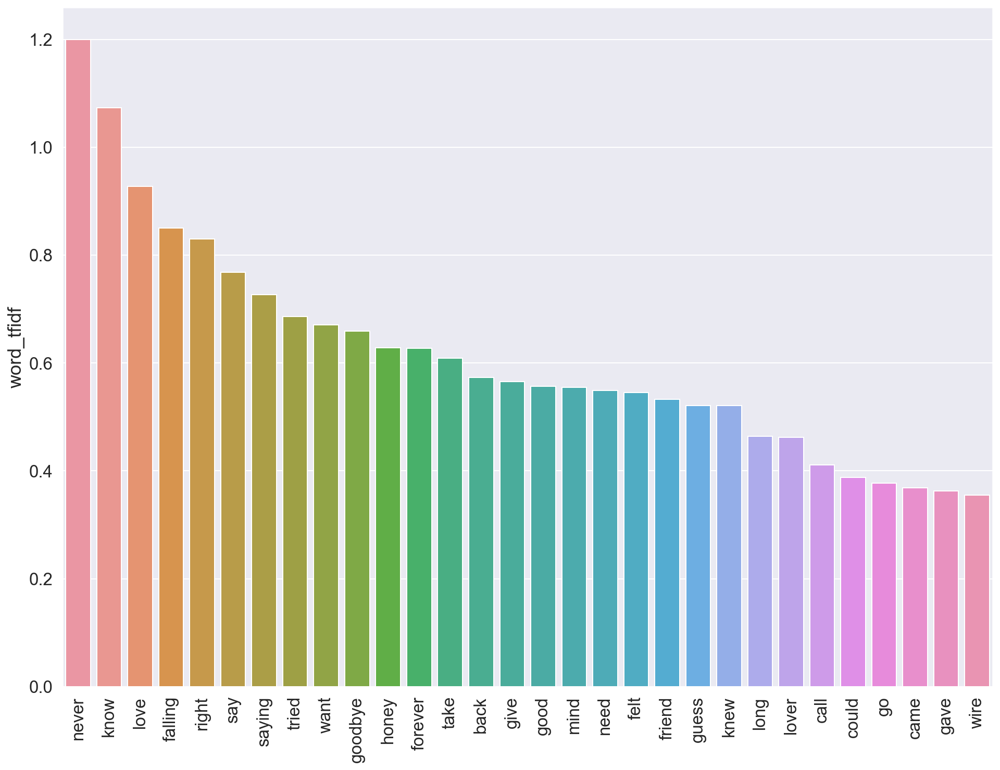

 
Artist: John Legend
         word_tfidf
love       3.663292
know       2.674764
go         2.493987
let        1.847252
time       1.728493
one        1.672382
heaven     1.625125
wanna      1.593843
like       1.453320
think      1.414170
alright    1.362845
take       1.326136
come       1.264047
baby       1.215942
want       1.198750
stay       1.194658
give       1.186858
make       1.177496
nobody     1.140218
need       1.114663
dream      1.092583
try        1.060541
tonight    1.057534
tell       1.039380
see        1.001619
gonna      0.977242
loved      0.953302
cause      0.950524
night      0.928024
save       0.908823


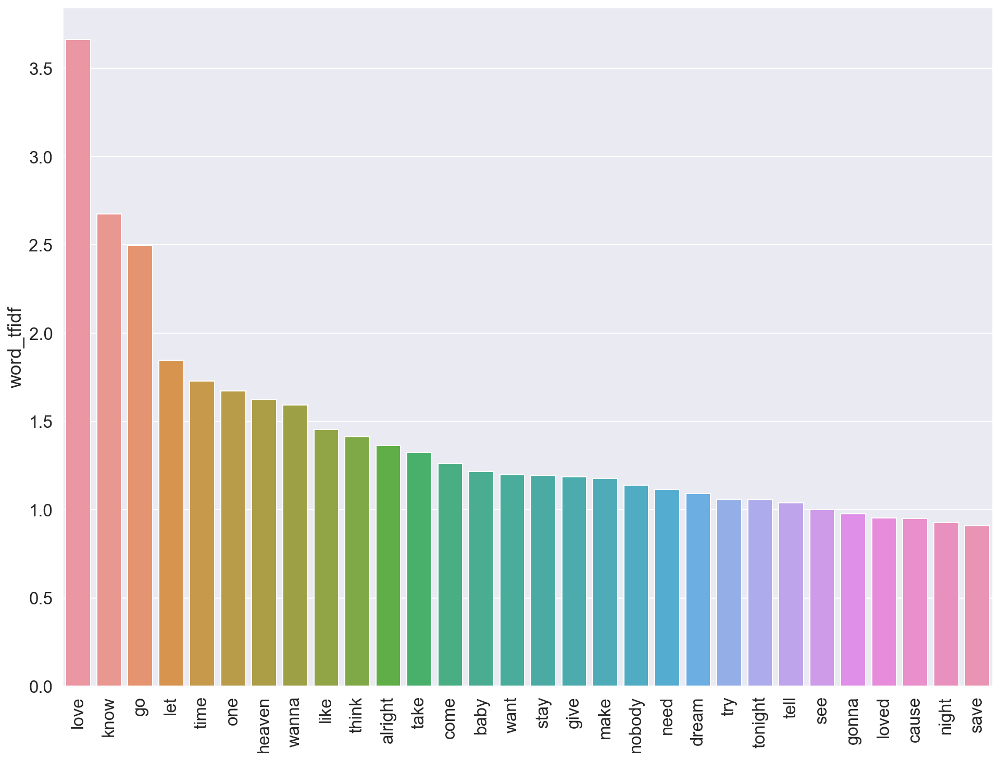

 
Artist: Kendrick Lamar
         word_tfidf
like       1.773739
feel       1.711687
love       1.501985
know       1.350452
nigga      1.335842
got        1.326223
king       1.260236
bitch      1.247917
alright    1.218675
one        1.193040
get        1.080396
yah        1.013415
going      0.945942
shit       0.942181
make       0.921150
hol        0.912531
gon        0.879658
real       0.850437
life       0.832657
walls      0.826456
people     0.820440
zoom       0.820438
dna        0.802844
go         0.782848
ho         0.764205
want       0.749749
damn       0.744747
back       0.724831
huh        0.723882
us         0.717634


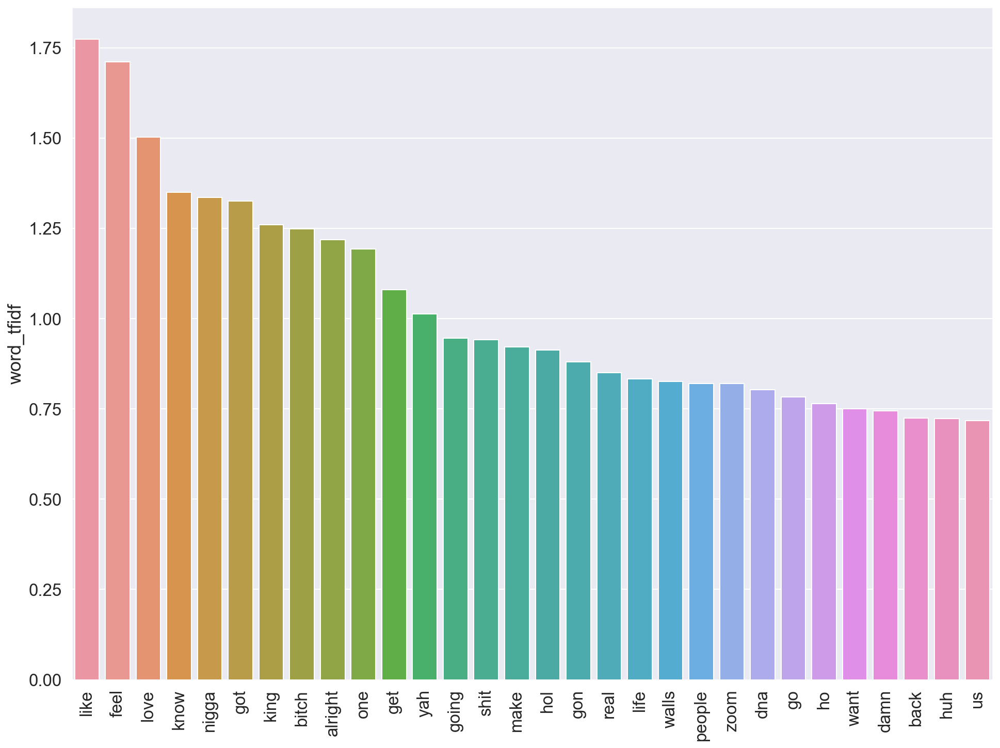

 
Artist: Kings of Leon
           word_tfidf
say          2.003494
going        1.950550
go           1.862914
like         1.816537
way          1.755311
know         1.595867
got          1.485912
away         1.478300
see          1.429744
take         1.429528
one          1.427761
back         1.390118
get          1.354778
want         1.303954
come         1.247143
gonna        1.217594
something    1.188597
never        1.187600
walk         1.061220
could        1.049859
heart        1.029444
roll         1.024908
somebody     1.005404
ever         0.985521
knock        0.965671
find         0.961591
friend       0.946187
shake        0.940076
face         0.911228
hey          0.878606


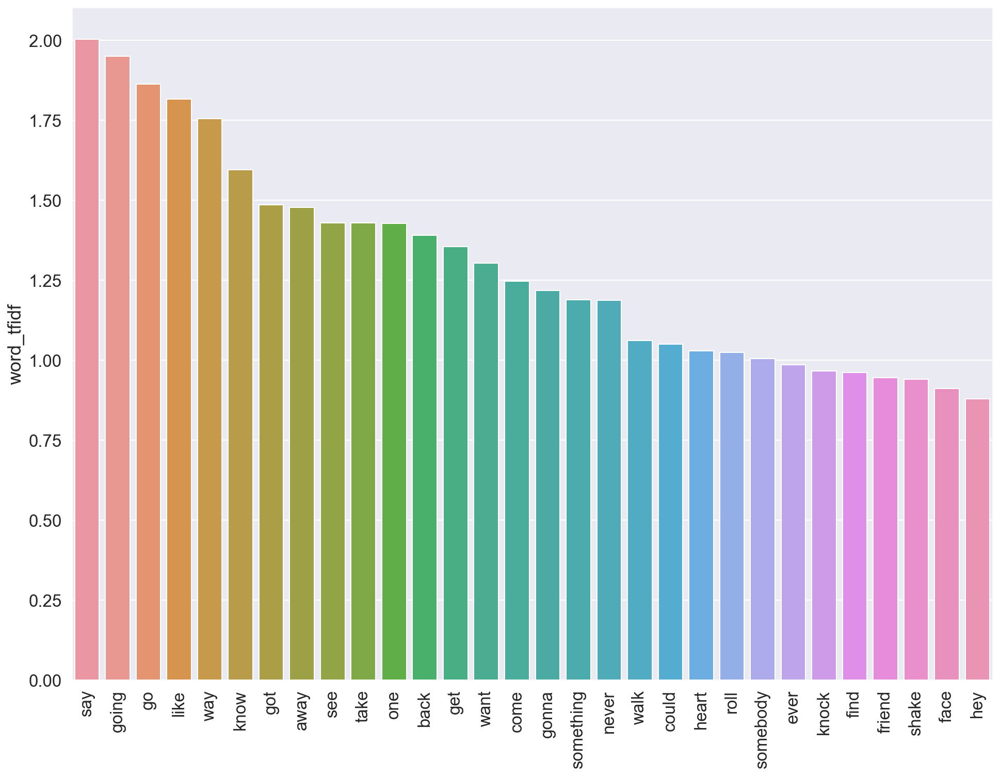

 
Artist: Korn
          word_tfidf
life        1.399781
got         1.325199
never       1.317464
twist       1.068207
away        1.051634
take        1.009648
body        0.950568
inside      0.916018
music       0.904392
feel        0.865522
give        0.854460
gonna       0.846477
right       0.804660
bring       0.793853
fucking     0.781769
shut        0.774286
beg         0.772833
wall        0.752256
see         0.746871
say         0.743848
somebody    0.743333
way         0.726259
need        0.717235
hate        0.704646
cause       0.692987
fuck        0.690381
pain        0.682210
word        0.672446
ball        0.655239
get         0.648756


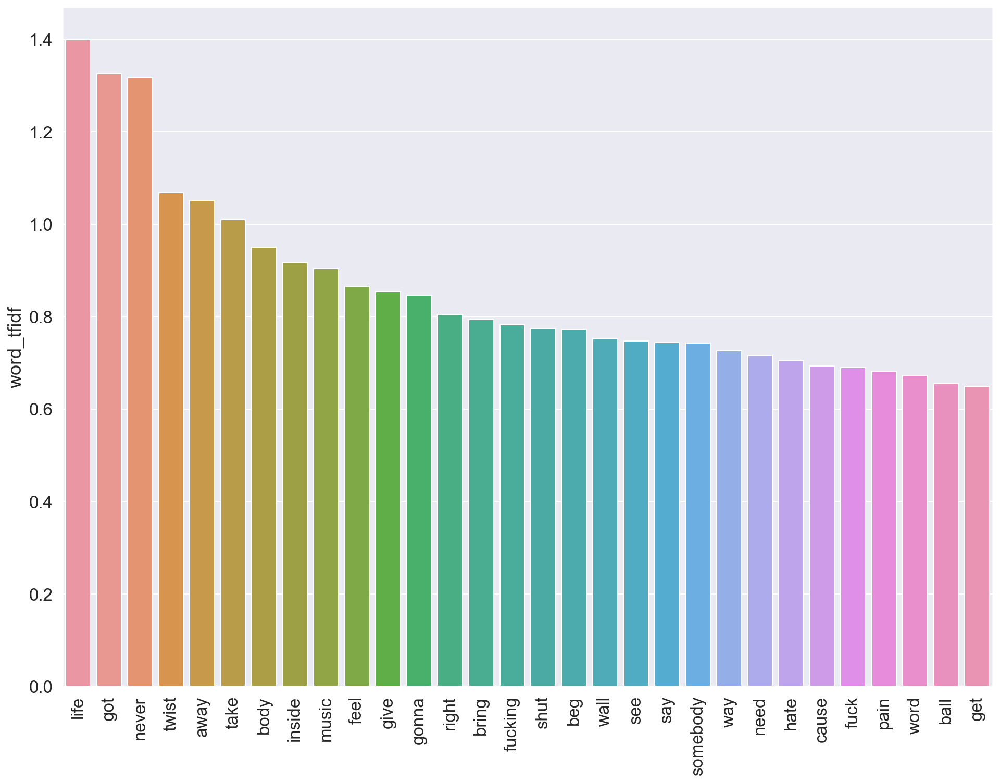

 
Artist: LCD Soundsystem
           word_tfidf
want         1.526622
time         1.209649
like         1.089190
come         1.085516
change       0.935284
home         0.901411
love         0.838558
know         0.820873
never        0.795792
make         0.795704
stop         0.792821
north        0.770456
drunk        0.763452
people       0.763327
coming       0.742125
still        0.739871
without      0.729487
need         0.717011
girls        0.695355
beat         0.694097
much         0.673393
one          0.672695
feel         0.606601
alive        0.597146
keeps        0.593506
repeat       0.587373
normalize    0.584383
feels        0.578349
live         0.576641
everybody    0.575313


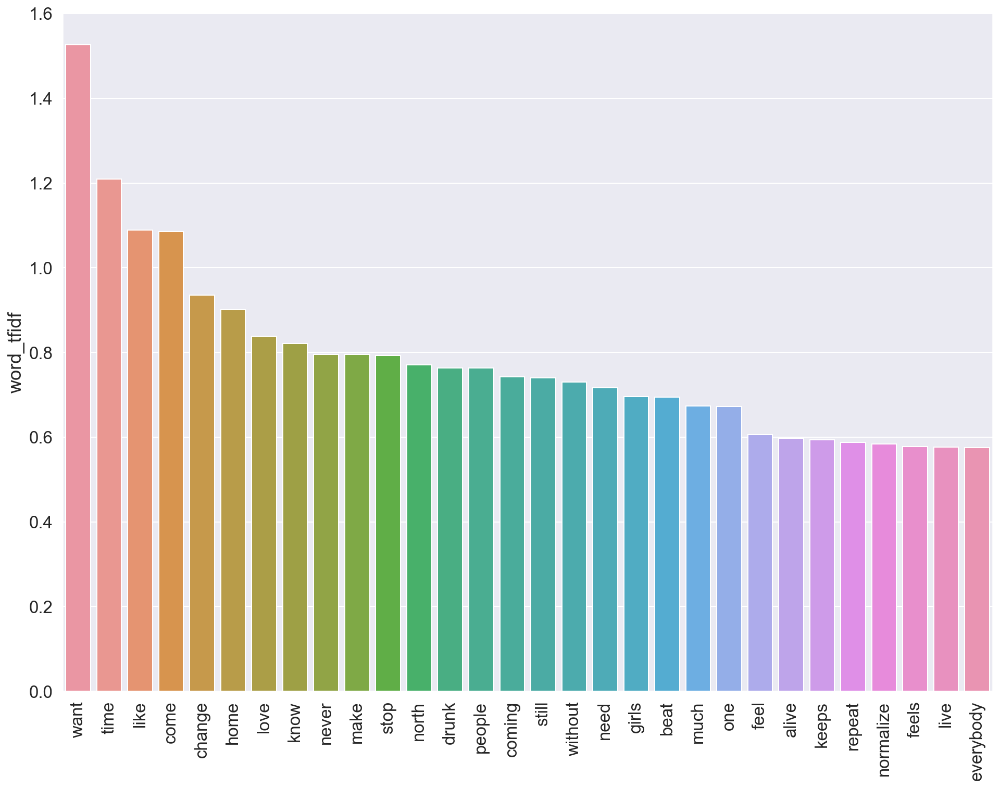

 
Artist: Lady Gaga
       word_tfidf
love     2.206108
want     2.149831
baby     1.829131
know     1.775034
could    1.722490
wanna    1.544412
hey      1.510145
hair     1.462117
heart    1.413434
dance    1.356605
cause    1.306695
got      1.294546
body     1.289109
girl     1.288611
way      1.210664
bad      1.146338
touch    1.143636
like     1.131685
good     1.128328
gonna    1.121399
fame     1.116639
hoo      1.062399
face     0.916968
make     0.915843
say      0.879863
eyes     0.876753
gypsy    0.876644
heal     0.876605
rough    0.867767
stop     0.845590


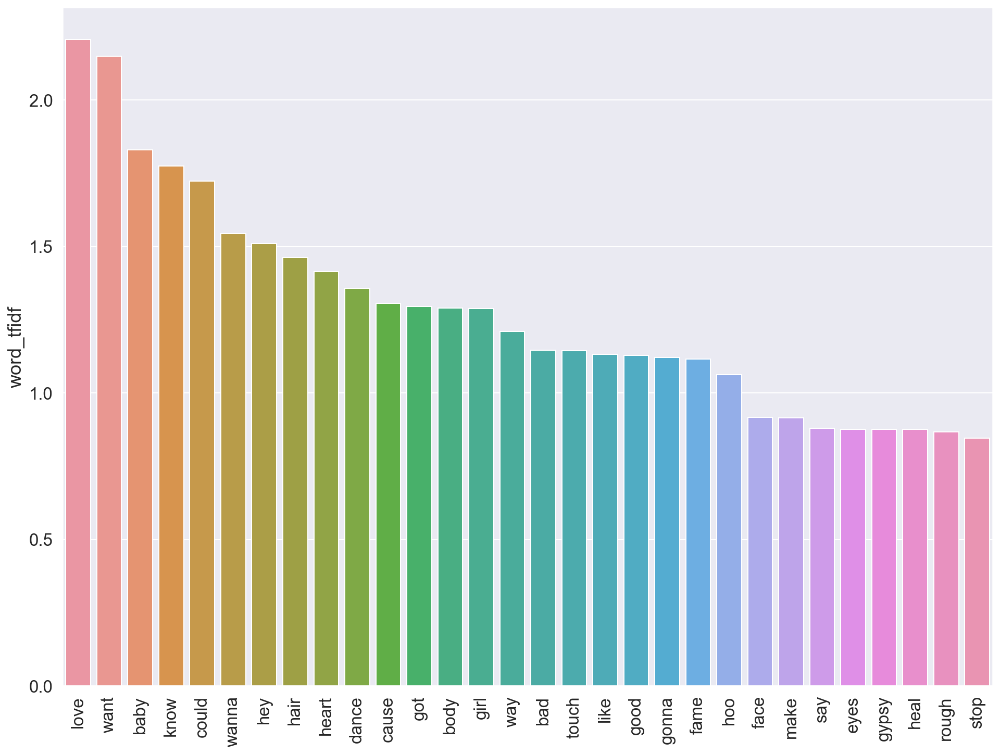

 
Artist: Led Zeppelin
         word_tfidf
baby       1.268278
know       0.937992
light      0.861505
let        0.859071
never      0.769101
lonely     0.766171
people     0.713149
many       0.705303
jesus      0.669729
see        0.668113
take       0.663860
long       0.658798
sliding    0.649893
could      0.647672
way        0.643578
time       0.629601
away       0.628029
make       0.619393
gonna      0.582231
hey        0.575808
woman      0.559323
got        0.542946
go         0.542158
darling    0.536232
going      0.528740
turned     0.506154
mama       0.499482
hard       0.497681
ever       0.478920
join       0.472656


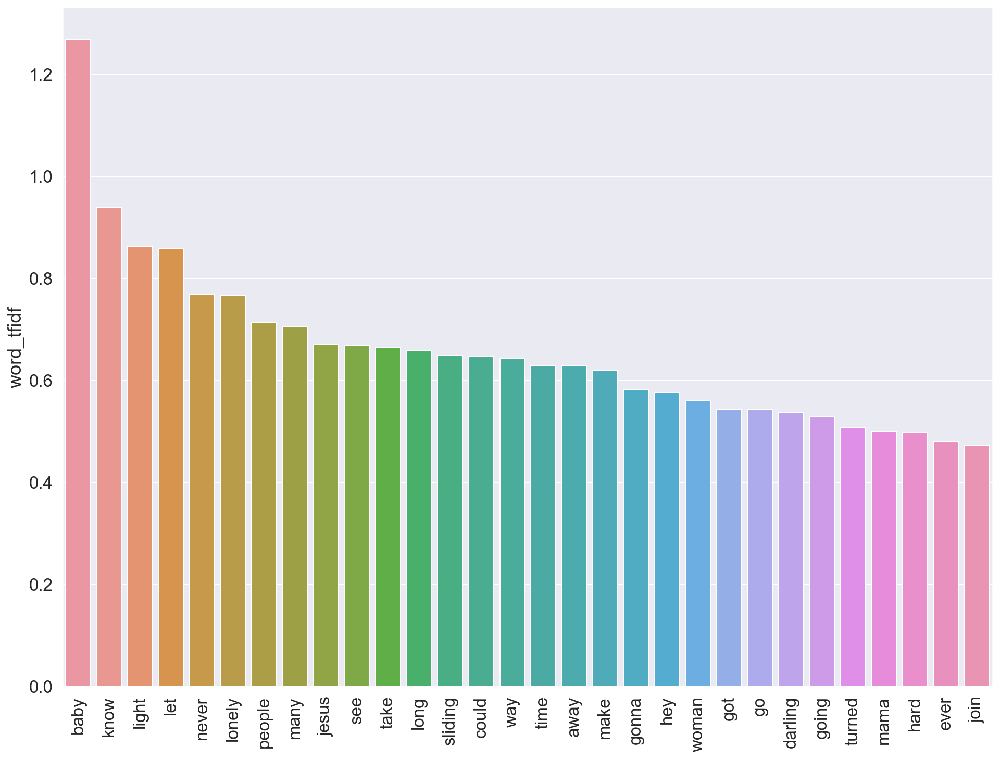

 
Artist: Lil Wayne
         word_tfidf
nigga      3.378627
like       3.311347
got        2.554026
bitch      2.062168
know       1.877715
niggas     1.831918
fuck       1.765038
get        1.718144
love       1.674779
shit       1.529972
go         1.448093
ya         1.434206
see        1.350167
right      1.304229
one        1.301770
let        1.267271
carter     1.188954
bitches    1.187315
money      1.166617
weezy      1.148481
tell       1.134269
cause      1.064271
baby       1.063727
make       1.055883
call       0.994644
young      0.979818
gun        0.964309
look       0.958073
say        0.951299
home       0.909379


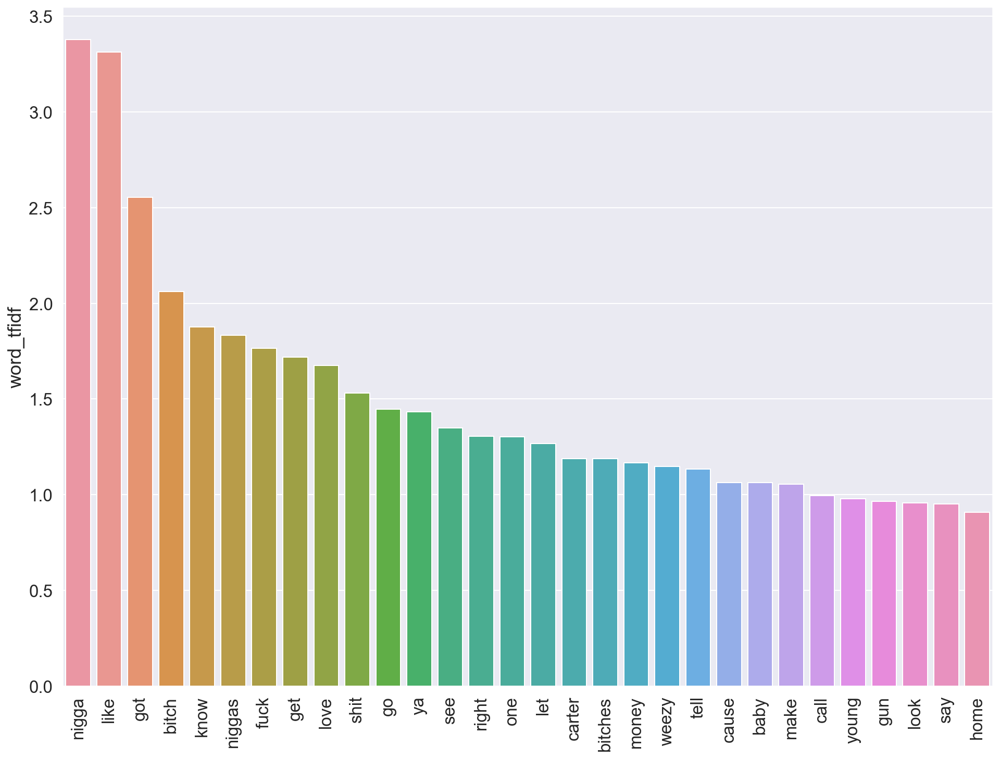

 
Artist: Linkin Park
            word_tfidf
away          2.527669
one           2.282776
go            2.198009
let           2.189323
like          2.167206
know          1.863136
see           1.773223
time          1.570892
never         1.502601
want          1.474973
back          1.441491
take          1.347624
say           1.235121
someone       1.209861
right         1.164048
inside        1.139012
alone         1.099514
cause         1.079166
everything    1.038450
even          1.036949
way           1.021206
give          0.995707
come          0.983961
got           0.981219
feel          0.961875
skin          0.954207
things        0.947266
try           0.931093
become        0.930975
find          0.910212


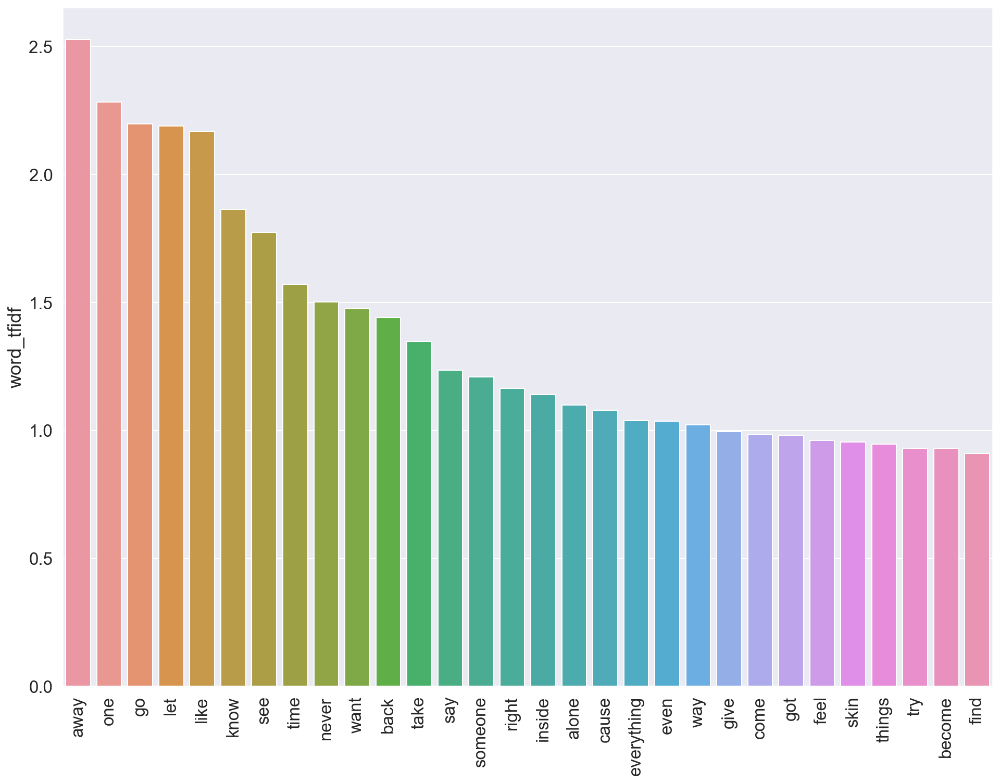

 
Artist: Mac Miller
        word_tfidf
like      3.423718
get       3.214822
got       2.632218
love      2.326651
go        2.321075
know      2.247769
fuck      2.019589
shit      2.014502
mind      1.935774
world     1.910957
never     1.884423
keep      1.818469
back      1.794709
let       1.772369
take      1.768784
one       1.735029
need      1.695768
life      1.661023
little    1.651261
wanna     1.543574
way       1.528034
time      1.510774
night     1.474675
cause     1.471999
see       1.465766
right     1.463252
money     1.442588
wake      1.421870
think     1.413091
high      1.405293


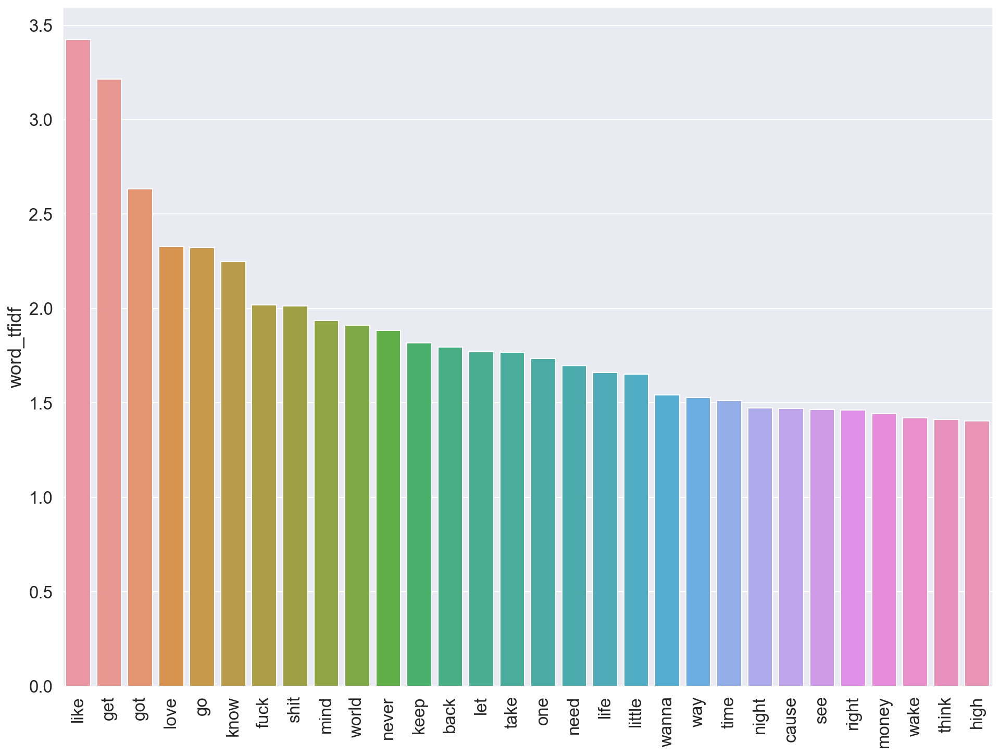

 
Artist: Metallica
            word_tfidf
never         1.769134
hey           1.078453
gone          0.733020
sleeps        0.667427
one           0.651881
know          0.634256
anger         0.626896
nothing       0.618784
light         0.602079
forgive       0.588716
man           0.574618
known         0.562230
wish          0.541483
self          0.530411
felt          0.525990
destruct      0.524686
want          0.524328
pain          0.520428
fame          0.518287
thou          0.506224
holier        0.506224
open          0.490194
unforgiven    0.482763
say           0.458815
true          0.447753
cared         0.425384
eyes          0.424366
hold          0.423881
sad           0.422869
crown         0.416525


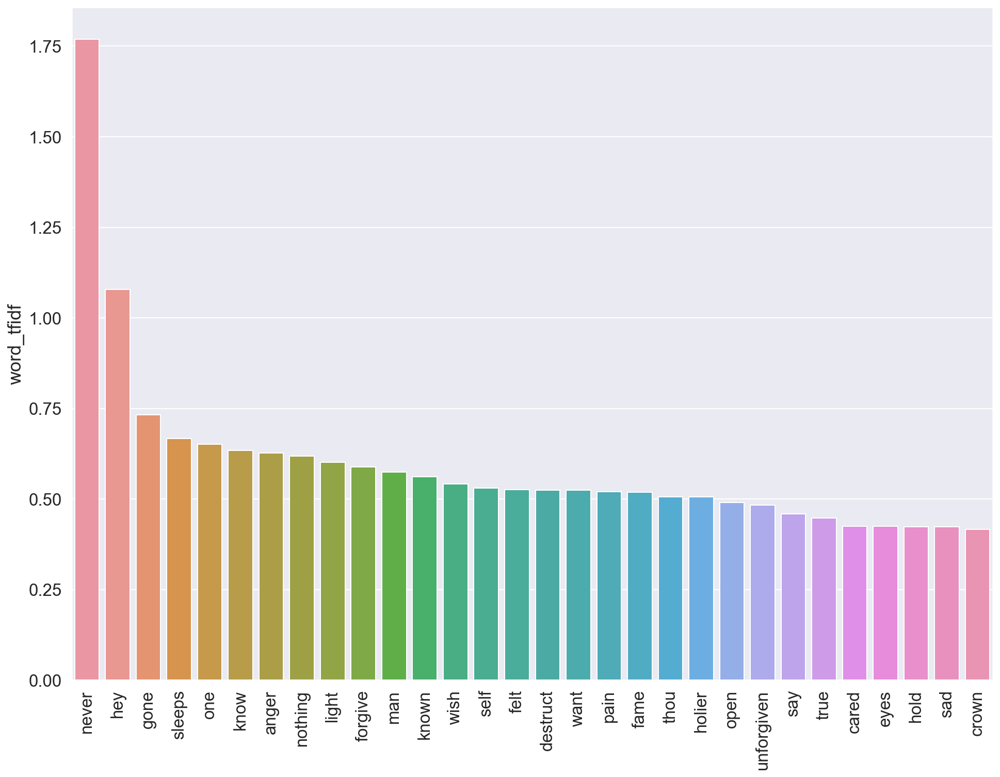

 
Artist: Nirvana
           word_tfidf
away         1.392522
way          1.324381
go           1.084438
rape         0.923425
hello        0.909005
take         0.872417
memoria      0.766791
stay         0.750920
sun          0.723879
said         0.688059
grandma      0.682032
home         0.653253
like         0.650134
mother       0.639832
crack        0.638368
got          0.635363
one          0.622196
gonna        0.599158
happy        0.595968
find         0.589458
care         0.587363
something    0.579754
mmm          0.579754
let          0.561221
sky          0.558347
wing         0.545303
think        0.540350
gun          0.530855
could        0.493008
advice       0.487305


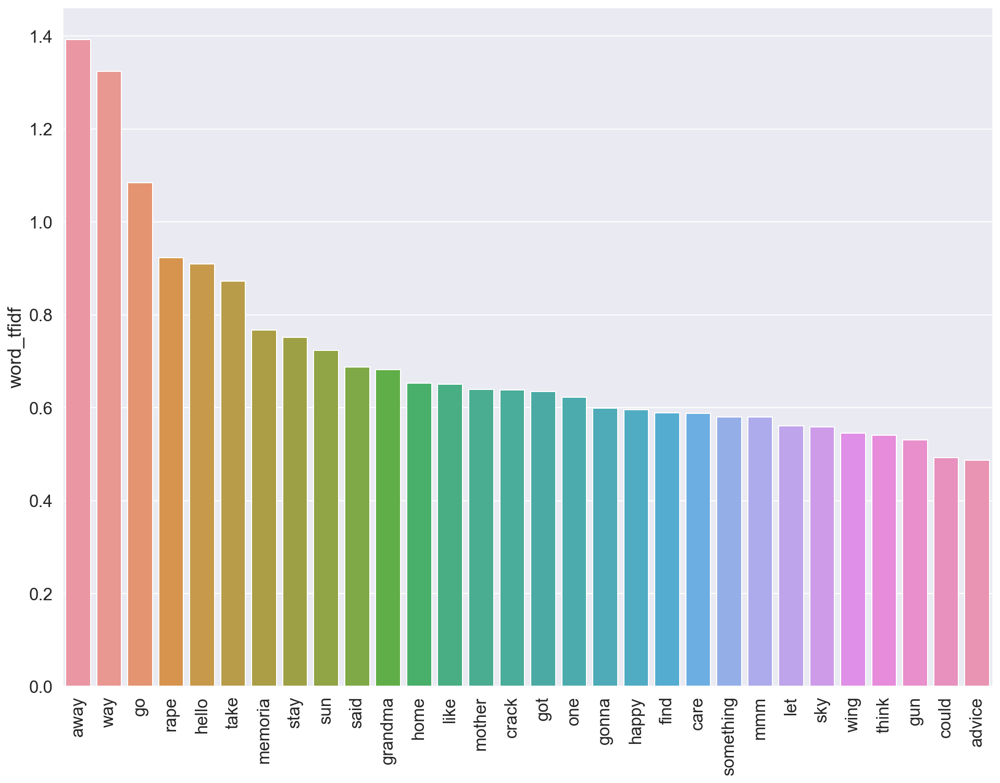

 
Artist: Passion Pit
            word_tfidf
go            1.444816
ever          1.063933
let           1.011506
higher        0.981578
take          0.958064
things        0.838679
walk          0.814602
like          0.779066
get           0.757080
sorry         0.735445
never         0.729245
love          0.719211
way           0.704631
away          0.667372
another       0.654966
alright       0.593227
make          0.555333
impossible    0.553625
comes         0.550965
design        0.545037
know          0.543170
world         0.528340
one           0.508486
oiche         0.497125
fheil         0.497125
means         0.465613
think         0.453286
could         0.429575
come          0.425931
life          0.414069


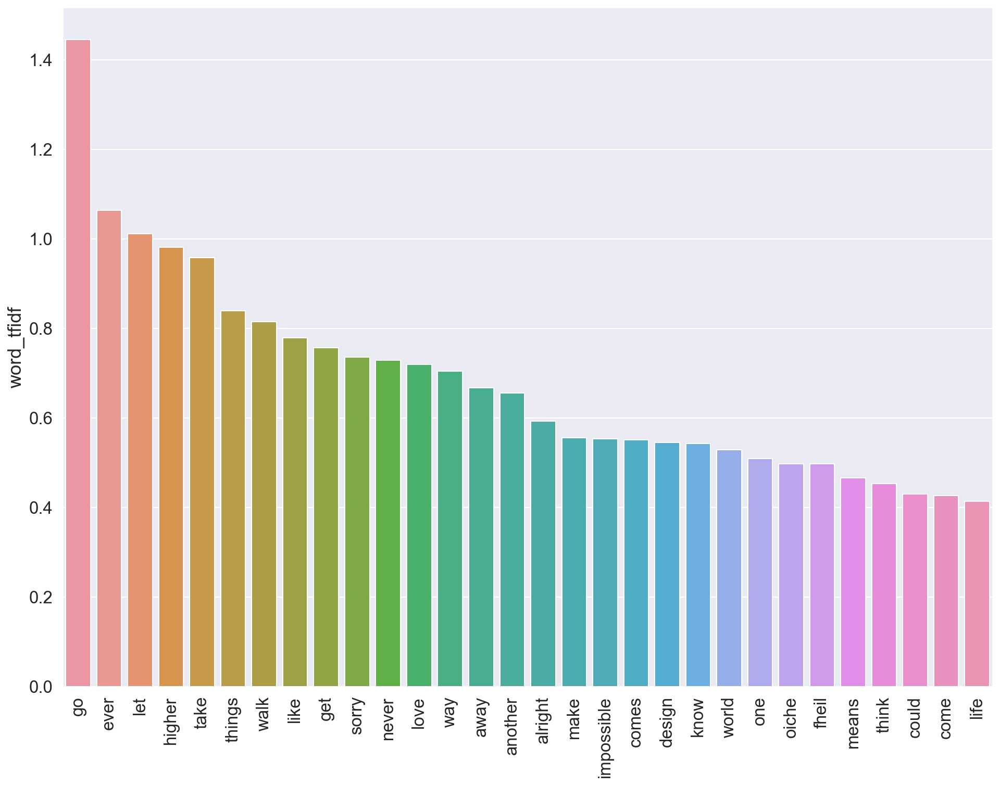

 
Artist: Radiohead
          word_tfidf
one         1.379374
lost        1.366135
get         1.347833
know        1.305917
come        1.288583
nothing     1.249492
let         1.215690
want        1.197935
like        1.168273
end         1.041687
go          1.009224
back        0.964722
take        0.952209
got         0.934183
best        0.911349
walking     0.906149
rain        0.898566
children    0.879431
round       0.872054
slow        0.870663
else        0.868994
enough      0.861312
wrong       0.854272
first       0.826938
wears       0.811533
truth       0.811011
day         0.808733
light       0.806225
feel        0.797704
time        0.790424


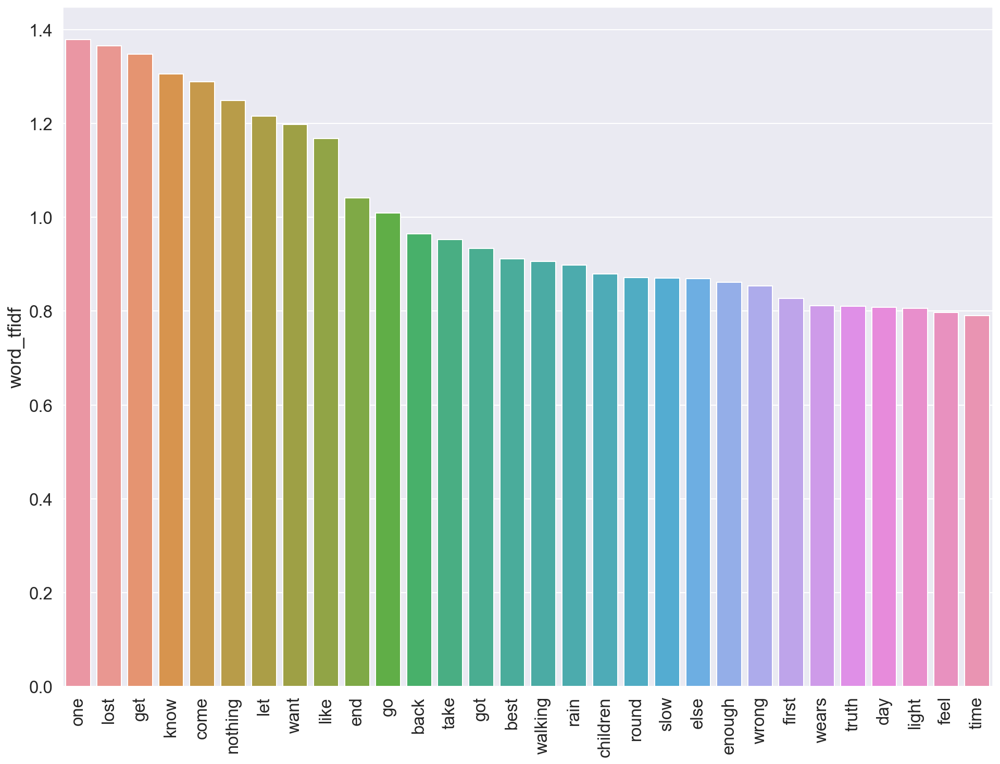

 
Artist: Red Hot Chili Peppers
         word_tfidf
know       2.303014
take       2.003720
got        1.943706
get        1.799299
love       1.767993
never      1.752489
could      1.622633
girl       1.503811
go         1.499366
like       1.487611
hey        1.485986
say        1.471574
way        1.399506
come       1.392399
want       1.369003
make       1.362989
around     1.352169
time       1.338367
another    1.220440
mind       1.217329
little     1.211036
wanna      1.161666
better     1.160335
lonely     1.142639
one        1.118353
please     1.105622
feel       1.104599
life       1.067262
ever       1.038594
see        1.017421


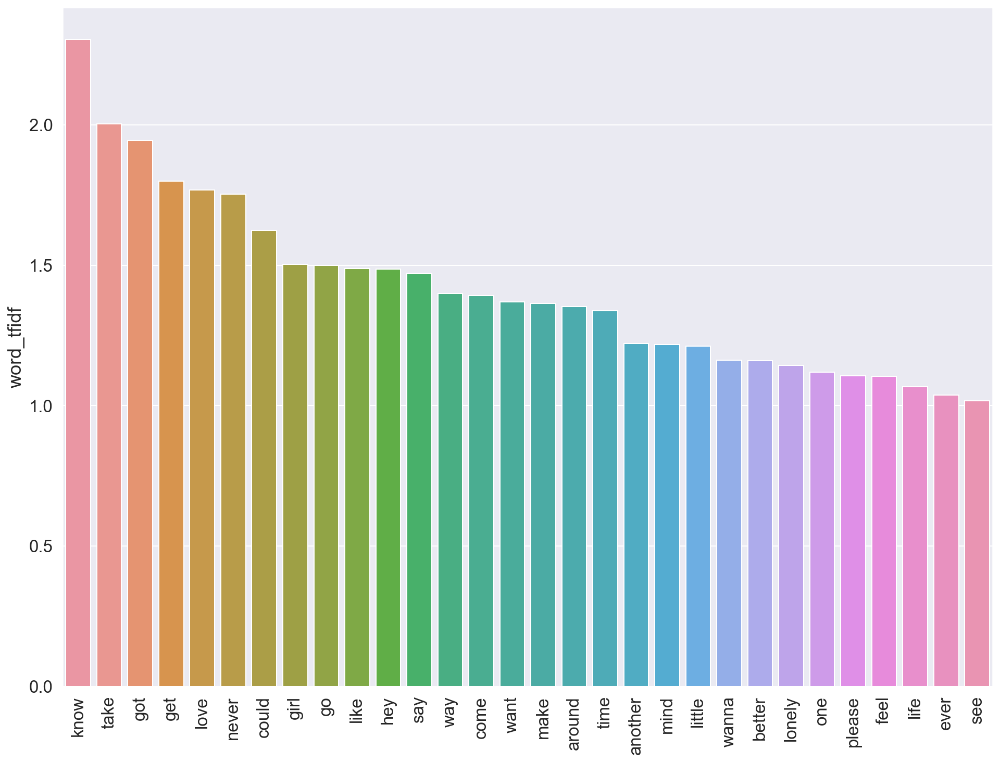

 
Artist: Rihanna
         word_tfidf
love       3.763081
like       2.286576
know       2.013812
baby       1.825613
wanna      1.523984
boy        1.519609
got        1.506516
night      1.489539
said       1.428235
take       1.417889
bitch      1.345762
one        1.332456
hard       1.326947
let        1.306416
want       1.283527
feel       1.273532
cause      1.236191
feeling    1.172772
ya         1.112887
see        1.107757
talk       1.090886
come       1.086444
get        1.078266
money      1.031339
work       1.023736
go         1.002844
jump       0.988019
never      0.956094
away       0.944445
need       0.940985


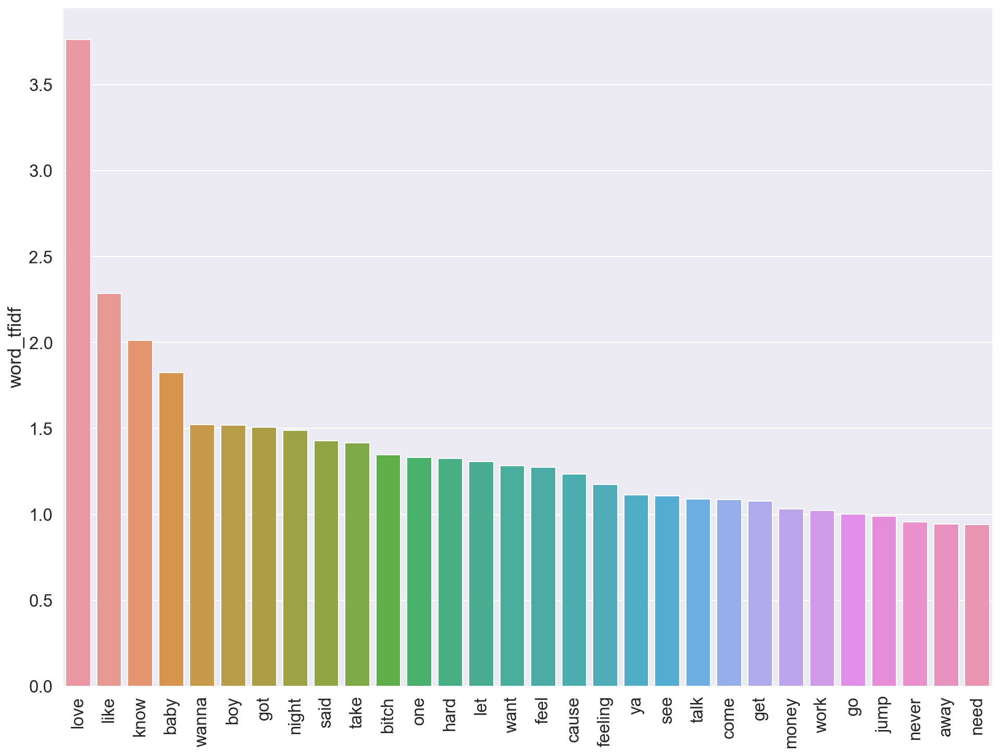

 
Artist: Slipknot
            word_tfidf
know          2.314675
fuck          2.134672
life          1.978886
never         1.956015
inside        1.875938
let           1.714199
get           1.611328
one           1.577078
like          1.416231
build         1.408683
got           1.367288
die           1.363455
see           1.317344
give          1.260592
everything    1.259369
world         1.231643
shit          1.225547
kill          1.209333
wanna         1.162557
way           1.127181
dead          1.126039
heart         1.124845
fucking       1.093943
want          1.075412
save          1.073197
kind          1.066327
come          1.026172
end           1.007261
make          0.999818
nothing       0.960106


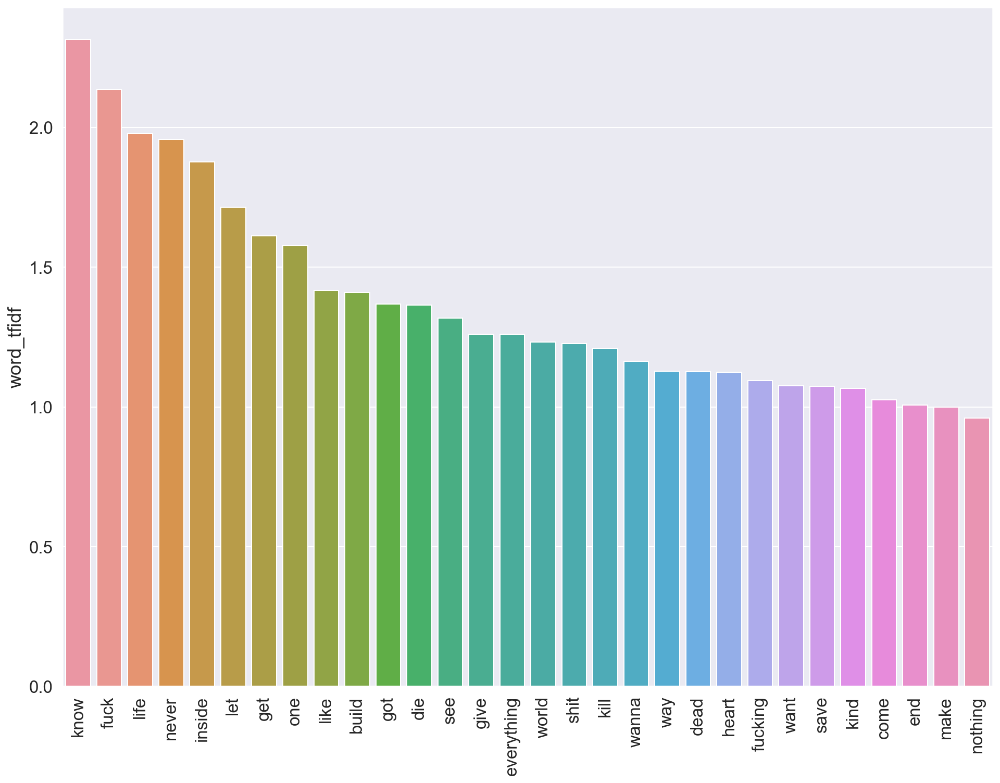

 
Artist: System Of A Down
               word_tfidf
feel             1.409884
around           1.276888
know             1.251469
die              1.197332
right            1.120884
one              1.115039
us               1.104374
day              1.091917
need             1.073975
mind             1.063030
hollywood        1.053756
car              1.047600
hey              1.046826
life             1.044370
people           1.036903
away             1.024679
everybody        0.998342
pogo             0.988873
go               0.968855
boom             0.954918
take             0.943919
world            0.829231
eat              0.825376
never            0.822950
see              0.800738
little           0.794364
got              0.777953
motherfucking    0.770188
waiting          0.765532
sweet            0.756337


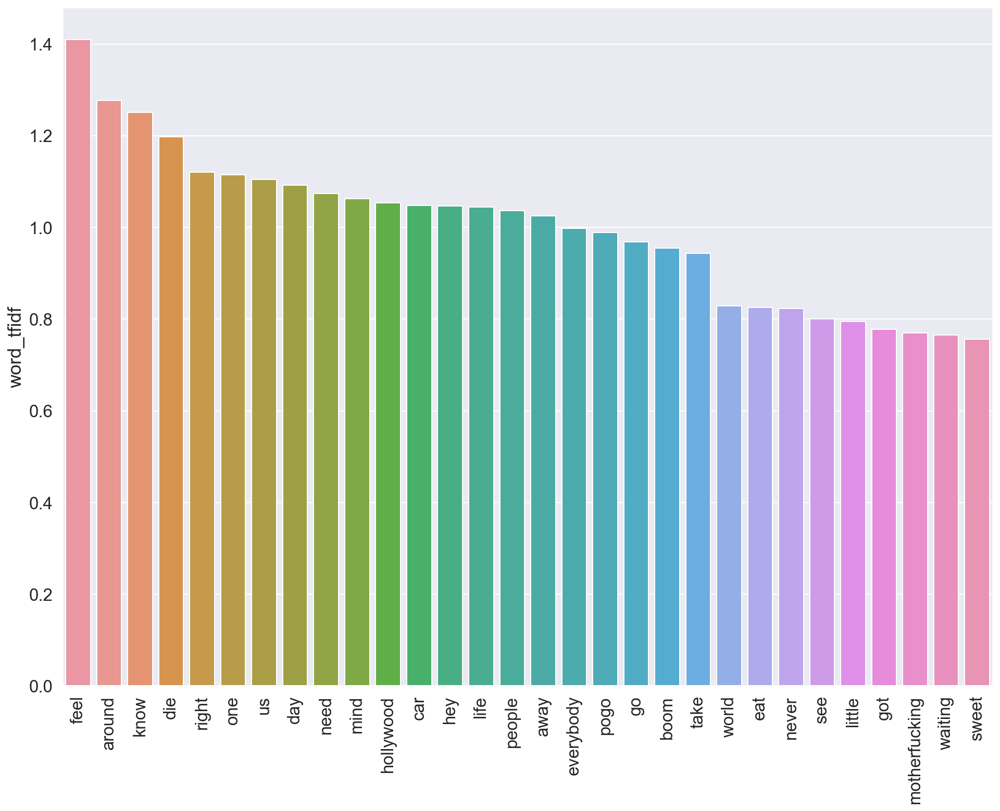

 
Artist: Tame Impala
            word_tfidf
know          1.701502
like          1.400468
something     1.328742
go            1.125840
life          1.049357
eventually    0.851418
one           0.793308
time          0.793065
feel          0.784598
could         0.758420
hard          0.748676
never         0.748217
come          0.742215
day           0.729739
feels         0.726889
love          0.725361
get           0.713392
really        0.680330
close         0.671112
ready         0.670629
past          0.662660
long          0.651199
got           0.633349
nothing       0.633187
end           0.614816
let           0.612280
hell          0.586021
real          0.541445
happen        0.539081
take          0.502764


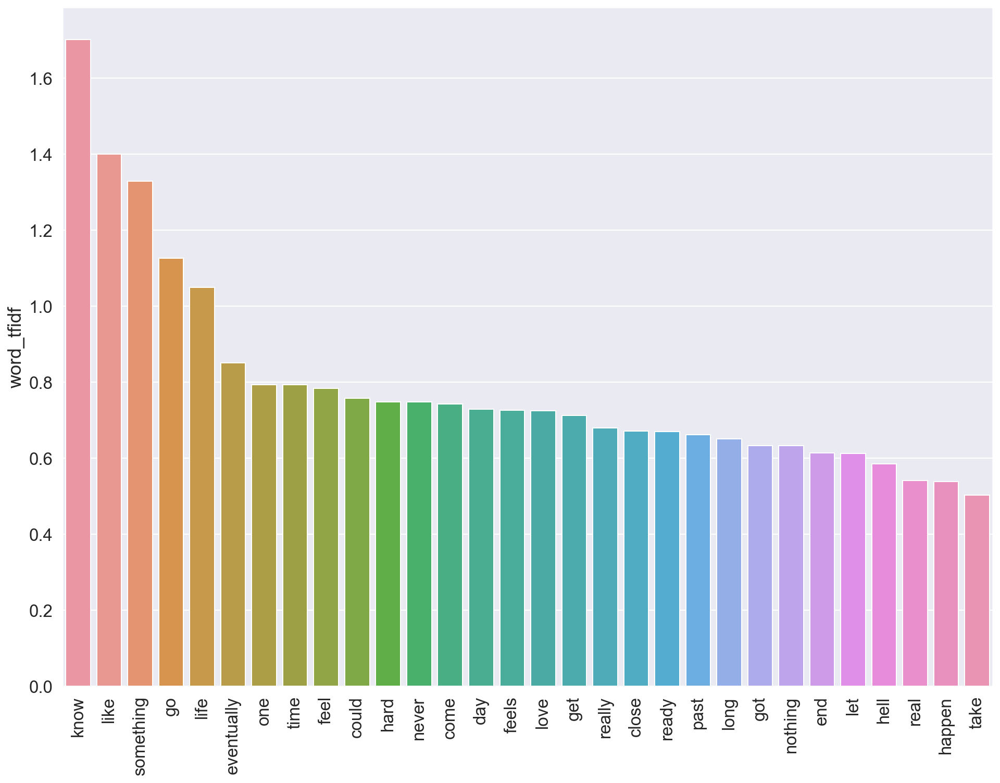

 
Artist: Taylor Swift
       word_tfidf
love     2.725341
know     2.710008
like     2.625555
never    2.190256
think    2.085275
baby     1.985045
time     1.859930
say      1.816569
ever     1.745179
back     1.730058
see      1.716693
got      1.710661
one      1.701513
want     1.668674
cause    1.665607
made     1.585720
tell     1.577065
look     1.508534
go       1.491226
said     1.450040
eyes     1.442239
wanna    1.381145
ey       1.354100
wish     1.347669
way      1.287515
could    1.236638
feel     1.230832
bad      1.227021
long     1.224059
come     1.218296


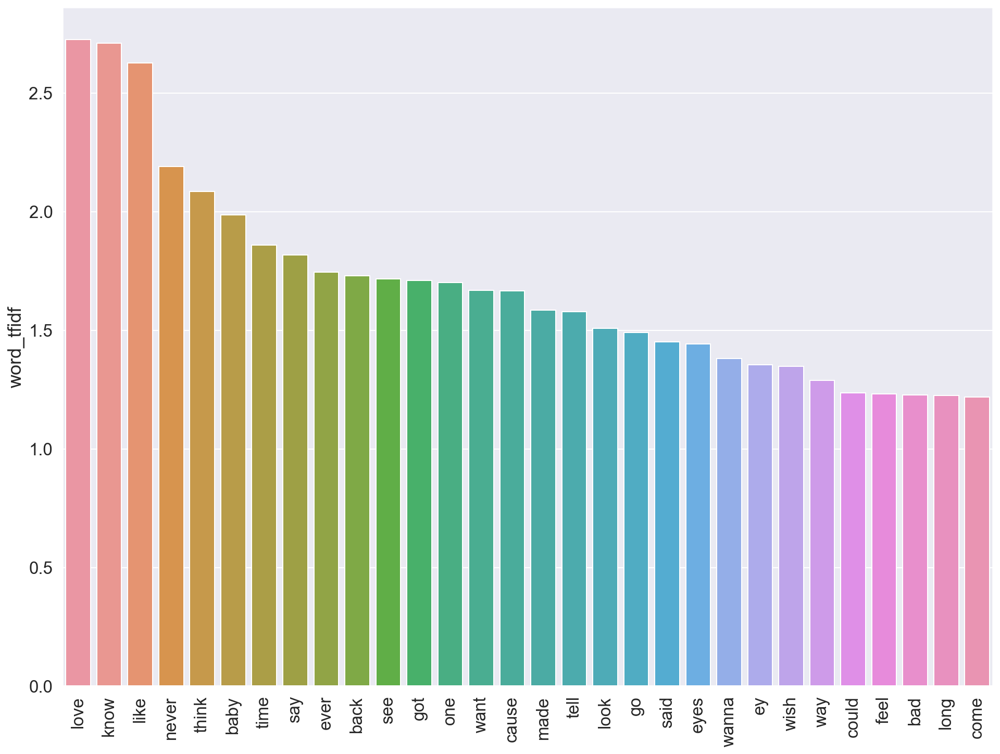

 
Artist: The Black Keys
         word_tfidf
got        3.525810
know       3.309058
go         3.115982
hey        2.796359
get        2.588771
love       2.565015
let        2.262134
one        2.207756
like       2.193479
heart      2.138021
thing      2.058203
never      2.044635
hold       2.025947
mind       1.967865
way        1.931332
back       1.919647
right      1.906984
see        1.851029
well       1.830437
door       1.747049
eyes       1.745232
lies       1.744822
away       1.682165
darling    1.679811
time       1.672845
mine       1.655803
give       1.621761
take       1.619329
said       1.552742
gonna      1.508928


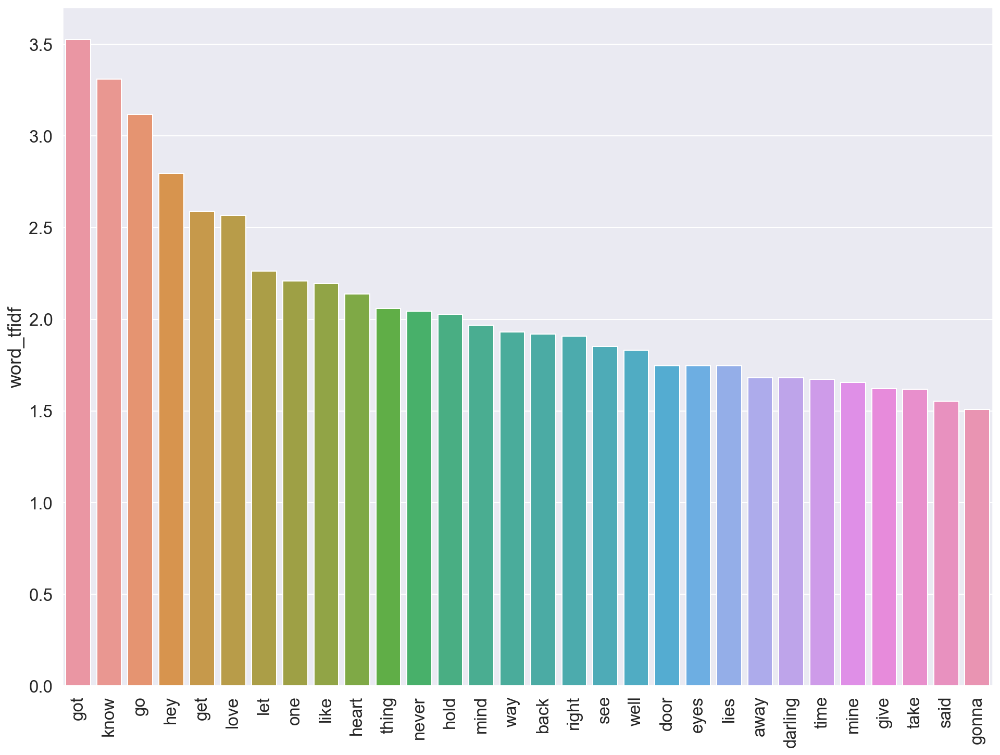

 
Artist: The Rolling Stones
         word_tfidf
got        0.950092
come       0.938541
monkey     0.902122
angie      0.885829
away       0.790617
thumb      0.718689
roll       0.681336
heart      0.641533
shot       0.610158
want       0.599608
black      0.565638
rider      0.473603
change     0.471618
painted    0.471365
baby       0.457944
breaker    0.457812
see        0.415395
wanna      0.403252
say        0.387188
well       0.385898
need       0.382005
take       0.369183
someone    0.360134
babe       0.358403
get        0.358093
right      0.356020
still      0.337014
tear       0.332954
world      0.323801
goodbye    0.320308


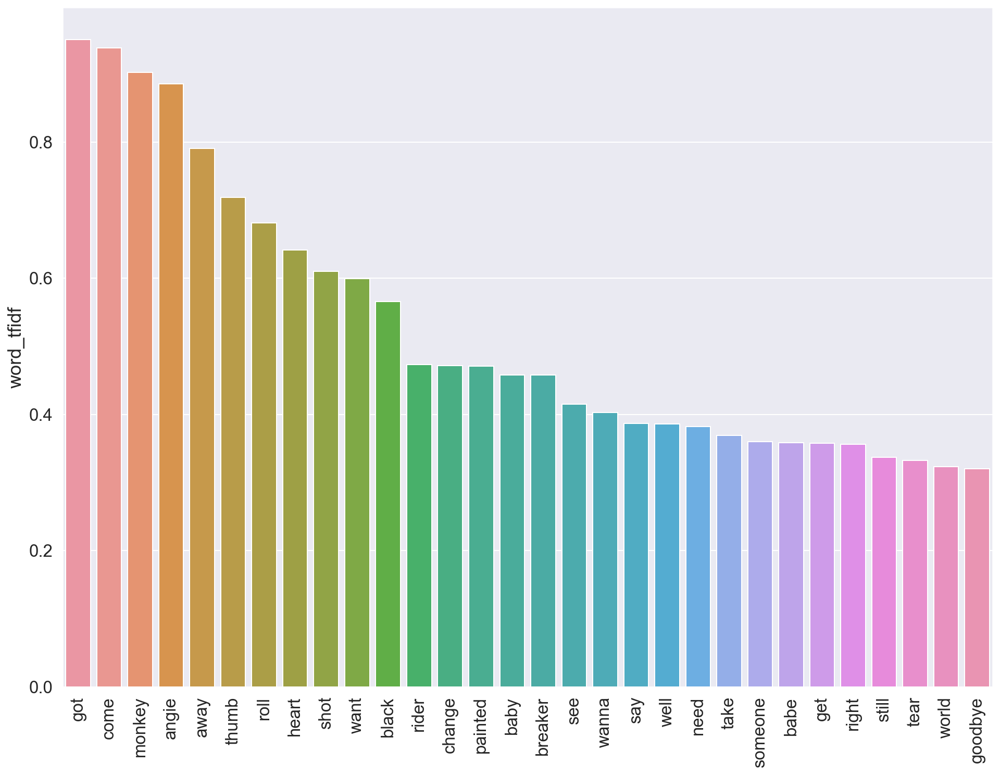

 
Artist: The Weeknd
          word_tfidf
know        3.319109
baby        2.461837
love        2.434597
got         1.960819
girl        1.911478
need        1.833202
want        1.832150
feel        1.747215
nothing     1.721576
cause       1.521240
thursday    1.366747
shit        1.364693
could       1.361587
let         1.337404
make        1.301615
life        1.270880
keep        1.219378
somebody    1.126173
go          1.125914
hey         1.117230
like        1.116990
find        1.114686
money       1.054408
ohh         0.992408
xo          0.987669
gone        0.971915
coming      0.962609
get         0.930878
never       0.920559
take        0.907250


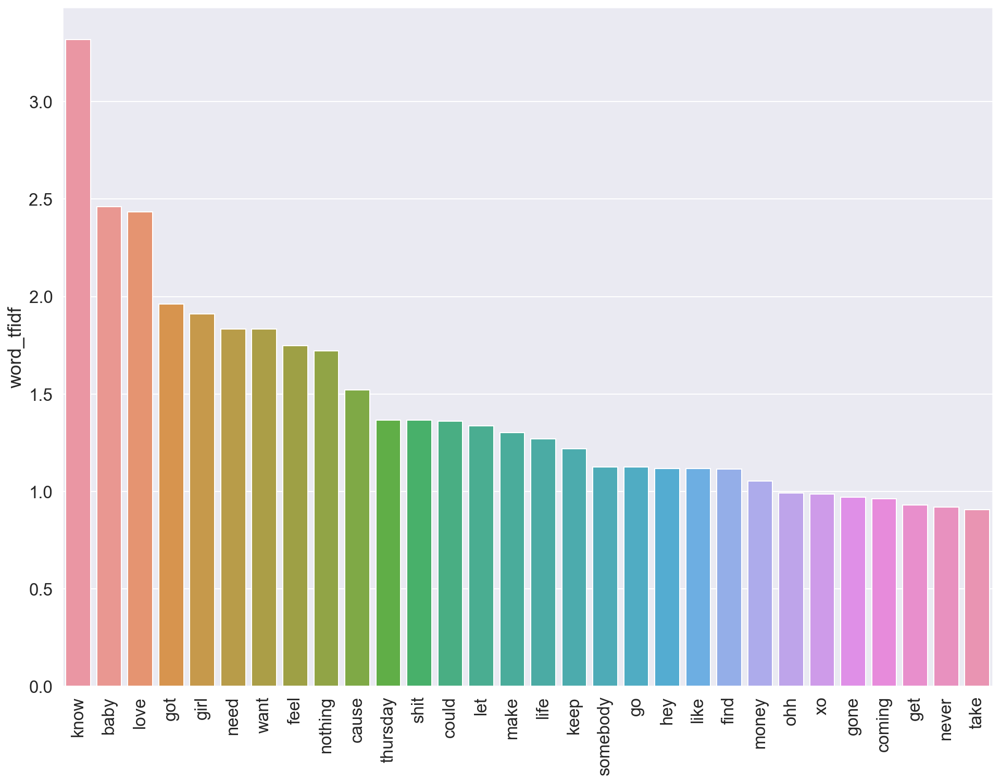

 
Artist: Tyler, The Creator
         word_tfidf
fuck       2.590410
like       2.292528
fucking    2.056456
nigga      2.050391
shit       1.576441
bitch      1.447494
got        1.312187
back       1.306967
niggas     1.288932
time       1.245912
let        1.219122
wang       1.217576
girl       1.213402
go         1.164618
golf       1.126396
call       1.118388
get        1.106000
know       1.075511
take       1.044604
see        0.920564
cause      0.905831
find       0.901053
feel       0.868997
run        0.827316
big        0.813506
bag        0.791086
couple     0.790808
ya         0.788554
one        0.785702
come       0.779780


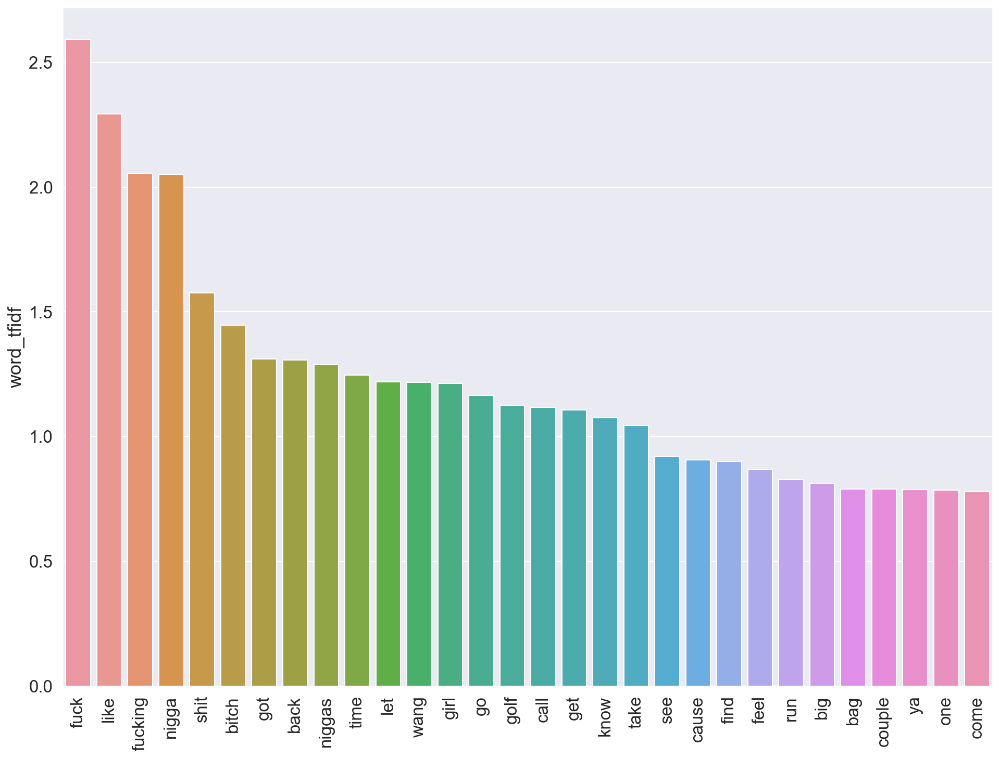

 
Artist: Wiz Khalifa
        word_tfidf
got       1.641462
hard      1.533171
niggas    1.457195
get       1.412253
us        1.403702
roll      1.374094
know      1.342642
nigga     1.198216
like      1.151333
go        1.142571
money     1.104899
shit      1.102338
let       1.082879
gon       1.066263
cause     1.062982
real      1.033048
make      1.004382
wanna     0.999334
say       0.990588
gang      0.986739
hol       0.964540
okay      0.957208
wake      0.926254
goin      0.921062
party     0.863370
fuck      0.861715
light     0.856866
see       0.826665
yup       0.824472
one       0.818185


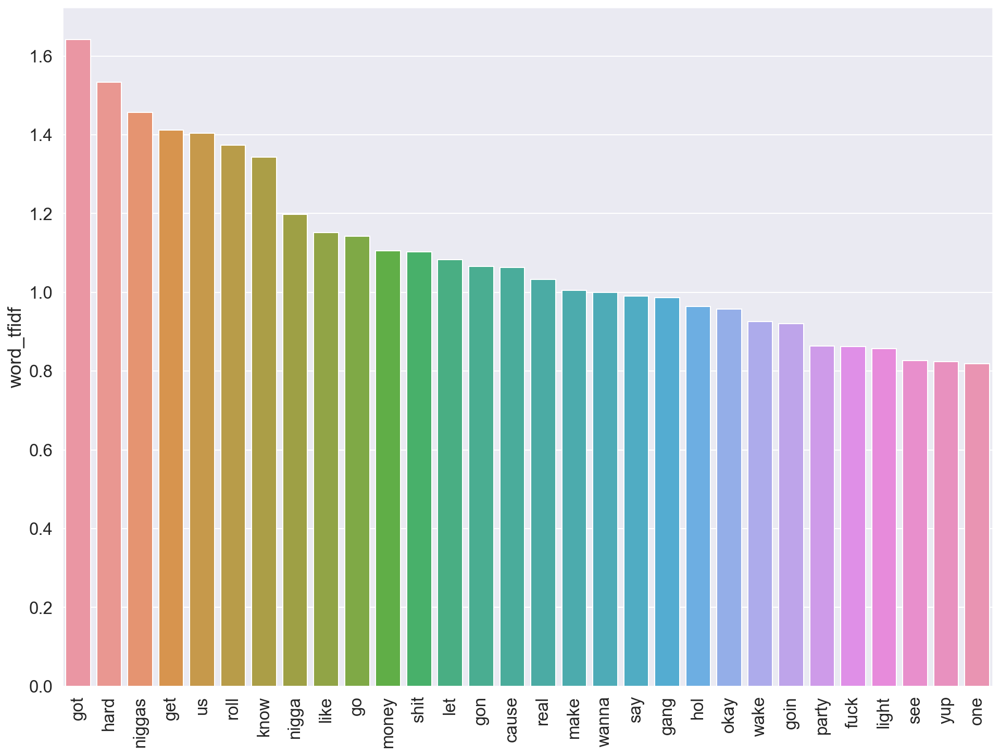

In [51]:
for name in data.artist_name.unique():
    tvec = TfidfVectorizer(strip_accents='unicode',
                       stop_words=stop, 
                       ngram_range=(1, 1))

    X_all = tvec.fit_transform(data[data.artist_name==name].lyrics_processed)
    columns = tvec.get_feature_names()
    
    TVEC = pd.DataFrame(X_all.toarray(),
                  columns=tvec.get_feature_names())
    print('Artist: {}'.format(name))
    
    tvec_df = pd.DataFrame(TVEC.sum().sort_values(ascending=False)[:30], columns=['word_tfidf'])
    print(tvec_df)
    
    fig, ax = plt.subplots(figsize=(16,12))
    count_bar = sns.barplot(x=tvec_df.index, y=tvec_df.word_tfidf);
    count_bar.set_xticklabels(labels=tvec_df.index,rotation=90);
    plt.show()
    print(' ')